In [9]:
# Set up autoreload
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
# Sys Imports
import sys
from pathlib import Path

github_root = Path.cwd().resolve().parents[3]
sys.path.append(str(github_root))


In [11]:
# Self-def imports
from src.dl.data import get_data
from src.dl.loaders import *
from src.dl.train import train_model

In [12]:
# Package imports
import torch
import torch.nn as nn
import numpy as np

In [13]:
# Get device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [14]:
# Data hyperparams
save_path = rf"{github_root}\data\simpler_data_rwc.csv"
batch_size = 20
epoch = 80
n_train = 100
n_val = 24
n_test = 20
n_tb_epoch = n_train // batch_size

# Model hyperparam and weights
model_cfg = {'hidden_dim': [128, 128, 128, 128]}
statedict_path = rf"{github_root}\runs\dl\simpler_data\mlp\mlp_128_4layer\model_weights.pth"

# Training hyperparams
lr = 1e-4
weight_decay = 1e-2

# Global hyperparams
n_randoms = 50 # Number of random seeds to use to split the data, and to train on. The metrics will be
               # recrded for each random seed, to create distributions of metrics.
master_seed = 1878439041 # The master seed to use to generate the random seeds for data splitting and training. This is used to ensure reproducibility.
seed_generator = np.random.default_rng(master_seed)
mccv_seeds = seed_generator.integers(low=0, high=2**32 - 1, size=n_randoms).tolist()

In [15]:
for i in mccv_seeds:
    save_dir = github_root / 'runs' / 'dl' / 'atmo_data' / 'mlp_128_4layer' / str(i)
    save_dir.mkdir(parents=True, exist_ok=True)

C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007584
Epoch 1/80, Step 2/5, Train Loss: 0.007007
Epoch 1/80, Step 3/5, Train Loss: 0.013352
Epoch 1/80, Step 4/5, Train Loss: 0.007338
Epoch 1/80, Step 5/5, Train Loss: 0.006790
Epoch 1/80 complete. Train Loss: 0.008414, Val Loss: 0.005515
Epoch 2/80, Step 1/5, Train Loss: 0.016482
Epoch 2/80, Step 2/5, Train Loss: 0.005039
Epoch 2/80, Step 3/5, Train Loss: 0.021248
Epoch 2/80, Step 4/5, Train Loss: 0.009127
Epoch 2/80, Step 5/5, Train Loss: 0.012997
Epoch 2/80 complete. Train Loss: 0.012979, Val Loss: 0.005556
Epoch 3/80, Step 1/5, Train Loss: 0.007023
Epoch 3/80, Step 2/5, Train Loss: 0.007233
Epoch 3/80, Step 3/5, Train Loss: 0.008752
Epoch 3/80, Step 4/5, Train Loss: 0.007612
Epoch 3/80, Step 5/5, Train Loss: 0.011927
Epoch 3/80 complete. Train Loss: 0.008509, Val Loss: 0.005649
Epoch 4/80, Step 1/5, Train Loss: 0.007986
Epoch 4/80, Step 2/5, Train Loss: 0.005815
Epoch 4/80, Step 3/5, Train Loss: 0.005458
Epoch 4/80, Step 4/5, Train Loss: 0.0086

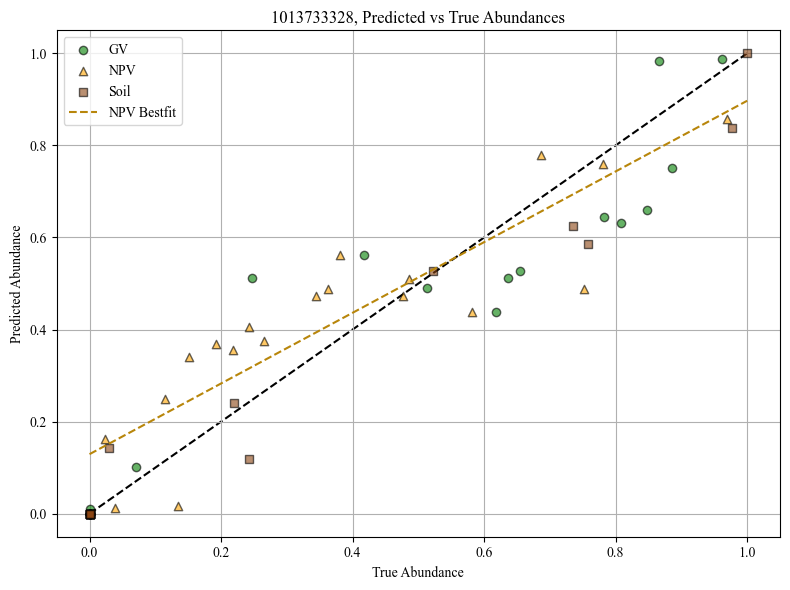

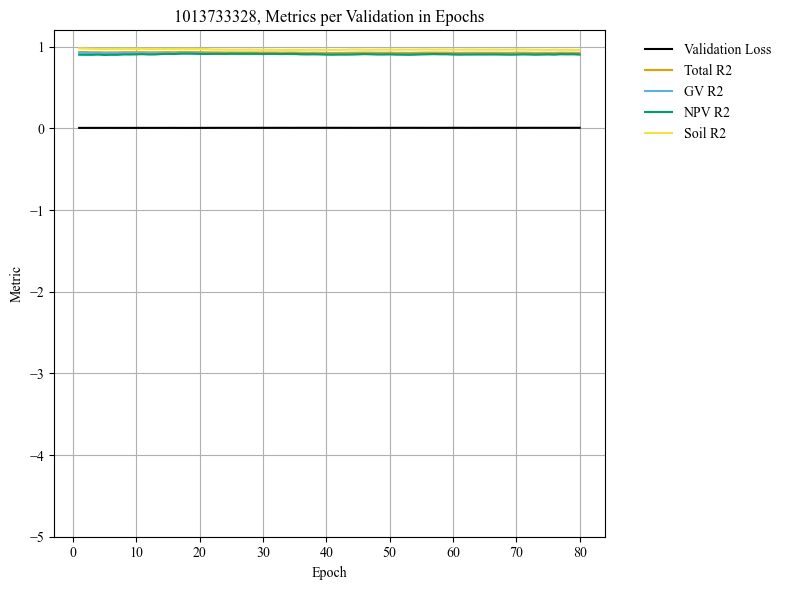

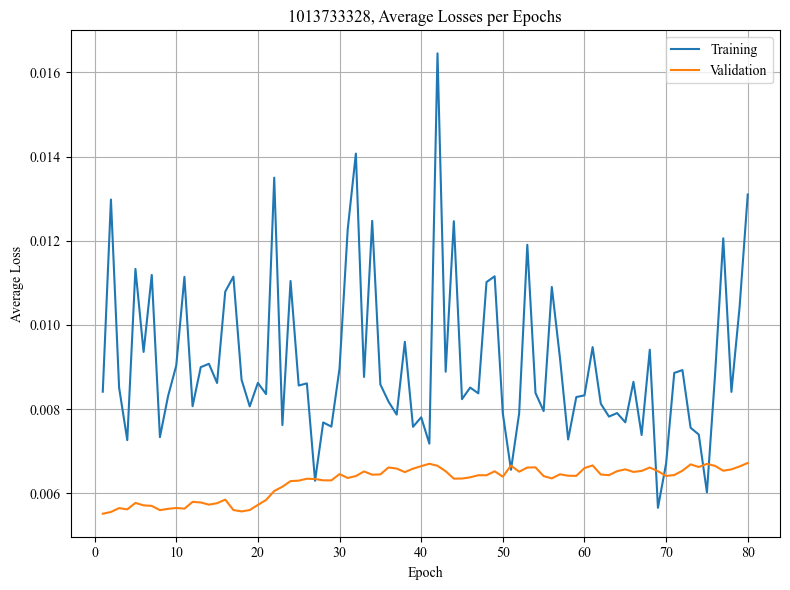

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.005617
Epoch 1/80, Step 2/5, Train Loss: 0.013021
Epoch 1/80, Step 3/5, Train Loss: 0.007818
Epoch 1/80, Step 4/5, Train Loss: 0.009629
Epoch 1/80, Step 5/5, Train Loss: 0.015766
Epoch 1/80 complete. Train Loss: 0.010370, Val Loss: 0.007168
Epoch 2/80, Step 1/5, Train Loss: 0.004922
Epoch 2/80, Step 2/5, Train Loss: 0.006717
Epoch 2/80, Step 3/5, Train Loss: 0.012188
Epoch 2/80, Step 4/5, Train Loss: 0.022584
Epoch 2/80, Step 5/5, Train Loss: 0.005909
Epoch 2/80 complete. Train Loss: 0.010464, Val Loss: 0.006297
Epoch 3/80, Step 1/5, Train Loss: 0.009271
Epoch 3/80, Step 2/5, Train Loss: 0.010725
Epoch 3/80, Step 3/5, Train Loss: 0.014034
Epoch 3/80, Step 4/5, Train Loss: 0.012972
Epoch 3/80, Step 5/5, Train Loss: 0.016259
Epoch 3/80 complete. Train Loss: 0.012652, Val Loss: 0.006127
Epoch 4/80, Step 1/5, Train Loss: 0.005092
Epoch 4/80, Step 2/5, Train Loss: 0.007296
Epoch 4/80, Step 3/5, Train Loss: 0.010381
Epoch 4/80, Step 4/5, Train Loss: 0.0128

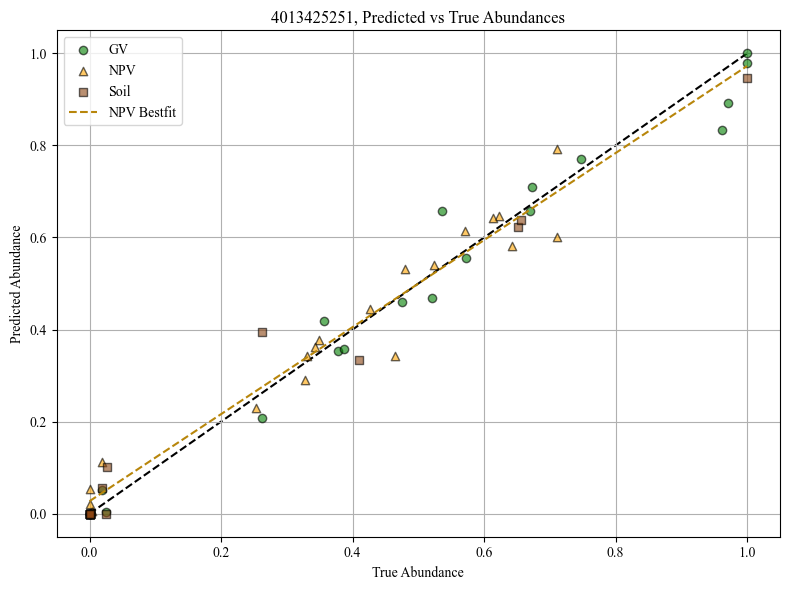

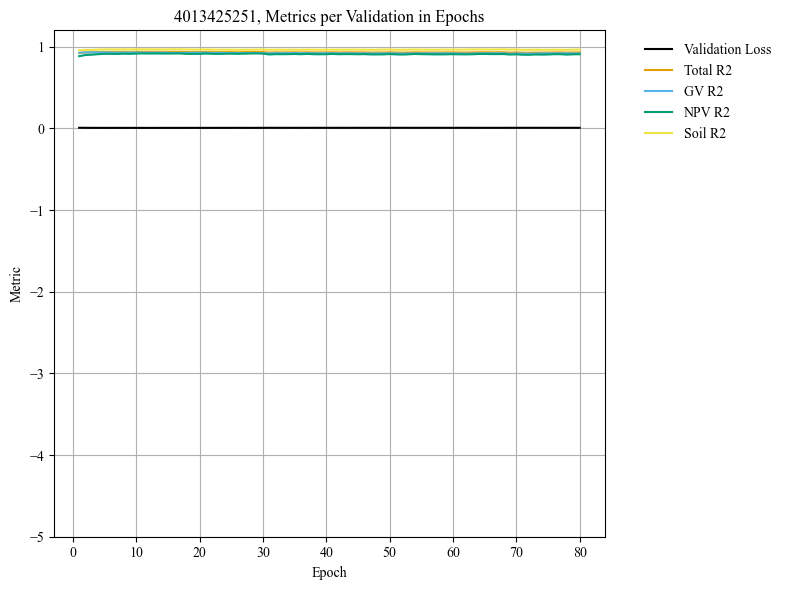

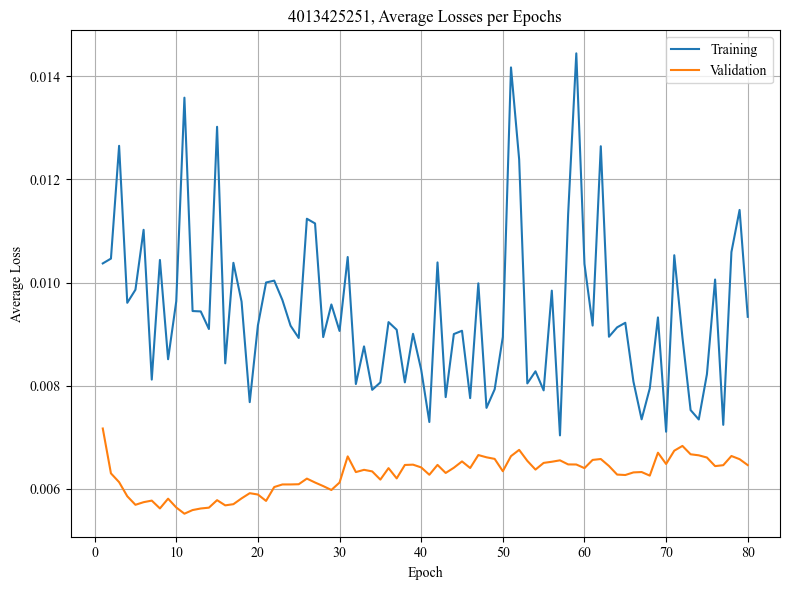

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018849
Epoch 1/80, Step 2/5, Train Loss: 0.008409
Epoch 1/80, Step 3/5, Train Loss: 0.014678
Epoch 1/80, Step 4/5, Train Loss: 0.009123
Epoch 1/80, Step 5/5, Train Loss: 0.010202
Epoch 1/80 complete. Train Loss: 0.012252, Val Loss: 0.004699
Epoch 2/80, Step 1/5, Train Loss: 0.016888
Epoch 2/80, Step 2/5, Train Loss: 0.010392
Epoch 2/80, Step 3/5, Train Loss: 0.006710
Epoch 2/80, Step 4/5, Train Loss: 0.016580
Epoch 2/80, Step 5/5, Train Loss: 0.008998
Epoch 2/80 complete. Train Loss: 0.011914, Val Loss: 0.004460
Epoch 3/80, Step 1/5, Train Loss: 0.015525
Epoch 3/80, Step 2/5, Train Loss: 0.011952
Epoch 3/80, Step 3/5, Train Loss: 0.011287
Epoch 3/80, Step 4/5, Train Loss: 0.013755
Epoch 3/80, Step 5/5, Train Loss: 0.012309
Epoch 3/80 complete. Train Loss: 0.012966, Val Loss: 0.004283
Epoch 4/80, Step 1/5, Train Loss: 0.005933
Epoch 4/80, Step 2/5, Train Loss: 0.020808
Epoch 4/80, Step 3/5, Train Loss: 0.016594
Epoch 4/80, Step 4/5, Train Loss: 0.0099

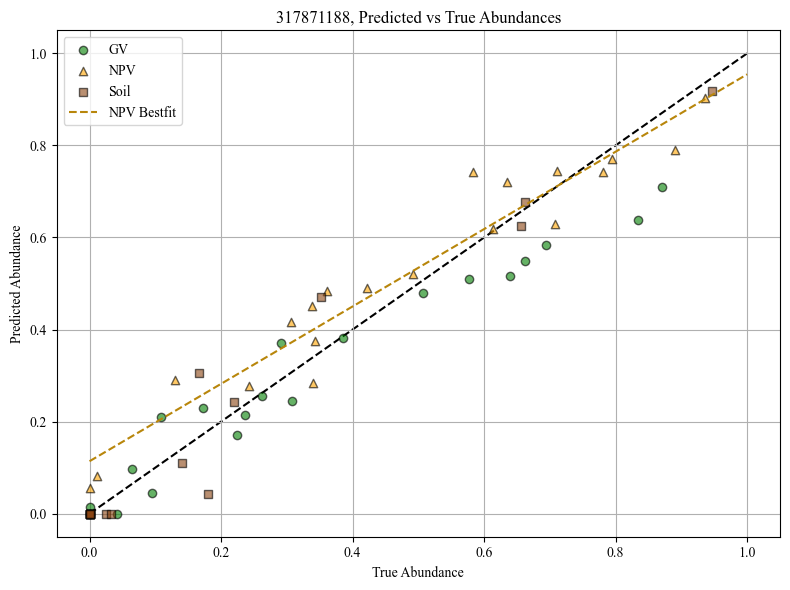

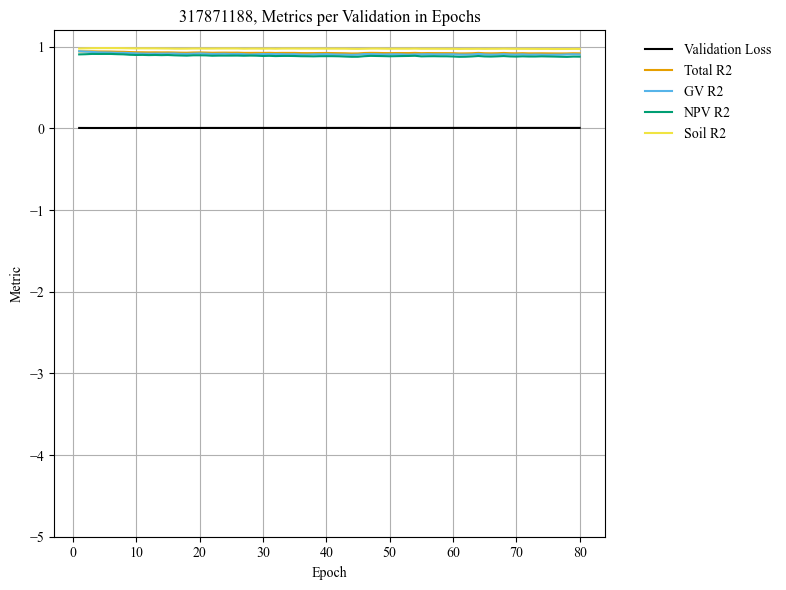

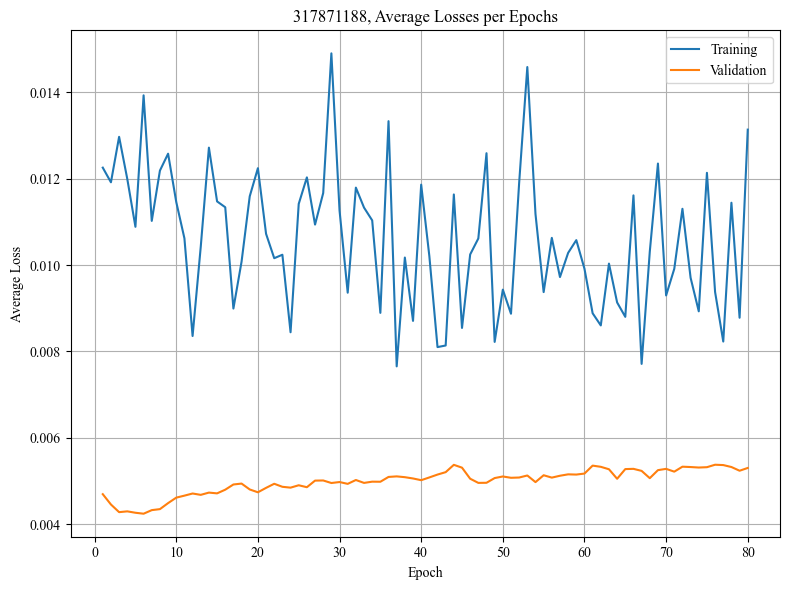

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007057
Epoch 1/80, Step 2/5, Train Loss: 0.021585
Epoch 1/80, Step 3/5, Train Loss: 0.012165
Epoch 1/80, Step 4/5, Train Loss: 0.013812
Epoch 1/80, Step 5/5, Train Loss: 0.010036
Epoch 1/80 complete. Train Loss: 0.012931, Val Loss: 0.007096
Epoch 2/80, Step 1/5, Train Loss: 0.008517
Epoch 2/80, Step 2/5, Train Loss: 0.008994
Epoch 2/80, Step 3/5, Train Loss: 0.022400
Epoch 2/80, Step 4/5, Train Loss: 0.013593
Epoch 2/80, Step 5/5, Train Loss: 0.016484
Epoch 2/80 complete. Train Loss: 0.013997, Val Loss: 0.006776
Epoch 3/80, Step 1/5, Train Loss: 0.011342
Epoch 3/80, Step 2/5, Train Loss: 0.011887
Epoch 3/80, Step 3/5, Train Loss: 0.003429
Epoch 3/80, Step 4/5, Train Loss: 0.008254
Epoch 3/80, Step 5/5, Train Loss: 0.009097
Epoch 3/80 complete. Train Loss: 0.008802, Val Loss: 0.006673
Epoch 4/80, Step 1/5, Train Loss: 0.010978
Epoch 4/80, Step 2/5, Train Loss: 0.008882
Epoch 4/80, Step 3/5, Train Loss: 0.007452
Epoch 4/80, Step 4/5, Train Loss: 0.0169

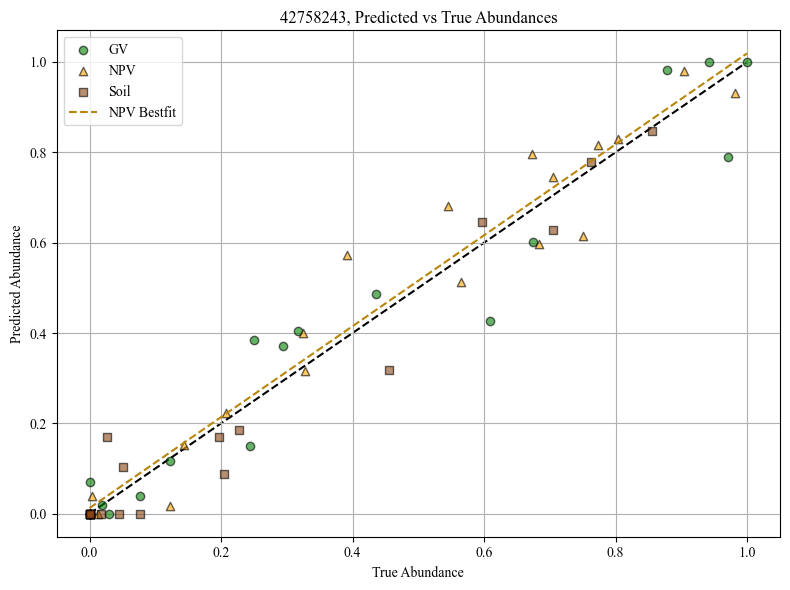

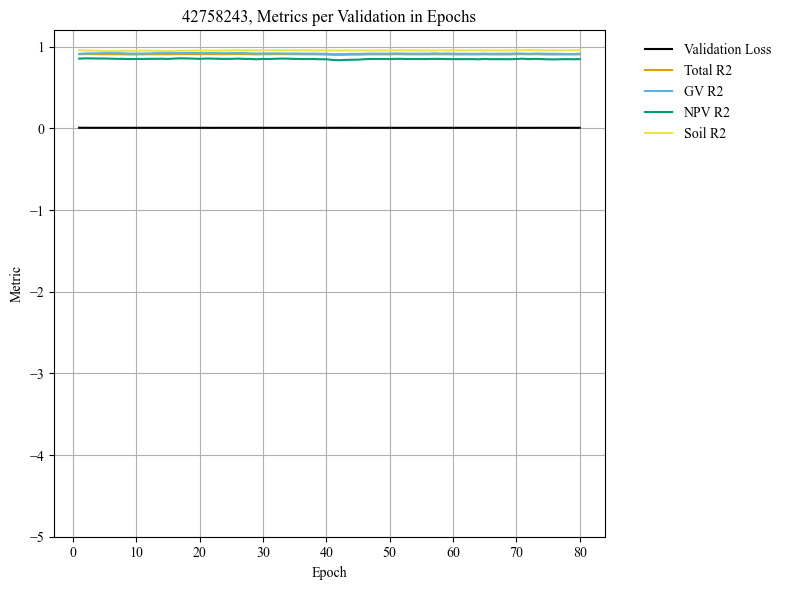

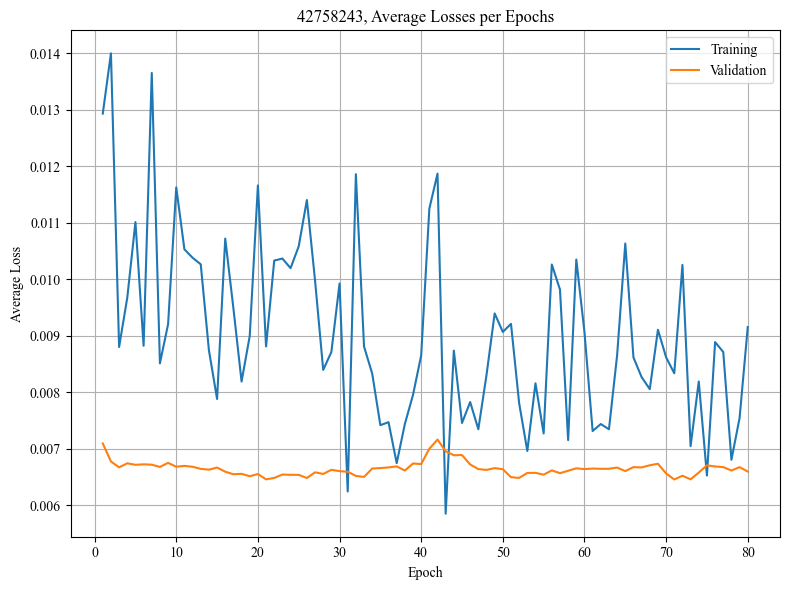

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006705
Epoch 1/80, Step 2/5, Train Loss: 0.014024
Epoch 1/80, Step 3/5, Train Loss: 0.011512
Epoch 1/80, Step 4/5, Train Loss: 0.006878
Epoch 1/80, Step 5/5, Train Loss: 0.015331
Epoch 1/80 complete. Train Loss: 0.010890, Val Loss: 0.012783
Epoch 2/80, Step 1/5, Train Loss: 0.010329
Epoch 2/80, Step 2/5, Train Loss: 0.007148
Epoch 2/80, Step 3/5, Train Loss: 0.013275
Epoch 2/80, Step 4/5, Train Loss: 0.010041
Epoch 2/80, Step 5/5, Train Loss: 0.012332
Epoch 2/80 complete. Train Loss: 0.010625, Val Loss: 0.012508
Epoch 3/80, Step 1/5, Train Loss: 0.005177
Epoch 3/80, Step 2/5, Train Loss: 0.010213
Epoch 3/80, Step 3/5, Train Loss: 0.012029
Epoch 3/80, Step 4/5, Train Loss: 0.008450
Epoch 3/80, Step 5/5, Train Loss: 0.008256
Epoch 3/80 complete. Train Loss: 0.008825, Val Loss: 0.012258
Epoch 4/80, Step 1/5, Train Loss: 0.009570
Epoch 4/80, Step 2/5, Train Loss: 0.014483
Epoch 4/80, Step 3/5, Train Loss: 0.010649
Epoch 4/80, Step 4/5, Train Loss: 0.0062

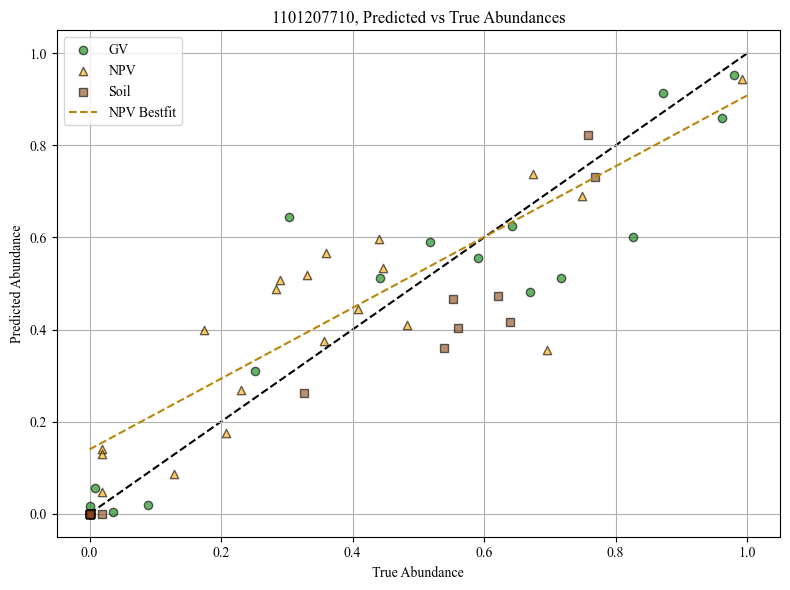

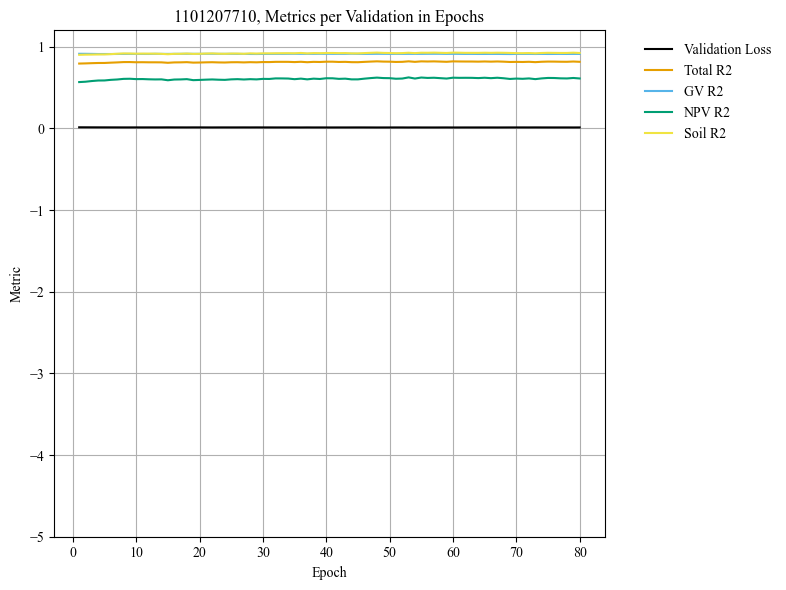

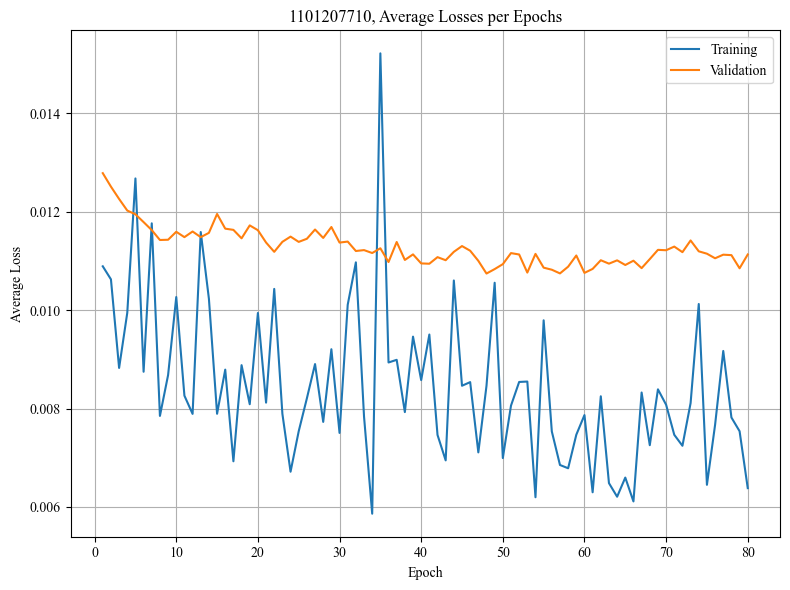

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.016451
Epoch 1/80, Step 2/5, Train Loss: 0.013076
Epoch 1/80, Step 3/5, Train Loss: 0.004665
Epoch 1/80, Step 4/5, Train Loss: 0.020371
Epoch 1/80, Step 5/5, Train Loss: 0.011726
Epoch 1/80 complete. Train Loss: 0.013258, Val Loss: 0.009864
Epoch 2/80, Step 1/5, Train Loss: 0.011601
Epoch 2/80, Step 2/5, Train Loss: 0.027768
Epoch 2/80, Step 3/5, Train Loss: 0.006942
Epoch 2/80, Step 4/5, Train Loss: 0.007750
Epoch 2/80, Step 5/5, Train Loss: 0.022755
Epoch 2/80 complete. Train Loss: 0.015363, Val Loss: 0.009247
Epoch 3/80, Step 1/5, Train Loss: 0.007880
Epoch 3/80, Step 2/5, Train Loss: 0.012664
Epoch 3/80, Step 3/5, Train Loss: 0.007852
Epoch 3/80, Step 4/5, Train Loss: 0.020646
Epoch 3/80, Step 5/5, Train Loss: 0.010725
Epoch 3/80 complete. Train Loss: 0.011954, Val Loss: 0.008940
Epoch 4/80, Step 1/5, Train Loss: 0.008303
Epoch 4/80, Step 2/5, Train Loss: 0.012945
Epoch 4/80, Step 3/5, Train Loss: 0.006903
Epoch 4/80, Step 4/5, Train Loss: 0.0075

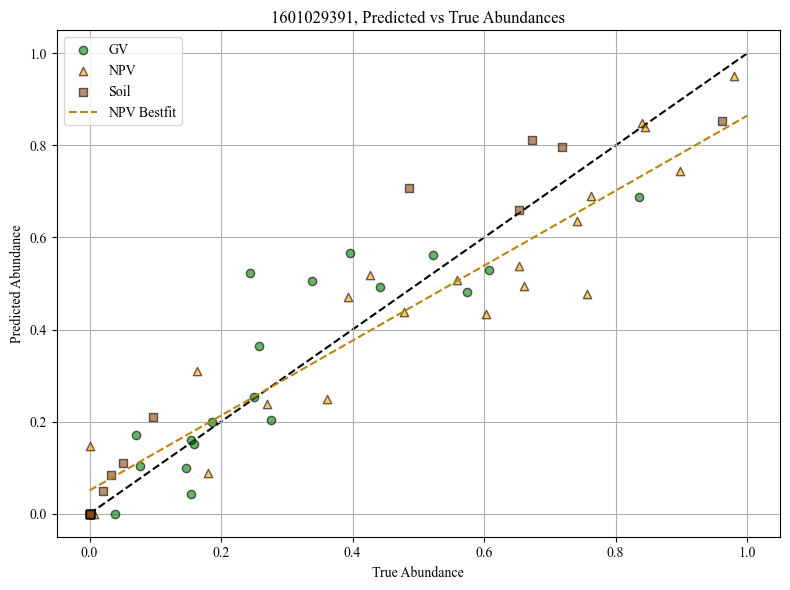

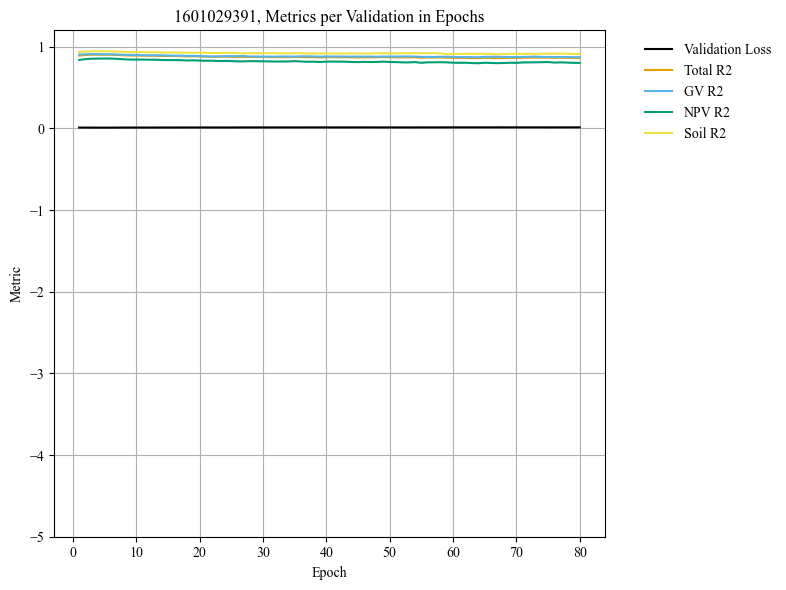

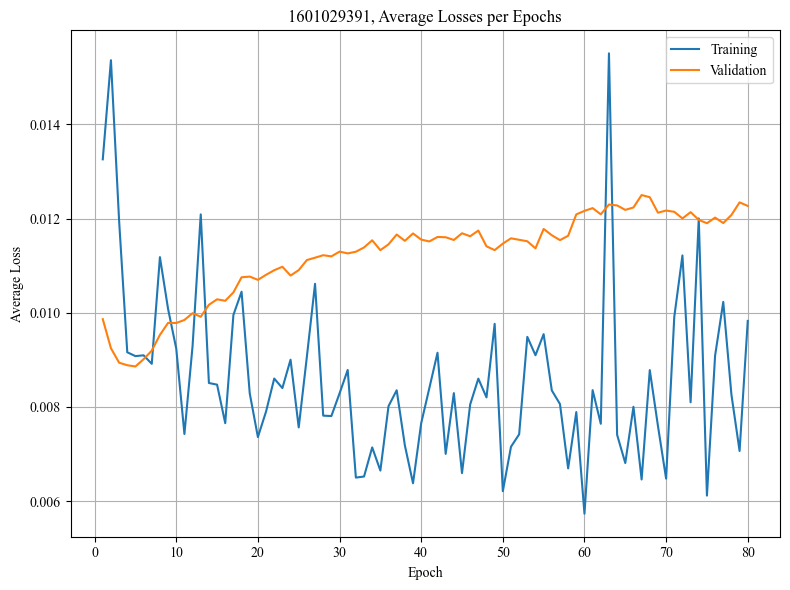

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007618
Epoch 1/80, Step 2/5, Train Loss: 0.008998
Epoch 1/80, Step 3/5, Train Loss: 0.013388
Epoch 1/80, Step 4/5, Train Loss: 0.021569
Epoch 1/80, Step 5/5, Train Loss: 0.008652
Epoch 1/80 complete. Train Loss: 0.012045, Val Loss: 0.012227
Epoch 2/80, Step 1/5, Train Loss: 0.019691
Epoch 2/80, Step 2/5, Train Loss: 0.005727
Epoch 2/80, Step 3/5, Train Loss: 0.020010
Epoch 2/80, Step 4/5, Train Loss: 0.013550
Epoch 2/80, Step 5/5, Train Loss: 0.007861
Epoch 2/80 complete. Train Loss: 0.013368, Val Loss: 0.012218
Epoch 3/80, Step 1/5, Train Loss: 0.010058
Epoch 3/80, Step 2/5, Train Loss: 0.012003
Epoch 3/80, Step 3/5, Train Loss: 0.007418
Epoch 3/80, Step 4/5, Train Loss: 0.021059
Epoch 3/80, Step 5/5, Train Loss: 0.010749
Epoch 3/80 complete. Train Loss: 0.012257, Val Loss: 0.012112
Epoch 4/80, Step 1/5, Train Loss: 0.013659
Epoch 4/80, Step 2/5, Train Loss: 0.009864
Epoch 4/80, Step 3/5, Train Loss: 0.008398
Epoch 4/80, Step 4/5, Train Loss: 0.0101

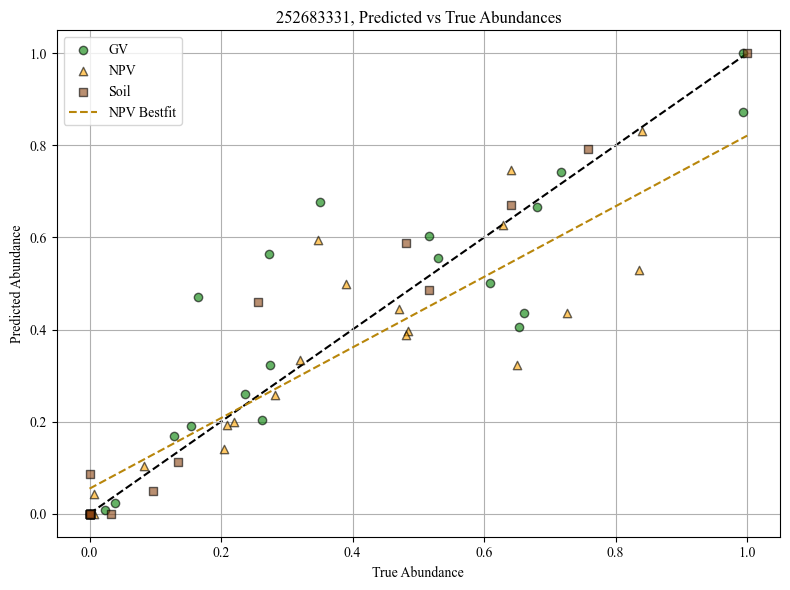

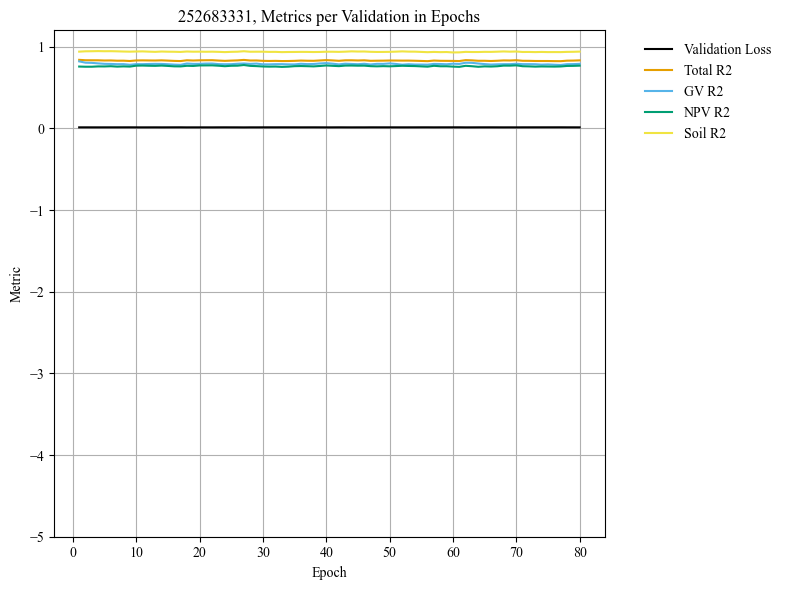

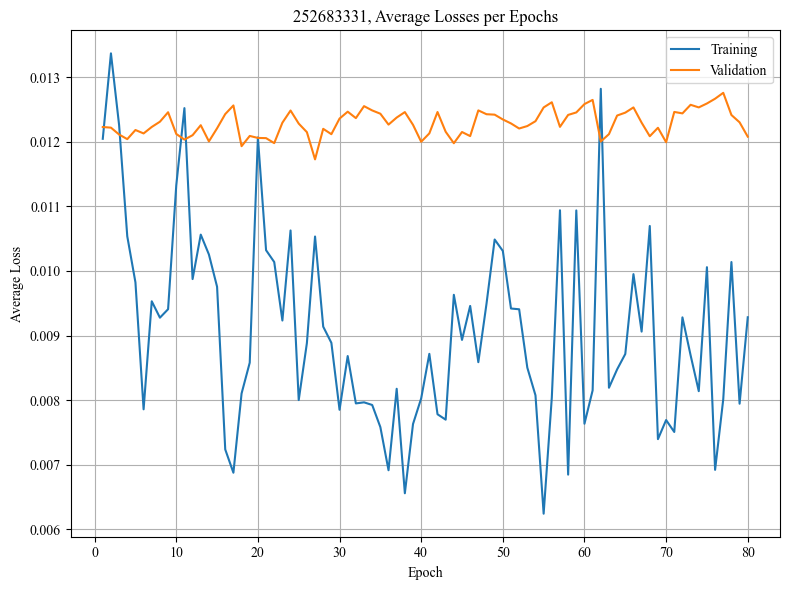

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012017
Epoch 1/80, Step 2/5, Train Loss: 0.007630
Epoch 1/80, Step 3/5, Train Loss: 0.013295
Epoch 1/80, Step 4/5, Train Loss: 0.011865
Epoch 1/80, Step 5/5, Train Loss: 0.017818
Epoch 1/80 complete. Train Loss: 0.012525, Val Loss: 0.005967
Epoch 2/80, Step 1/5, Train Loss: 0.009514
Epoch 2/80, Step 2/5, Train Loss: 0.013916
Epoch 2/80, Step 3/5, Train Loss: 0.002787
Epoch 2/80, Step 4/5, Train Loss: 0.012066
Epoch 2/80, Step 5/5, Train Loss: 0.009037
Epoch 2/80 complete. Train Loss: 0.009464, Val Loss: 0.005892
Epoch 3/80, Step 1/5, Train Loss: 0.014479
Epoch 3/80, Step 2/5, Train Loss: 0.010313
Epoch 3/80, Step 3/5, Train Loss: 0.010073
Epoch 3/80, Step 4/5, Train Loss: 0.008086
Epoch 3/80, Step 5/5, Train Loss: 0.011547
Epoch 3/80 complete. Train Loss: 0.010900, Val Loss: 0.006151
Epoch 4/80, Step 1/5, Train Loss: 0.011249
Epoch 4/80, Step 2/5, Train Loss: 0.017894
Epoch 4/80, Step 3/5, Train Loss: 0.009317
Epoch 4/80, Step 4/5, Train Loss: 0.0079

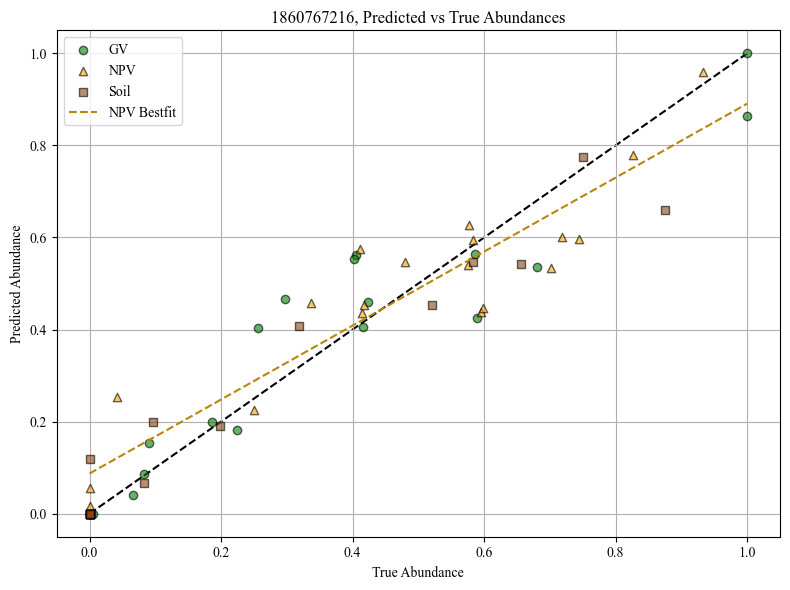

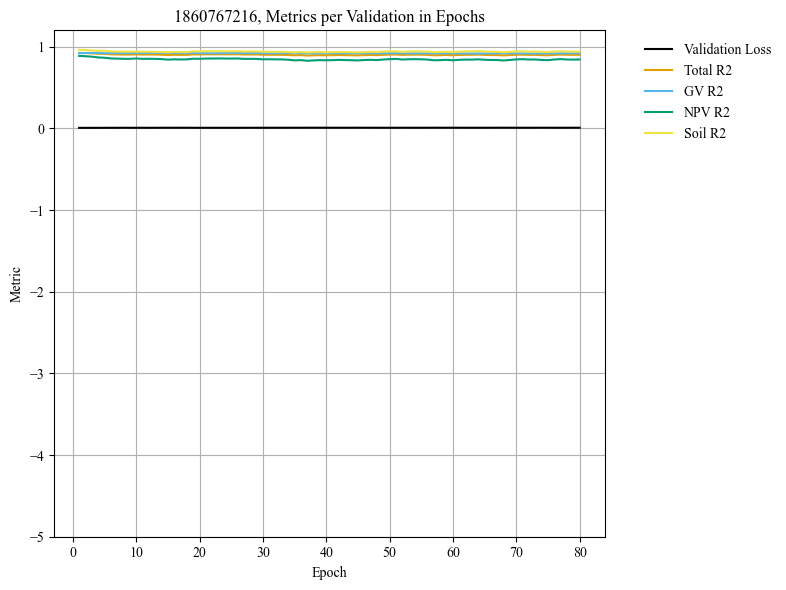

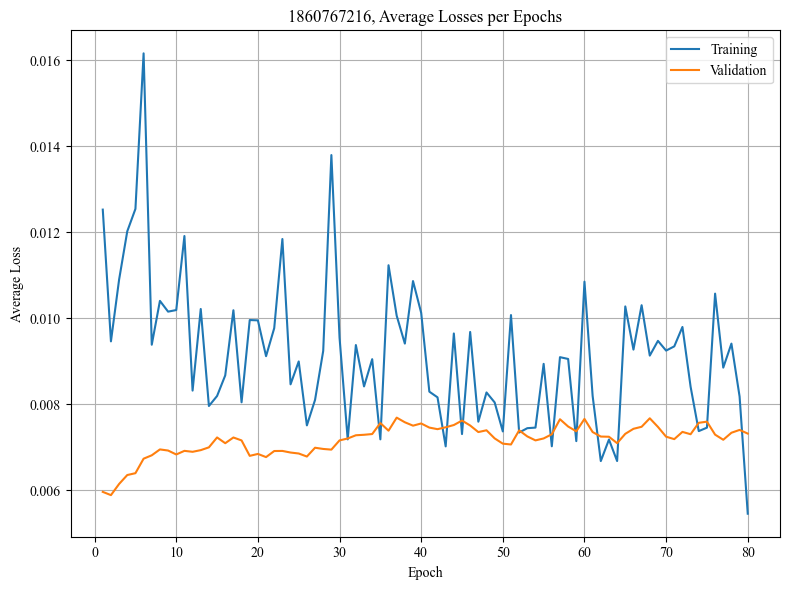

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011615
Epoch 1/80, Step 2/5, Train Loss: 0.009020
Epoch 1/80, Step 3/5, Train Loss: 0.011431
Epoch 1/80, Step 4/5, Train Loss: 0.011511
Epoch 1/80, Step 5/5, Train Loss: 0.008280
Epoch 1/80 complete. Train Loss: 0.010372, Val Loss: 0.007948
Epoch 2/80, Step 1/5, Train Loss: 0.007359
Epoch 2/80, Step 2/5, Train Loss: 0.006251
Epoch 2/80, Step 3/5, Train Loss: 0.011101
Epoch 2/80, Step 4/5, Train Loss: 0.011981
Epoch 2/80, Step 5/5, Train Loss: 0.008390
Epoch 2/80 complete. Train Loss: 0.009016, Val Loss: 0.007965
Epoch 3/80, Step 1/5, Train Loss: 0.013995
Epoch 3/80, Step 2/5, Train Loss: 0.008984
Epoch 3/80, Step 3/5, Train Loss: 0.009468
Epoch 3/80, Step 4/5, Train Loss: 0.012713
Epoch 3/80, Step 5/5, Train Loss: 0.013508
Epoch 3/80 complete. Train Loss: 0.011734, Val Loss: 0.007999
Epoch 4/80, Step 1/5, Train Loss: 0.007597
Epoch 4/80, Step 2/5, Train Loss: 0.009715
Epoch 4/80, Step 3/5, Train Loss: 0.009596
Epoch 4/80, Step 4/5, Train Loss: 0.0096

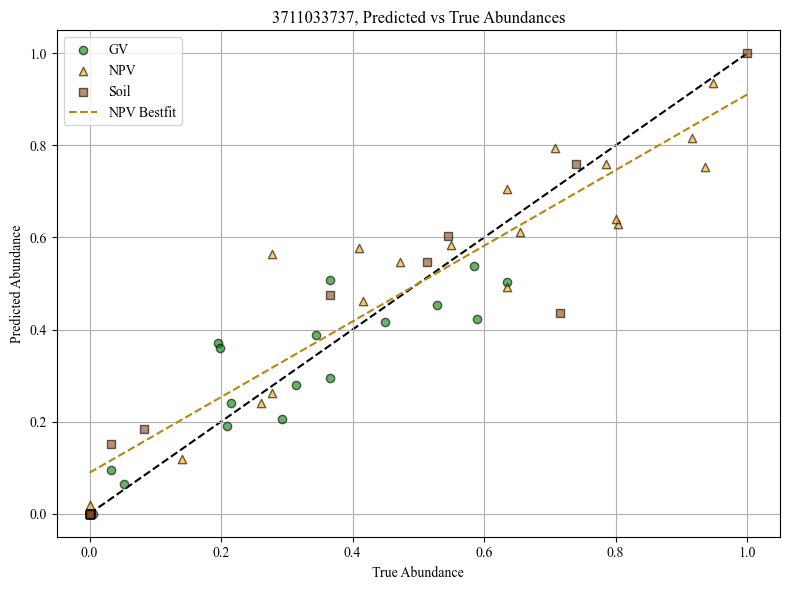

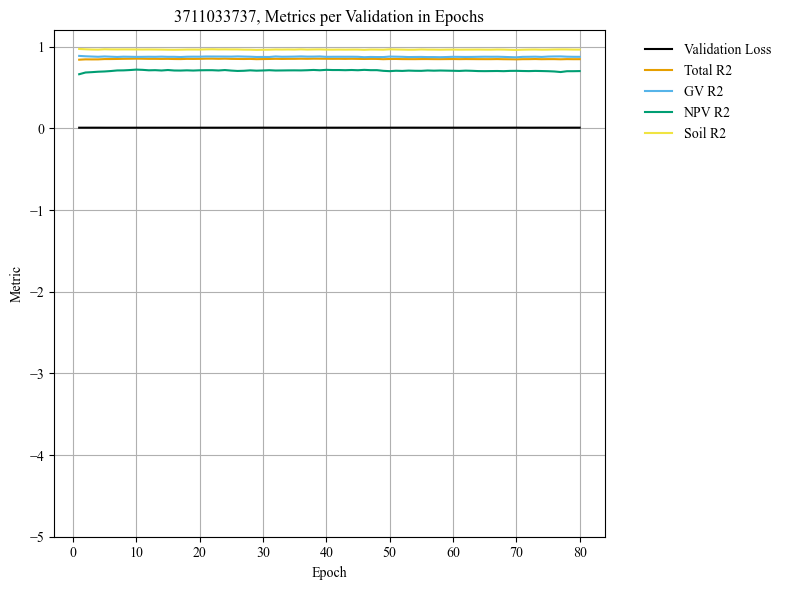

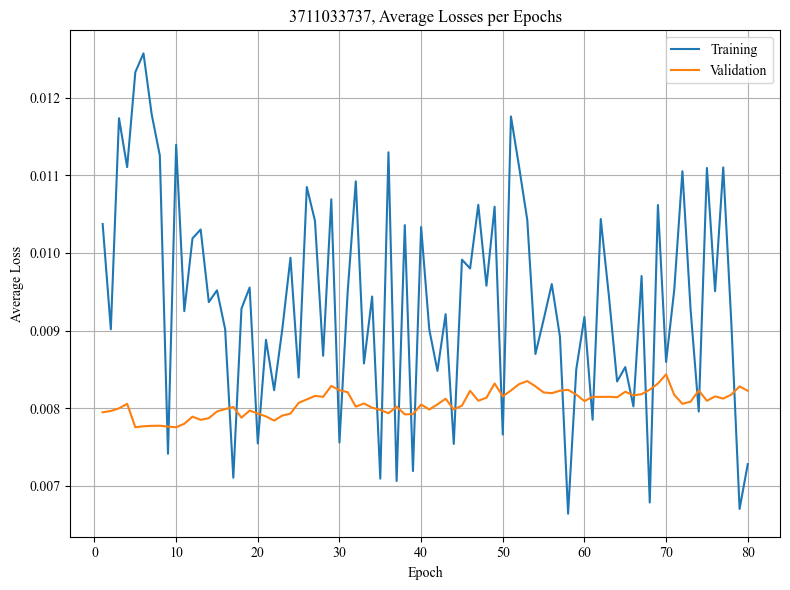

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.013519
Epoch 1/80, Step 2/5, Train Loss: 0.007815
Epoch 1/80, Step 3/5, Train Loss: 0.012300
Epoch 1/80, Step 4/5, Train Loss: 0.010178
Epoch 1/80, Step 5/5, Train Loss: 0.005929
Epoch 1/80 complete. Train Loss: 0.009948, Val Loss: 0.005753
Epoch 2/80, Step 1/5, Train Loss: 0.004541
Epoch 2/80, Step 2/5, Train Loss: 0.029936
Epoch 2/80, Step 3/5, Train Loss: 0.012787
Epoch 2/80, Step 4/5, Train Loss: 0.009953
Epoch 2/80, Step 5/5, Train Loss: 0.006806
Epoch 2/80 complete. Train Loss: 0.012804, Val Loss: 0.005310
Epoch 3/80, Step 1/5, Train Loss: 0.010737
Epoch 3/80, Step 2/5, Train Loss: 0.013013
Epoch 3/80, Step 3/5, Train Loss: 0.005456
Epoch 3/80, Step 4/5, Train Loss: 0.012806
Epoch 3/80, Step 5/5, Train Loss: 0.006798
Epoch 3/80 complete. Train Loss: 0.009762, Val Loss: 0.005323
Epoch 4/80, Step 1/5, Train Loss: 0.014029
Epoch 4/80, Step 2/5, Train Loss: 0.006072
Epoch 4/80, Step 3/5, Train Loss: 0.009885
Epoch 4/80, Step 4/5, Train Loss: 0.0220

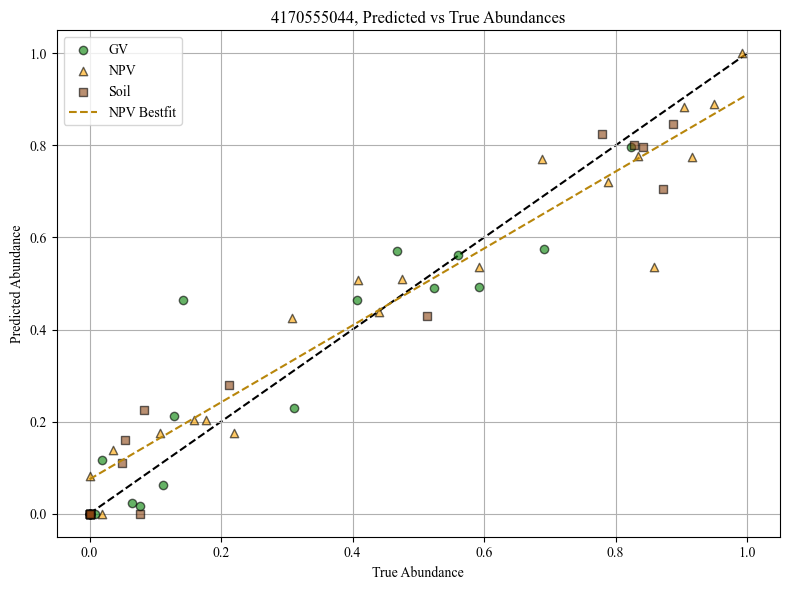

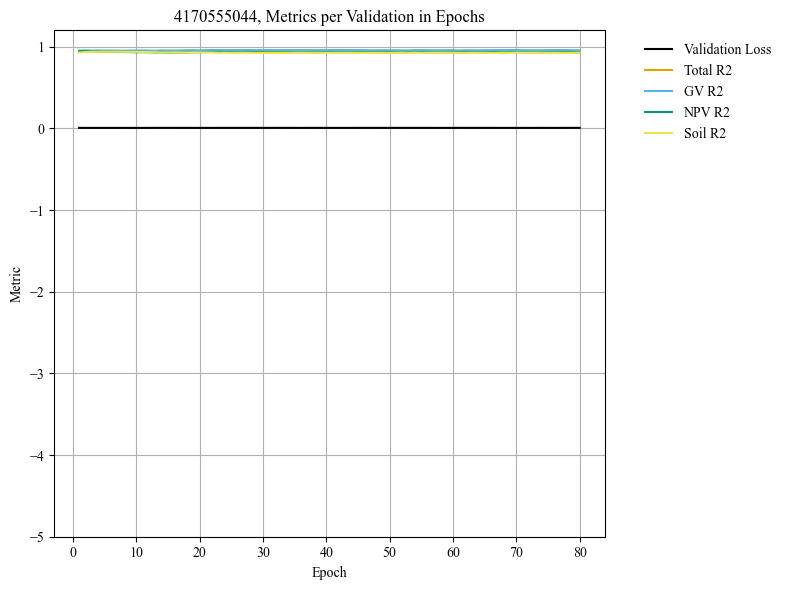

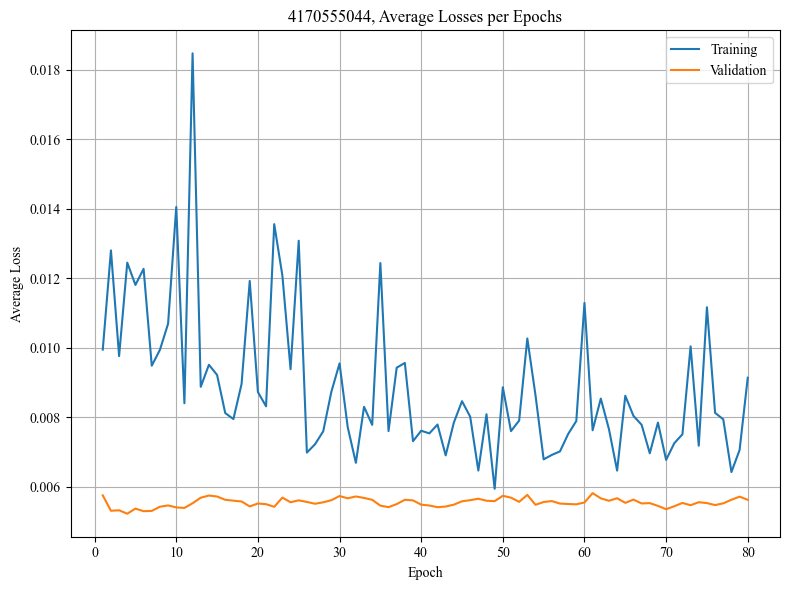

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018493
Epoch 1/80, Step 2/5, Train Loss: 0.018377
Epoch 1/80, Step 3/5, Train Loss: 0.014697
Epoch 1/80, Step 4/5, Train Loss: 0.014650
Epoch 1/80, Step 5/5, Train Loss: 0.012072
Epoch 1/80 complete. Train Loss: 0.015658, Val Loss: 0.007929
Epoch 2/80, Step 1/5, Train Loss: 0.011414
Epoch 2/80, Step 2/5, Train Loss: 0.016504
Epoch 2/80, Step 3/5, Train Loss: 0.010505
Epoch 2/80, Step 4/5, Train Loss: 0.006669
Epoch 2/80, Step 5/5, Train Loss: 0.009988
Epoch 2/80 complete. Train Loss: 0.011016, Val Loss: 0.007636
Epoch 3/80, Step 1/5, Train Loss: 0.011444
Epoch 3/80, Step 2/5, Train Loss: 0.003535
Epoch 3/80, Step 3/5, Train Loss: 0.005414
Epoch 3/80, Step 4/5, Train Loss: 0.014539
Epoch 3/80, Step 5/5, Train Loss: 0.017866
Epoch 3/80 complete. Train Loss: 0.010560, Val Loss: 0.007556
Epoch 4/80, Step 1/5, Train Loss: 0.010379
Epoch 4/80, Step 2/5, Train Loss: 0.007591
Epoch 4/80, Step 3/5, Train Loss: 0.028214
Epoch 4/80, Step 4/5, Train Loss: 0.0074

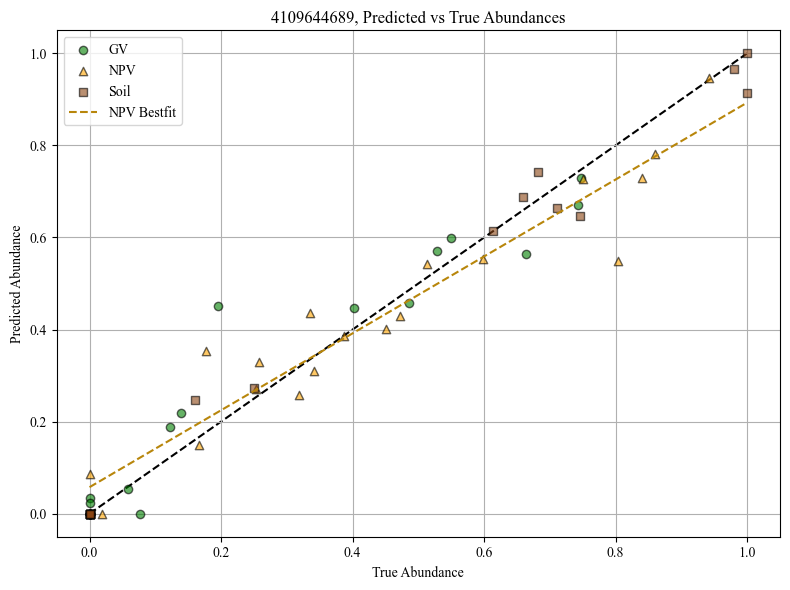

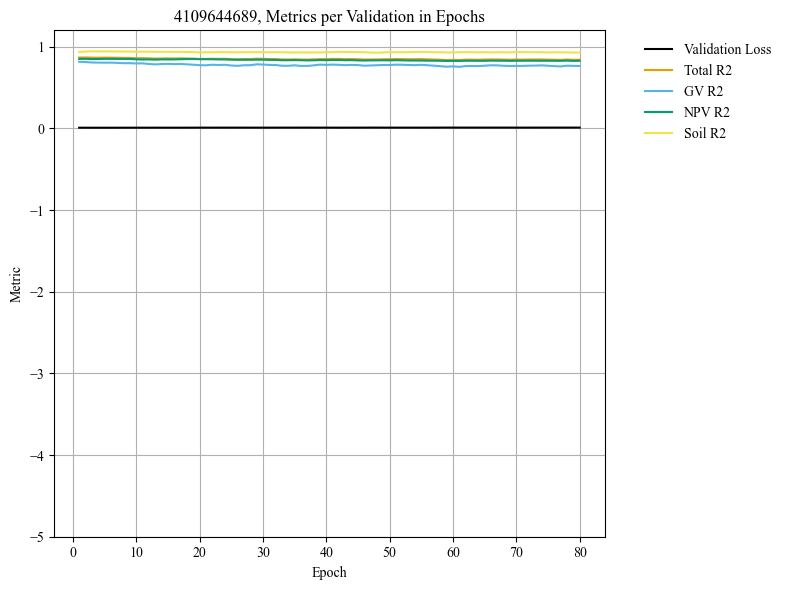

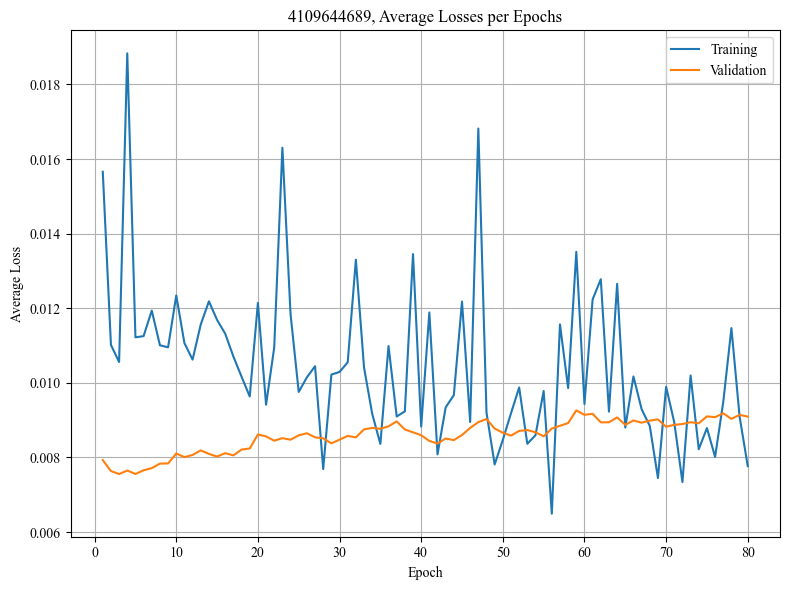

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011465
Epoch 1/80, Step 2/5, Train Loss: 0.006892
Epoch 1/80, Step 3/5, Train Loss: 0.007271
Epoch 1/80, Step 4/5, Train Loss: 0.020117
Epoch 1/80, Step 5/5, Train Loss: 0.017111
Epoch 1/80 complete. Train Loss: 0.012571, Val Loss: 0.005745
Epoch 2/80, Step 1/5, Train Loss: 0.009611
Epoch 2/80, Step 2/5, Train Loss: 0.012501
Epoch 2/80, Step 3/5, Train Loss: 0.009572
Epoch 2/80, Step 4/5, Train Loss: 0.009729
Epoch 2/80, Step 5/5, Train Loss: 0.012795
Epoch 2/80 complete. Train Loss: 0.010841, Val Loss: 0.005370
Epoch 3/80, Step 1/5, Train Loss: 0.006957
Epoch 3/80, Step 2/5, Train Loss: 0.016012
Epoch 3/80, Step 3/5, Train Loss: 0.017166
Epoch 3/80, Step 4/5, Train Loss: 0.013310
Epoch 3/80, Step 5/5, Train Loss: 0.015715
Epoch 3/80 complete. Train Loss: 0.013832, Val Loss: 0.005307
Epoch 4/80, Step 1/5, Train Loss: 0.007081
Epoch 4/80, Step 2/5, Train Loss: 0.006827
Epoch 4/80, Step 3/5, Train Loss: 0.018347
Epoch 4/80, Step 4/5, Train Loss: 0.0153

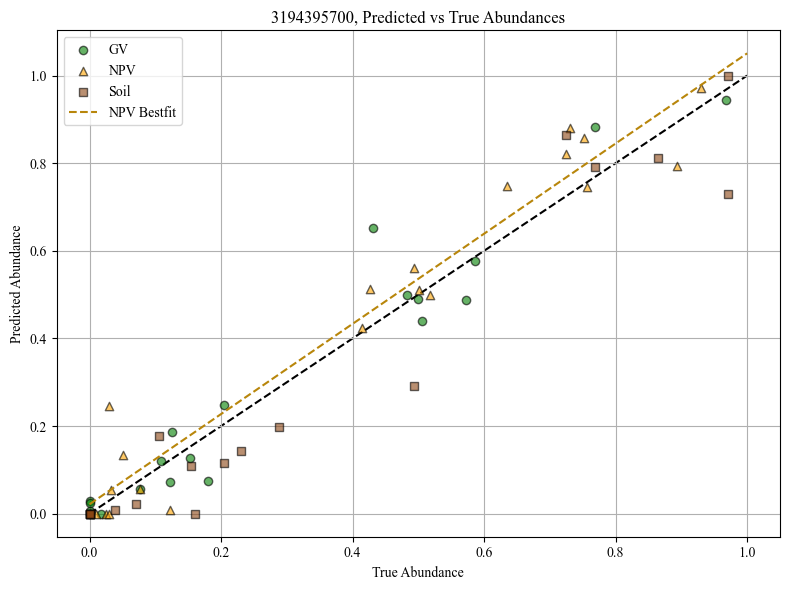

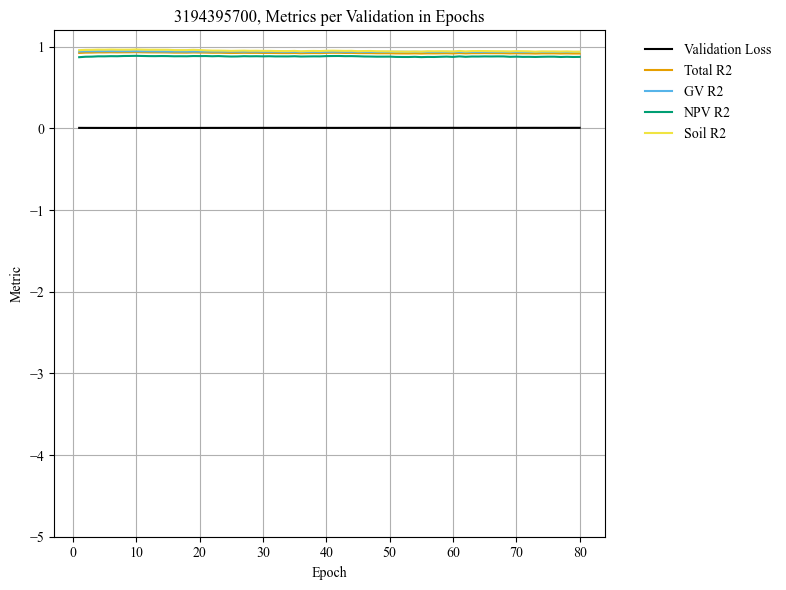

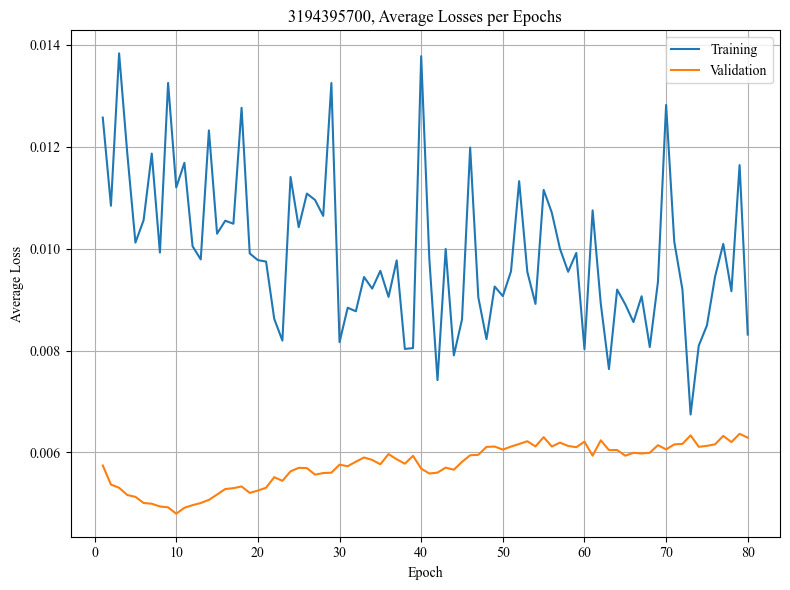

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008081
Epoch 1/80, Step 2/5, Train Loss: 0.016226
Epoch 1/80, Step 3/5, Train Loss: 0.013518
Epoch 1/80, Step 4/5, Train Loss: 0.016489
Epoch 1/80, Step 5/5, Train Loss: 0.016947
Epoch 1/80 complete. Train Loss: 0.014252, Val Loss: 0.009396
Epoch 2/80, Step 1/5, Train Loss: 0.009510
Epoch 2/80, Step 2/5, Train Loss: 0.012585
Epoch 2/80, Step 3/5, Train Loss: 0.005935
Epoch 2/80, Step 4/5, Train Loss: 0.015947
Epoch 2/80, Step 5/5, Train Loss: 0.011974
Epoch 2/80 complete. Train Loss: 0.011190, Val Loss: 0.009113
Epoch 3/80, Step 1/5, Train Loss: 0.012224
Epoch 3/80, Step 2/5, Train Loss: 0.010296
Epoch 3/80, Step 3/5, Train Loss: 0.019046
Epoch 3/80, Step 4/5, Train Loss: 0.013863
Epoch 3/80, Step 5/5, Train Loss: 0.013397
Epoch 3/80 complete. Train Loss: 0.013765, Val Loss: 0.008974
Epoch 4/80, Step 1/5, Train Loss: 0.010641
Epoch 4/80, Step 2/5, Train Loss: 0.012719
Epoch 4/80, Step 3/5, Train Loss: 0.016169
Epoch 4/80, Step 4/5, Train Loss: 0.0087

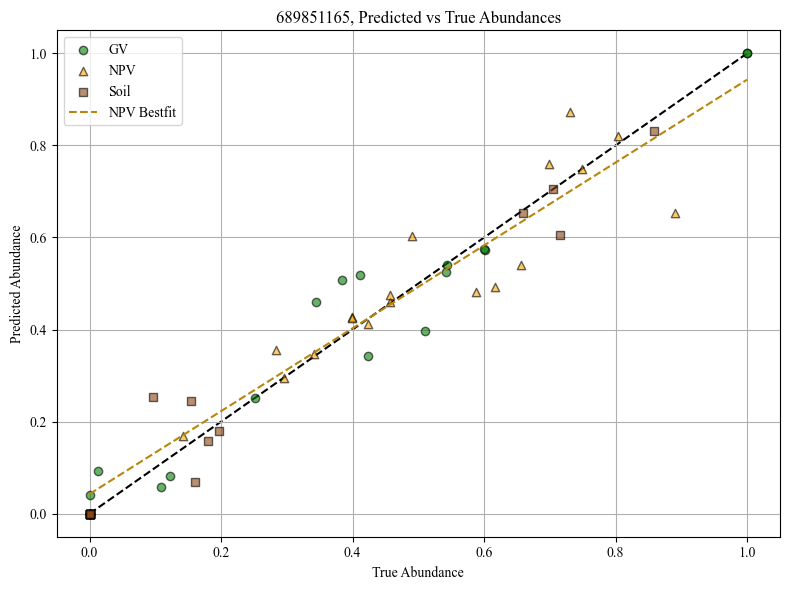

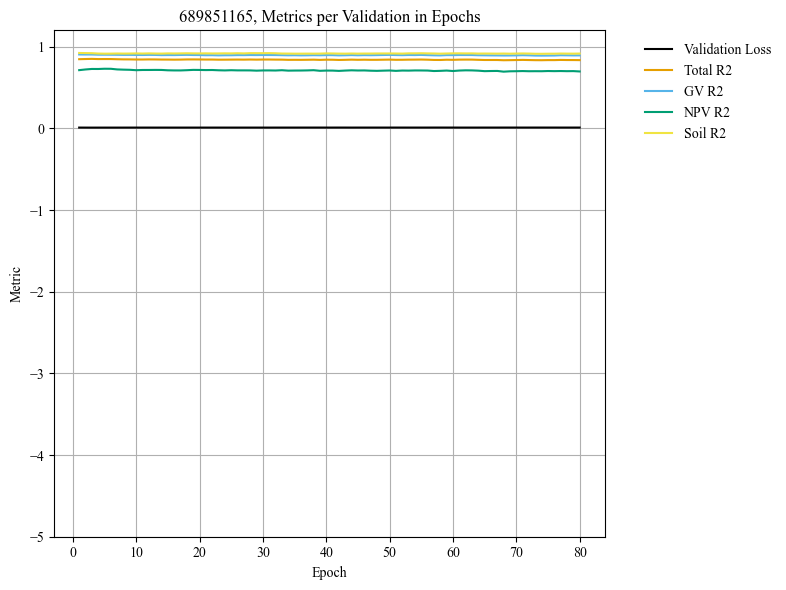

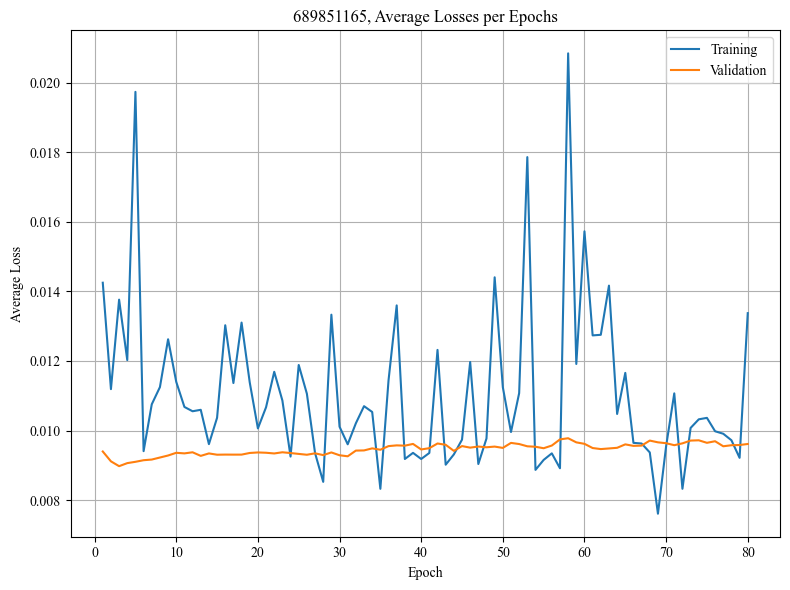

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008199
Epoch 1/80, Step 2/5, Train Loss: 0.007827
Epoch 1/80, Step 3/5, Train Loss: 0.006599
Epoch 1/80, Step 4/5, Train Loss: 0.010540
Epoch 1/80, Step 5/5, Train Loss: 0.009280
Epoch 1/80 complete. Train Loss: 0.008489, Val Loss: 0.008895
Epoch 2/80, Step 1/5, Train Loss: 0.009868
Epoch 2/80, Step 2/5, Train Loss: 0.006028
Epoch 2/80, Step 3/5, Train Loss: 0.006504
Epoch 2/80, Step 4/5, Train Loss: 0.006161
Epoch 2/80, Step 5/5, Train Loss: 0.012473
Epoch 2/80 complete. Train Loss: 0.008207, Val Loss: 0.008530
Epoch 3/80, Step 1/5, Train Loss: 0.006189
Epoch 3/80, Step 2/5, Train Loss: 0.010878
Epoch 3/80, Step 3/5, Train Loss: 0.012778
Epoch 3/80, Step 4/5, Train Loss: 0.007043
Epoch 3/80, Step 5/5, Train Loss: 0.009049
Epoch 3/80 complete. Train Loss: 0.009187, Val Loss: 0.008501
Epoch 4/80, Step 1/5, Train Loss: 0.008272
Epoch 4/80, Step 2/5, Train Loss: 0.007948
Epoch 4/80, Step 3/5, Train Loss: 0.008113
Epoch 4/80, Step 4/5, Train Loss: 0.0066

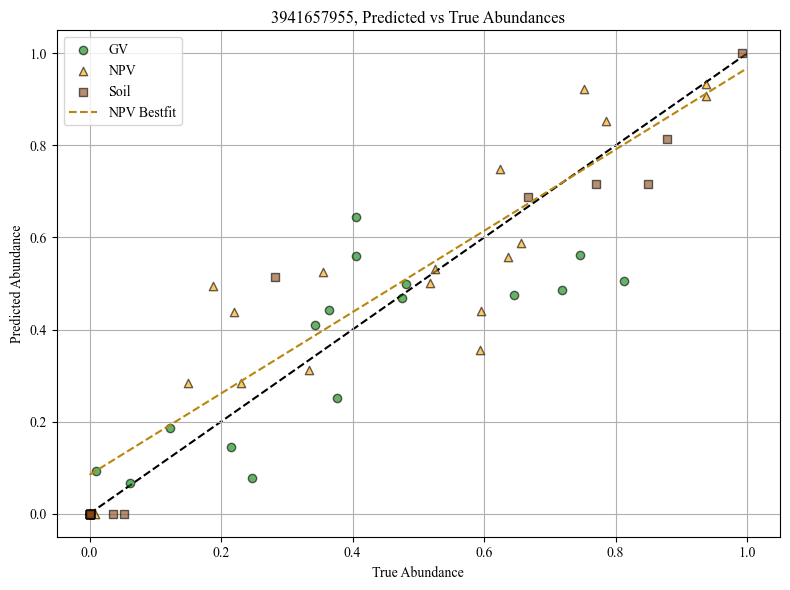

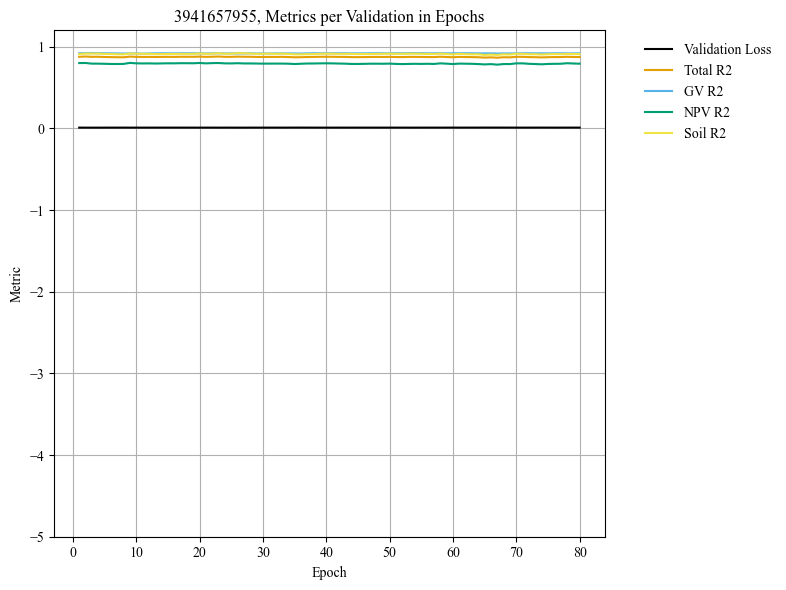

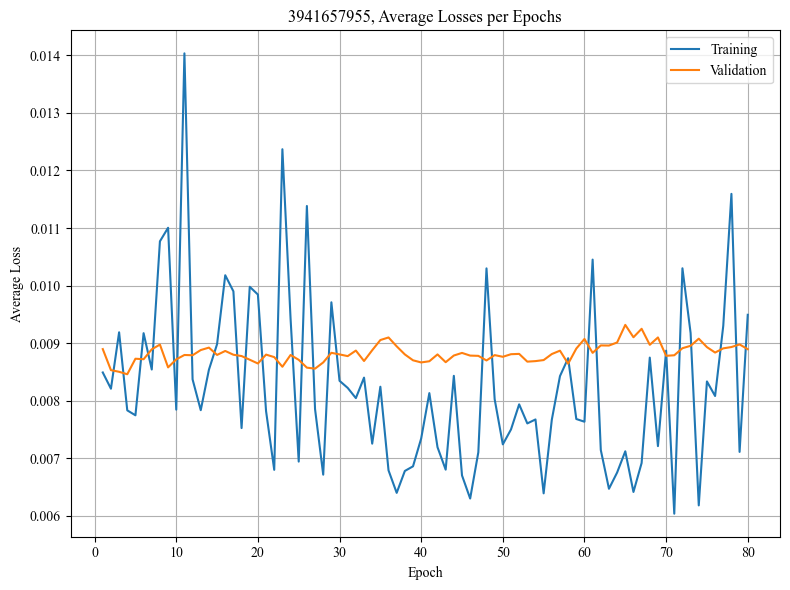

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.016817
Epoch 1/80, Step 2/5, Train Loss: 0.008811
Epoch 1/80, Step 3/5, Train Loss: 0.014388
Epoch 1/80, Step 4/5, Train Loss: 0.004084
Epoch 1/80, Step 5/5, Train Loss: 0.013060
Epoch 1/80 complete. Train Loss: 0.011432, Val Loss: 0.006149
Epoch 2/80, Step 1/5, Train Loss: 0.011146
Epoch 2/80, Step 2/5, Train Loss: 0.007051
Epoch 2/80, Step 3/5, Train Loss: 0.009865
Epoch 2/80, Step 4/5, Train Loss: 0.016043
Epoch 2/80, Step 5/5, Train Loss: 0.010793
Epoch 2/80 complete. Train Loss: 0.010979, Val Loss: 0.006401
Epoch 3/80, Step 1/5, Train Loss: 0.021203
Epoch 3/80, Step 2/5, Train Loss: 0.010344
Epoch 3/80, Step 3/5, Train Loss: 0.030720
Epoch 3/80, Step 4/5, Train Loss: 0.009691
Epoch 3/80, Step 5/5, Train Loss: 0.007896
Epoch 3/80 complete. Train Loss: 0.015971, Val Loss: 0.006532
Epoch 4/80, Step 1/5, Train Loss: 0.008248
Epoch 4/80, Step 2/5, Train Loss: 0.013997
Epoch 4/80, Step 3/5, Train Loss: 0.008094
Epoch 4/80, Step 4/5, Train Loss: 0.0204

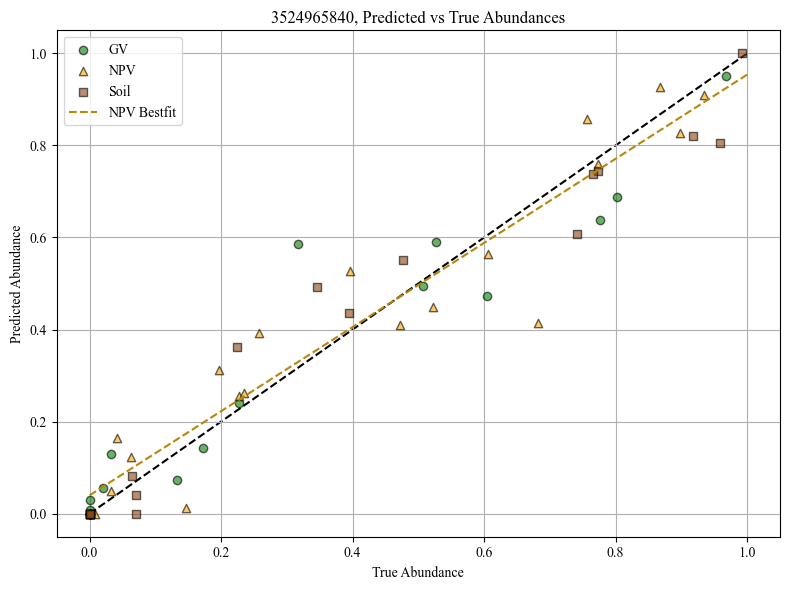

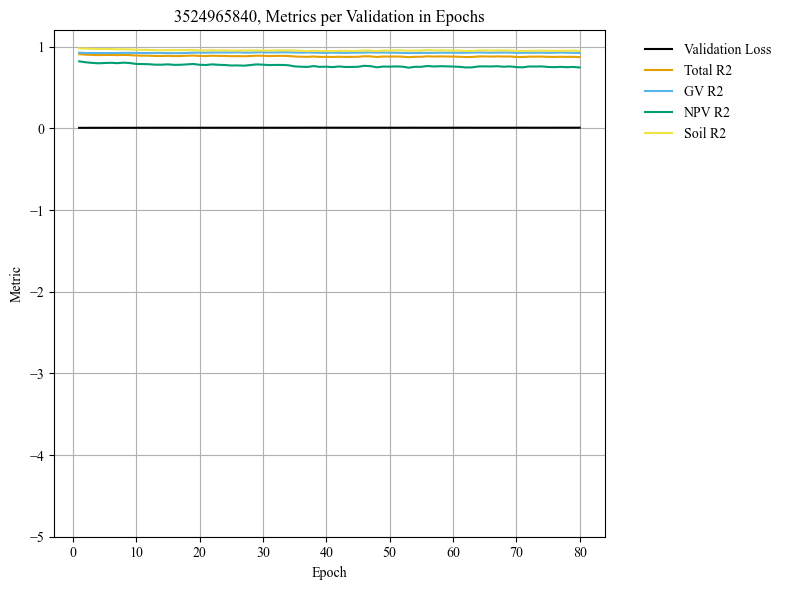

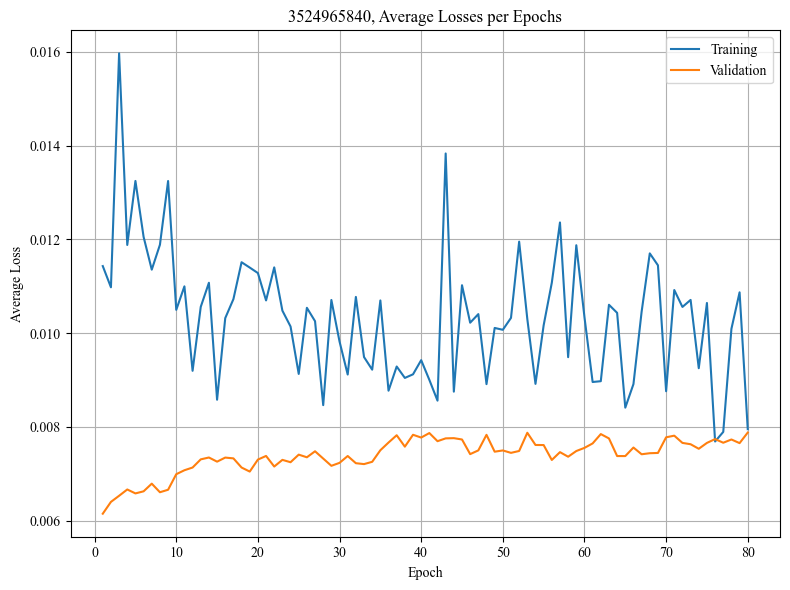

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018140
Epoch 1/80, Step 2/5, Train Loss: 0.014987
Epoch 1/80, Step 3/5, Train Loss: 0.010137
Epoch 1/80, Step 4/5, Train Loss: 0.012832
Epoch 1/80, Step 5/5, Train Loss: 0.007691
Epoch 1/80 complete. Train Loss: 0.012757, Val Loss: 0.009159
Epoch 2/80, Step 1/5, Train Loss: 0.010213
Epoch 2/80, Step 2/5, Train Loss: 0.016188
Epoch 2/80, Step 3/5, Train Loss: 0.012117
Epoch 2/80, Step 4/5, Train Loss: 0.015049
Epoch 2/80, Step 5/5, Train Loss: 0.016917
Epoch 2/80 complete. Train Loss: 0.014097, Val Loss: 0.008729
Epoch 3/80, Step 1/5, Train Loss: 0.006267
Epoch 3/80, Step 2/5, Train Loss: 0.021545
Epoch 3/80, Step 3/5, Train Loss: 0.014029
Epoch 3/80, Step 4/5, Train Loss: 0.021144
Epoch 3/80, Step 5/5, Train Loss: 0.012340
Epoch 3/80 complete. Train Loss: 0.015065, Val Loss: 0.008504
Epoch 4/80, Step 1/5, Train Loss: 0.026298
Epoch 4/80, Step 2/5, Train Loss: 0.009537
Epoch 4/80, Step 3/5, Train Loss: 0.009988
Epoch 4/80, Step 4/5, Train Loss: 0.0131

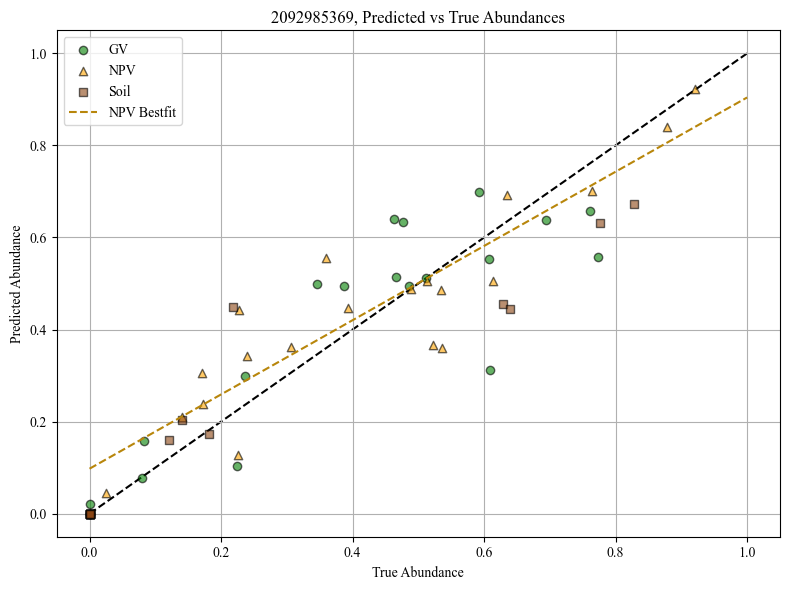

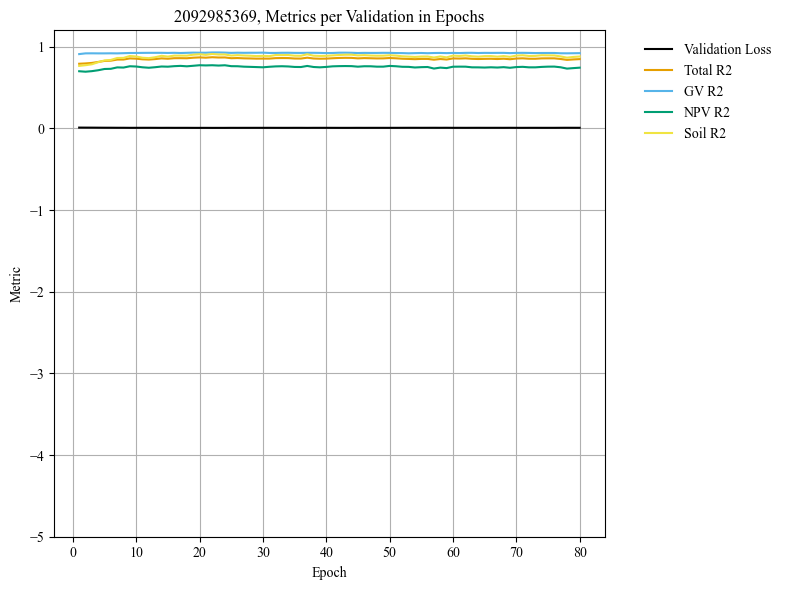

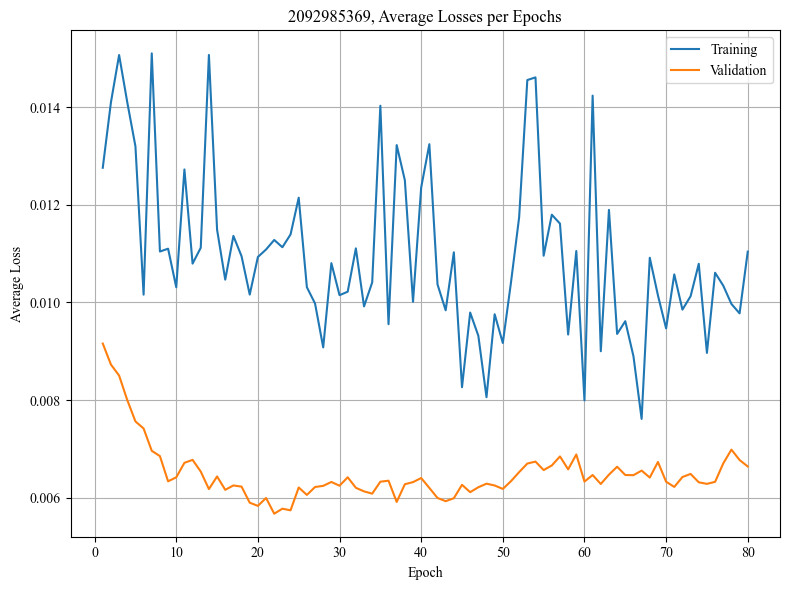

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.021730
Epoch 1/80, Step 2/5, Train Loss: 0.024587
Epoch 1/80, Step 3/5, Train Loss: 0.011802
Epoch 1/80, Step 4/5, Train Loss: 0.011364
Epoch 1/80, Step 5/5, Train Loss: 0.012052
Epoch 1/80 complete. Train Loss: 0.016307, Val Loss: 0.020670
Epoch 2/80, Step 1/5, Train Loss: 0.012575
Epoch 2/80, Step 2/5, Train Loss: 0.023375
Epoch 2/80, Step 3/5, Train Loss: 0.011482
Epoch 2/80, Step 4/5, Train Loss: 0.016649
Epoch 2/80, Step 5/5, Train Loss: 0.011943
Epoch 2/80 complete. Train Loss: 0.015205, Val Loss: 0.019052
Epoch 3/80, Step 1/5, Train Loss: 0.013683
Epoch 3/80, Step 2/5, Train Loss: 0.016118
Epoch 3/80, Step 3/5, Train Loss: 0.012783
Epoch 3/80, Step 4/5, Train Loss: 0.021879
Epoch 3/80, Step 5/5, Train Loss: 0.016209
Epoch 3/80 complete. Train Loss: 0.016134, Val Loss: 0.018142
Epoch 4/80, Step 1/5, Train Loss: 0.008341
Epoch 4/80, Step 2/5, Train Loss: 0.013618
Epoch 4/80, Step 3/5, Train Loss: 0.019218
Epoch 4/80, Step 4/5, Train Loss: 0.0150

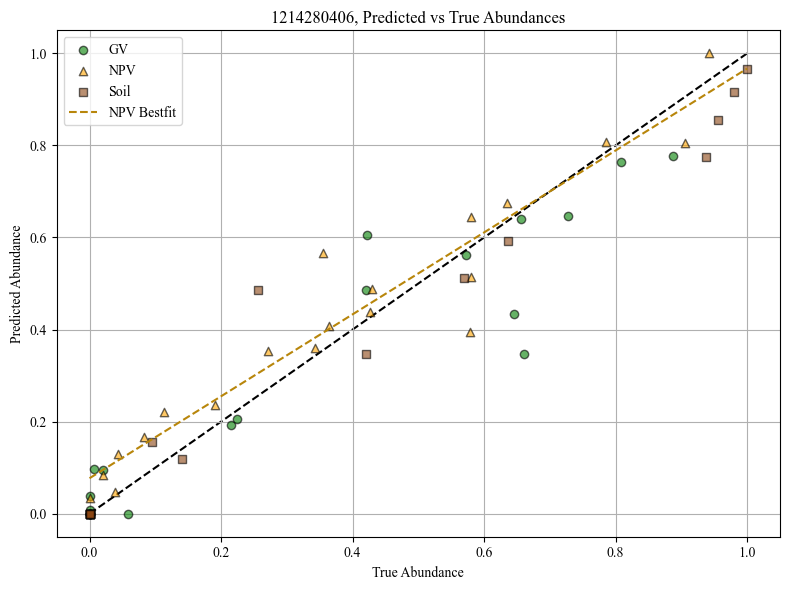

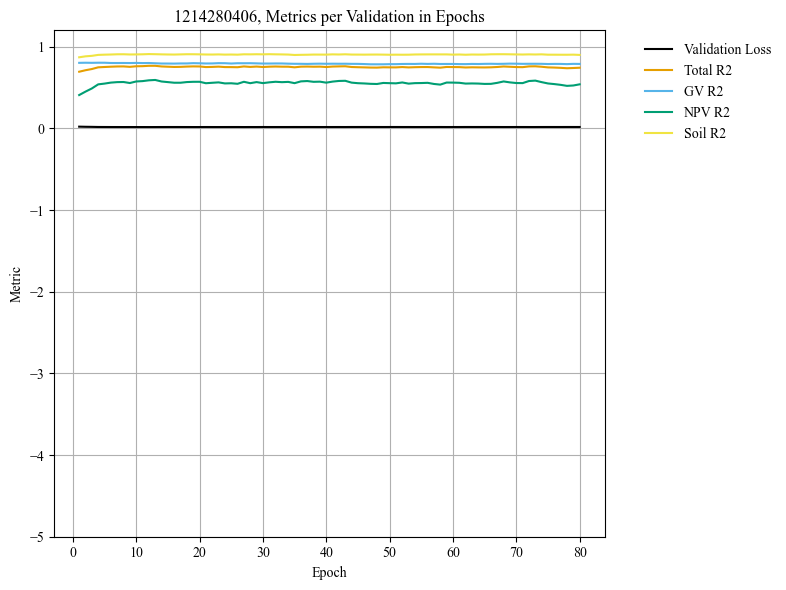

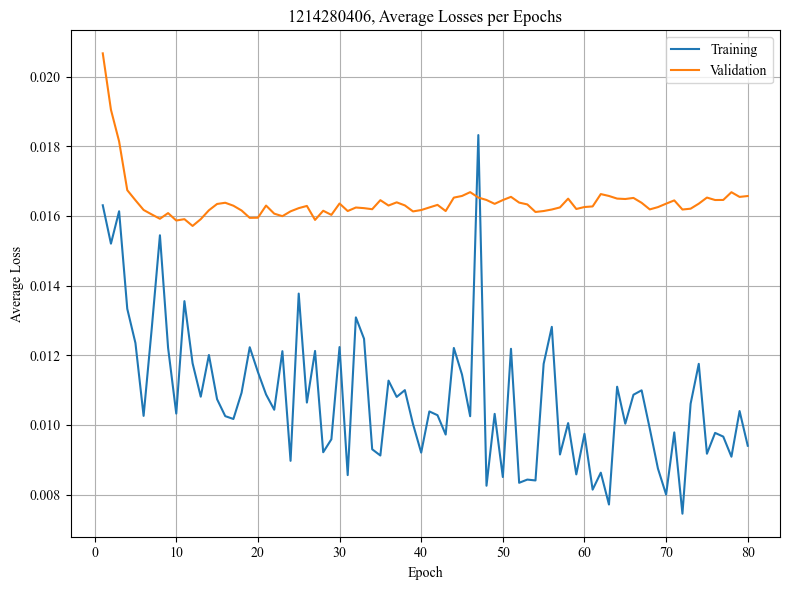

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007737
Epoch 1/80, Step 2/5, Train Loss: 0.009357
Epoch 1/80, Step 3/5, Train Loss: 0.009718
Epoch 1/80, Step 4/5, Train Loss: 0.013849
Epoch 1/80, Step 5/5, Train Loss: 0.005489
Epoch 1/80 complete. Train Loss: 0.009230, Val Loss: 0.009521
Epoch 2/80, Step 1/5, Train Loss: 0.027406
Epoch 2/80, Step 2/5, Train Loss: 0.007837
Epoch 2/80, Step 3/5, Train Loss: 0.015827
Epoch 2/80, Step 4/5, Train Loss: 0.007420
Epoch 2/80, Step 5/5, Train Loss: 0.010724
Epoch 2/80 complete. Train Loss: 0.013843, Val Loss: 0.009547
Epoch 3/80, Step 1/5, Train Loss: 0.008647
Epoch 3/80, Step 2/5, Train Loss: 0.009240
Epoch 3/80, Step 3/5, Train Loss: 0.019701
Epoch 3/80, Step 4/5, Train Loss: 0.004439
Epoch 3/80, Step 5/5, Train Loss: 0.007034
Epoch 3/80 complete. Train Loss: 0.009812, Val Loss: 0.009623
Epoch 4/80, Step 1/5, Train Loss: 0.012105
Epoch 4/80, Step 2/5, Train Loss: 0.010200
Epoch 4/80, Step 3/5, Train Loss: 0.005022
Epoch 4/80, Step 4/5, Train Loss: 0.0087

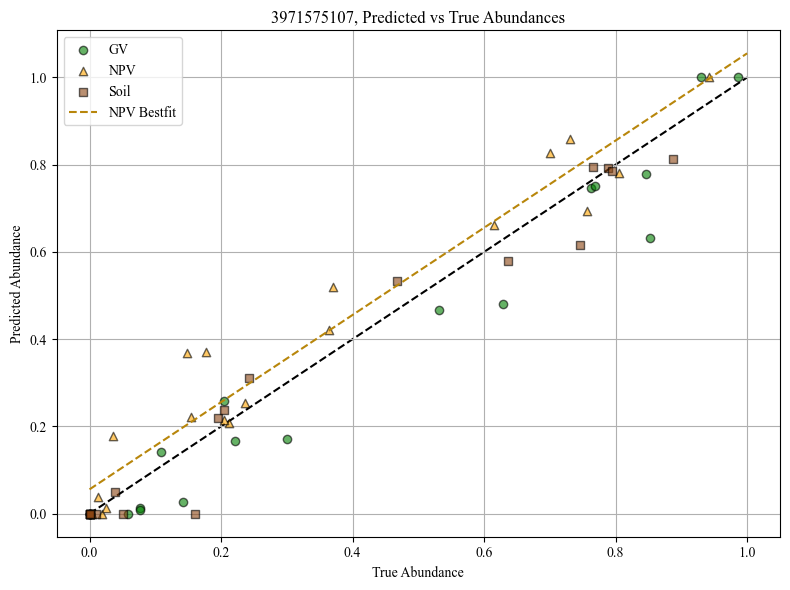

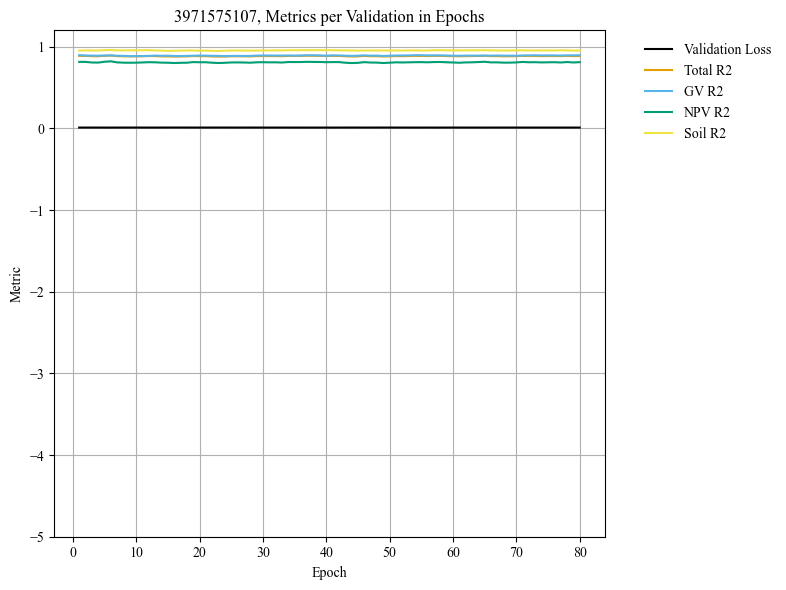

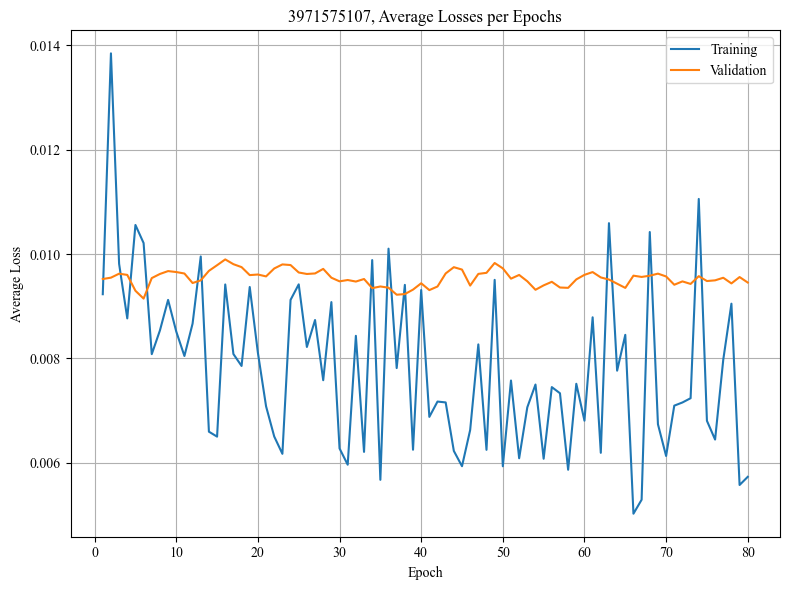

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010880
Epoch 1/80, Step 2/5, Train Loss: 0.011037
Epoch 1/80, Step 3/5, Train Loss: 0.005059
Epoch 1/80, Step 4/5, Train Loss: 0.011597
Epoch 1/80, Step 5/5, Train Loss: 0.021358
Epoch 1/80 complete. Train Loss: 0.011986, Val Loss: 0.007339
Epoch 2/80, Step 1/5, Train Loss: 0.005907
Epoch 2/80, Step 2/5, Train Loss: 0.006391
Epoch 2/80, Step 3/5, Train Loss: 0.010451
Epoch 2/80, Step 4/5, Train Loss: 0.012668
Epoch 2/80, Step 5/5, Train Loss: 0.017365
Epoch 2/80 complete. Train Loss: 0.010557, Val Loss: 0.006814
Epoch 3/80, Step 1/5, Train Loss: 0.014936
Epoch 3/80, Step 2/5, Train Loss: 0.008346
Epoch 3/80, Step 3/5, Train Loss: 0.008037
Epoch 3/80, Step 4/5, Train Loss: 0.014892
Epoch 3/80, Step 5/5, Train Loss: 0.009474
Epoch 3/80 complete. Train Loss: 0.011137, Val Loss: 0.006516
Epoch 4/80, Step 1/5, Train Loss: 0.006118
Epoch 4/80, Step 2/5, Train Loss: 0.014982
Epoch 4/80, Step 3/5, Train Loss: 0.011085
Epoch 4/80, Step 4/5, Train Loss: 0.0090

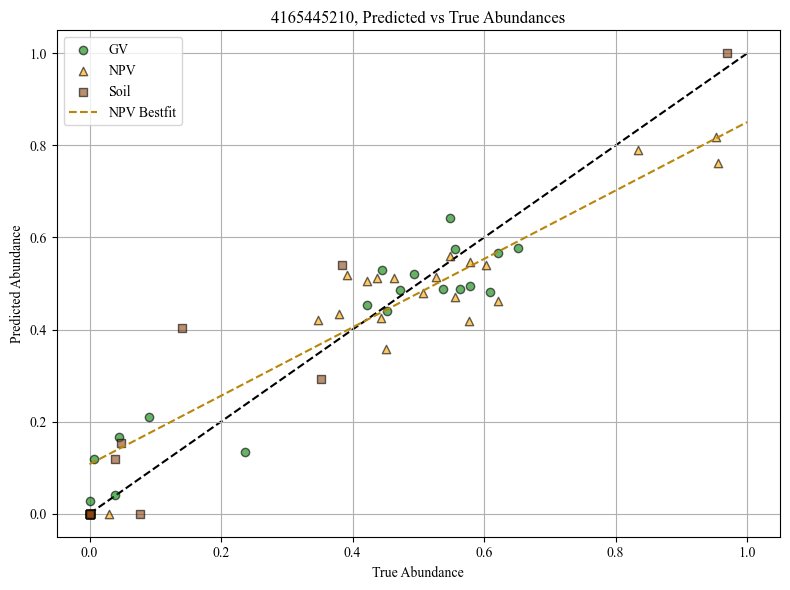

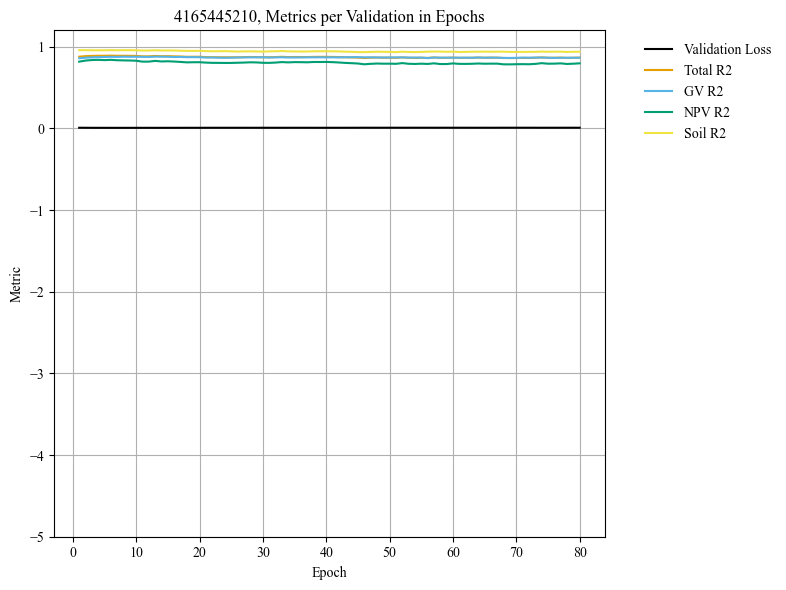

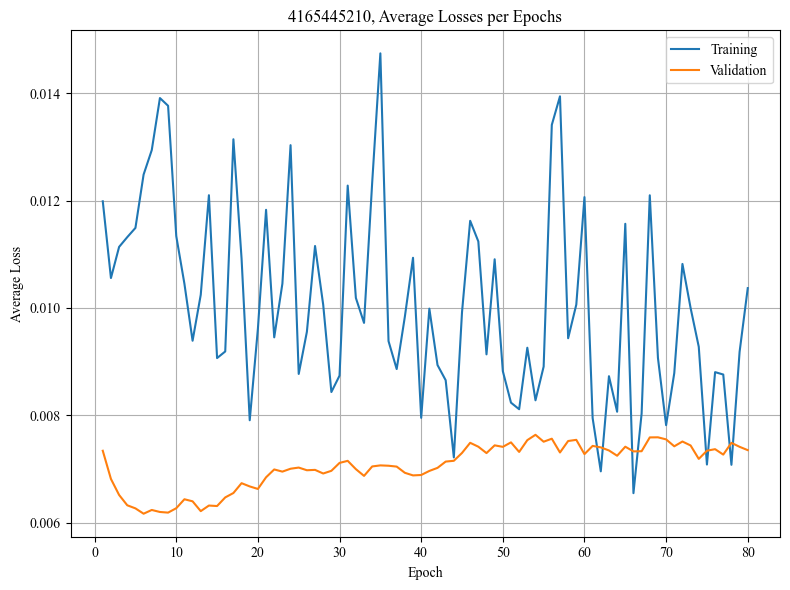

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009429
Epoch 1/80, Step 2/5, Train Loss: 0.017972
Epoch 1/80, Step 3/5, Train Loss: 0.014800
Epoch 1/80, Step 4/5, Train Loss: 0.011391
Epoch 1/80, Step 5/5, Train Loss: 0.015618
Epoch 1/80 complete. Train Loss: 0.013842, Val Loss: 0.011385
Epoch 2/80, Step 1/5, Train Loss: 0.018756
Epoch 2/80, Step 2/5, Train Loss: 0.006866
Epoch 2/80, Step 3/5, Train Loss: 0.006637
Epoch 2/80, Step 4/5, Train Loss: 0.011021
Epoch 2/80, Step 5/5, Train Loss: 0.011892
Epoch 2/80 complete. Train Loss: 0.011035, Val Loss: 0.011630
Epoch 3/80, Step 1/5, Train Loss: 0.011099
Epoch 3/80, Step 2/5, Train Loss: 0.010831
Epoch 3/80, Step 3/5, Train Loss: 0.012334
Epoch 3/80, Step 4/5, Train Loss: 0.016866
Epoch 3/80, Step 5/5, Train Loss: 0.009457
Epoch 3/80 complete. Train Loss: 0.012117, Val Loss: 0.011796
Epoch 4/80, Step 1/5, Train Loss: 0.017818
Epoch 4/80, Step 2/5, Train Loss: 0.013803
Epoch 4/80, Step 3/5, Train Loss: 0.018437
Epoch 4/80, Step 4/5, Train Loss: 0.0076

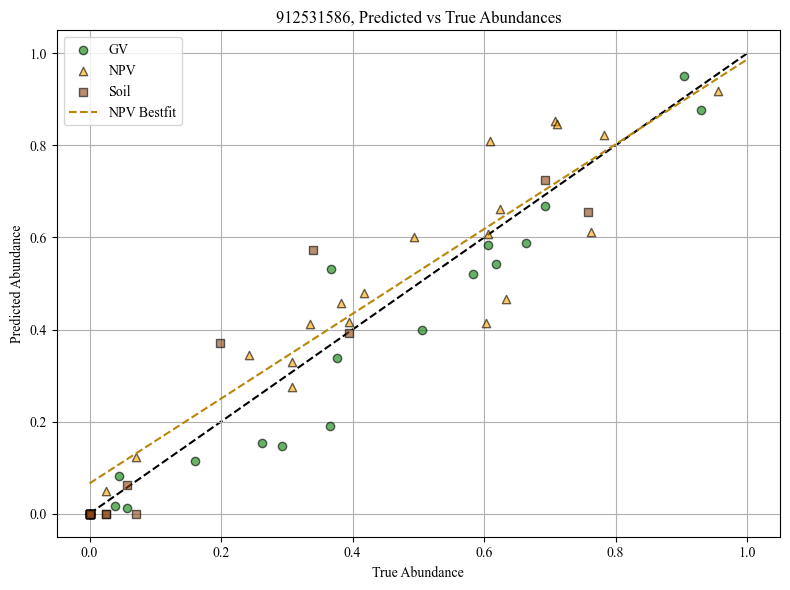

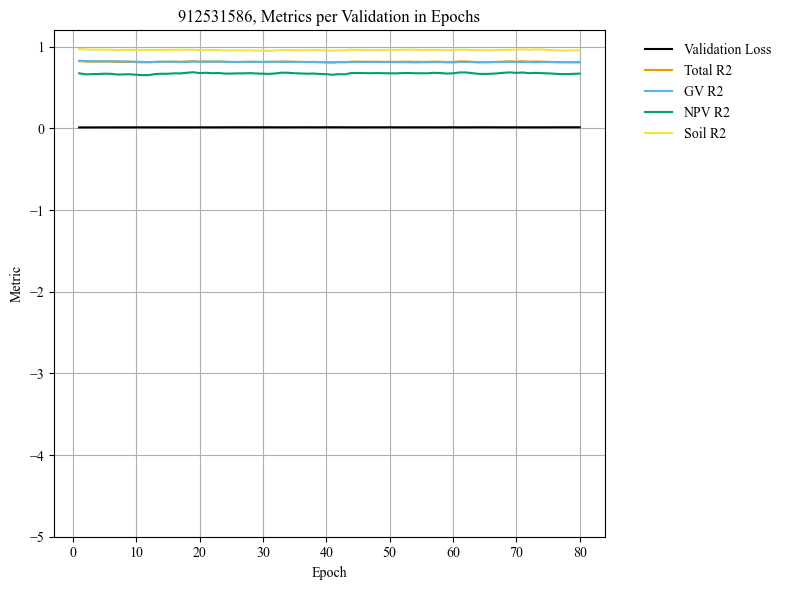

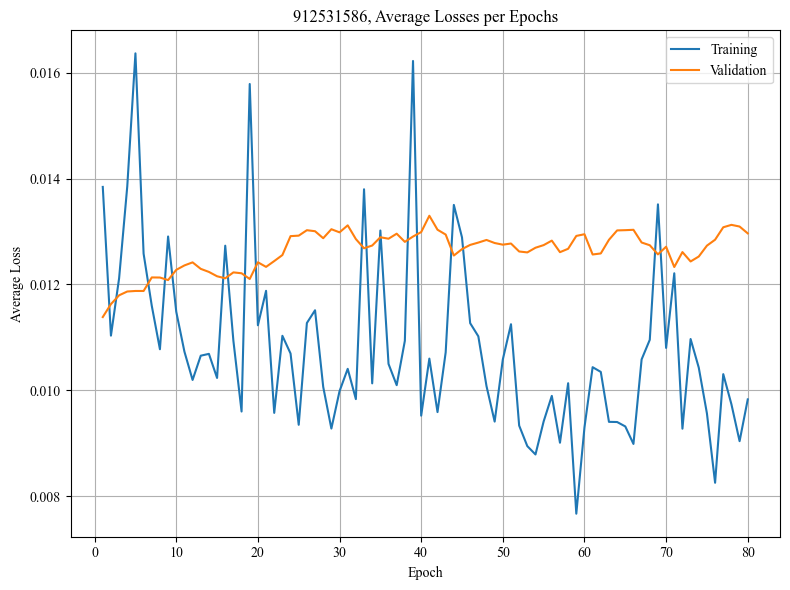

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008439
Epoch 1/80, Step 2/5, Train Loss: 0.015395
Epoch 1/80, Step 3/5, Train Loss: 0.015345
Epoch 1/80, Step 4/5, Train Loss: 0.012792
Epoch 1/80, Step 5/5, Train Loss: 0.007211
Epoch 1/80 complete. Train Loss: 0.011836, Val Loss: 0.006661
Epoch 2/80, Step 1/5, Train Loss: 0.010859
Epoch 2/80, Step 2/5, Train Loss: 0.009347
Epoch 2/80, Step 3/5, Train Loss: 0.021017
Epoch 2/80, Step 4/5, Train Loss: 0.020964
Epoch 2/80, Step 5/5, Train Loss: 0.010321
Epoch 2/80 complete. Train Loss: 0.014502, Val Loss: 0.006280
Epoch 3/80, Step 1/5, Train Loss: 0.029076
Epoch 3/80, Step 2/5, Train Loss: 0.006237
Epoch 3/80, Step 3/5, Train Loss: 0.008666
Epoch 3/80, Step 4/5, Train Loss: 0.007972
Epoch 3/80, Step 5/5, Train Loss: 0.012071
Epoch 3/80 complete. Train Loss: 0.012804, Val Loss: 0.006216
Epoch 4/80, Step 1/5, Train Loss: 0.009650
Epoch 4/80, Step 2/5, Train Loss: 0.014170
Epoch 4/80, Step 3/5, Train Loss: 0.021078
Epoch 4/80, Step 4/5, Train Loss: 0.0094

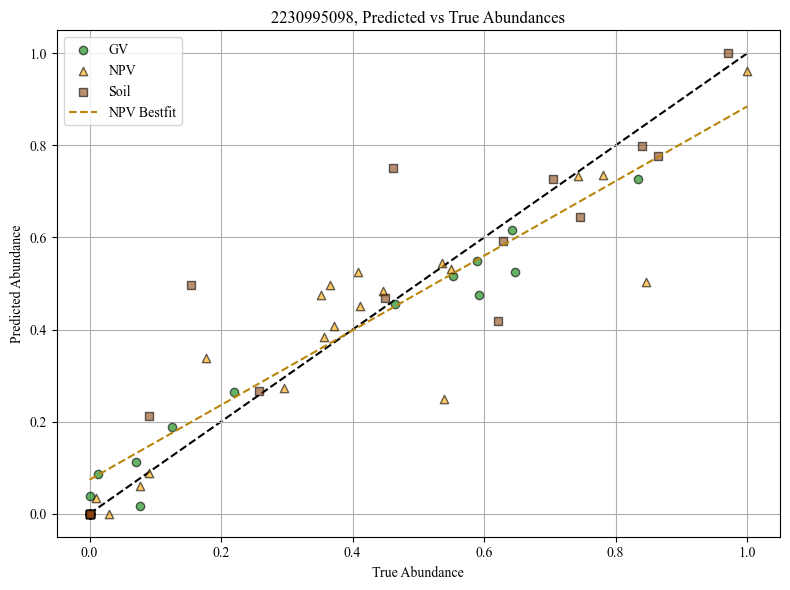

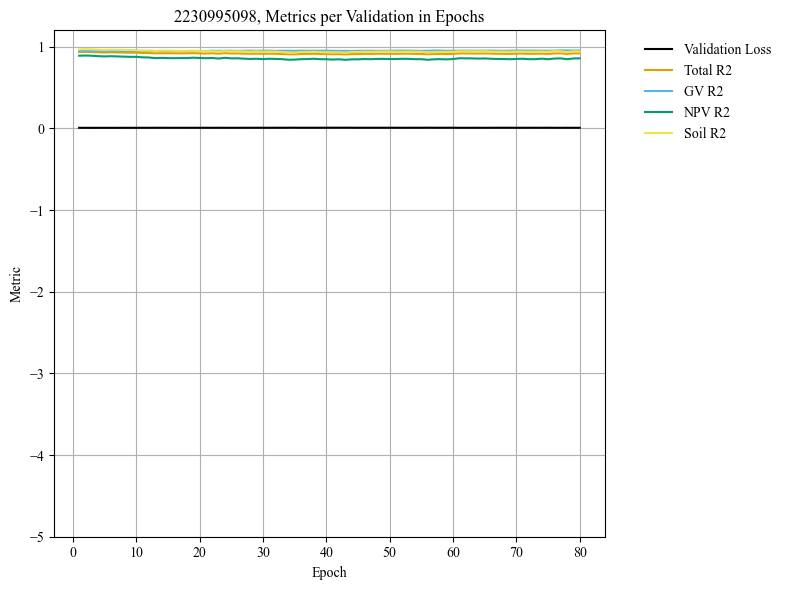

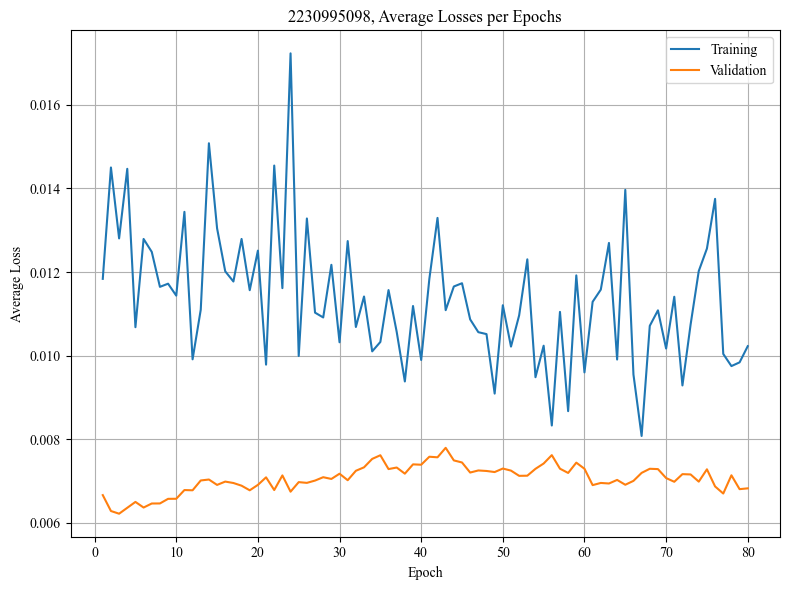

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.015599
Epoch 1/80, Step 2/5, Train Loss: 0.011470
Epoch 1/80, Step 3/5, Train Loss: 0.012250
Epoch 1/80, Step 4/5, Train Loss: 0.010558
Epoch 1/80, Step 5/5, Train Loss: 0.008780
Epoch 1/80 complete. Train Loss: 0.011731, Val Loss: 0.013963
Epoch 2/80, Step 1/5, Train Loss: 0.018505
Epoch 2/80, Step 2/5, Train Loss: 0.010968
Epoch 2/80, Step 3/5, Train Loss: 0.007974
Epoch 2/80, Step 4/5, Train Loss: 0.013488
Epoch 2/80, Step 5/5, Train Loss: 0.008840
Epoch 2/80 complete. Train Loss: 0.011955, Val Loss: 0.012603
Epoch 3/80, Step 1/5, Train Loss: 0.012133
Epoch 3/80, Step 2/5, Train Loss: 0.005581
Epoch 3/80, Step 3/5, Train Loss: 0.019831
Epoch 3/80, Step 4/5, Train Loss: 0.009993
Epoch 3/80, Step 5/5, Train Loss: 0.014347
Epoch 3/80 complete. Train Loss: 0.012377, Val Loss: 0.011840
Epoch 4/80, Step 1/5, Train Loss: 0.009543
Epoch 4/80, Step 2/5, Train Loss: 0.009477
Epoch 4/80, Step 3/5, Train Loss: 0.015810
Epoch 4/80, Step 4/5, Train Loss: 0.0130

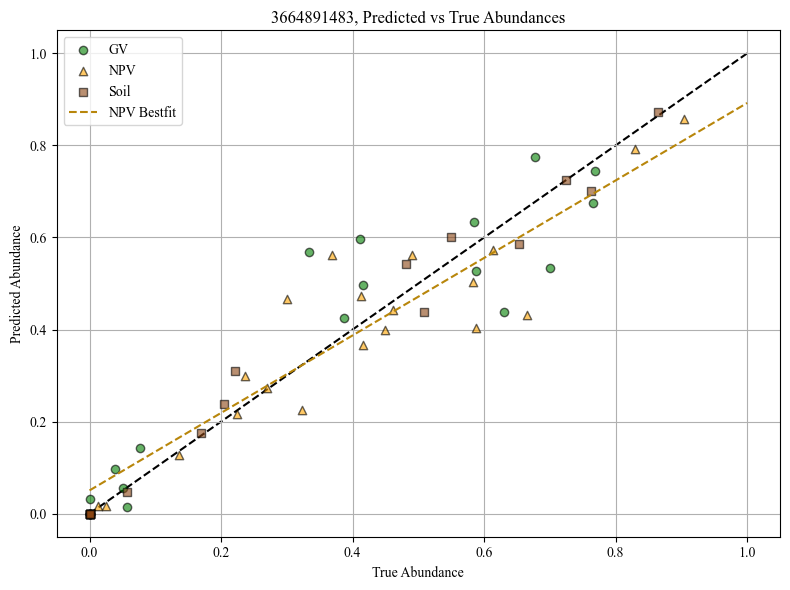

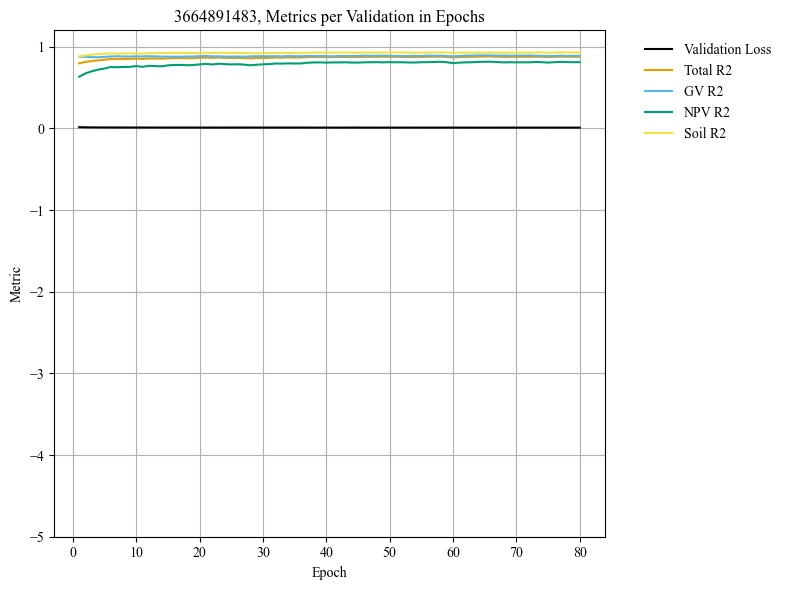

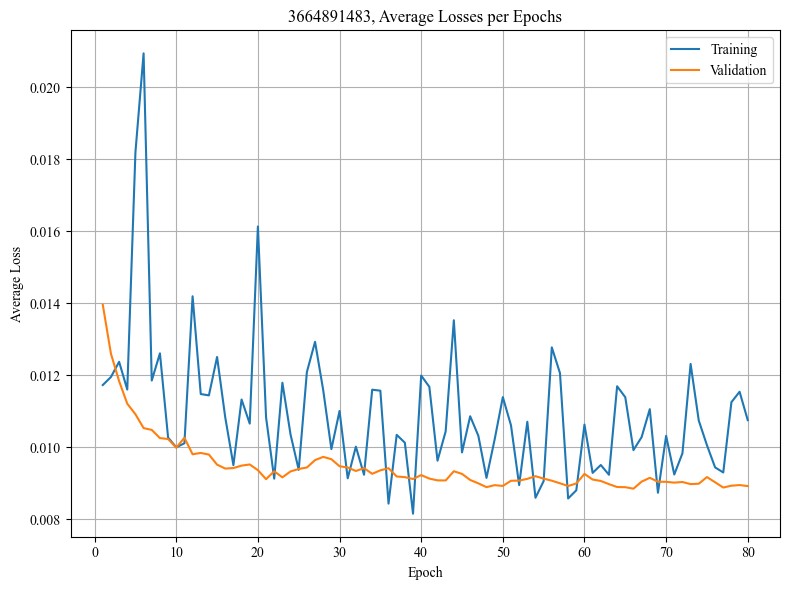

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011425
Epoch 1/80, Step 2/5, Train Loss: 0.009733
Epoch 1/80, Step 3/5, Train Loss: 0.026559
Epoch 1/80, Step 4/5, Train Loss: 0.004768
Epoch 1/80, Step 5/5, Train Loss: 0.009840
Epoch 1/80 complete. Train Loss: 0.012465, Val Loss: 0.005300
Epoch 2/80, Step 1/5, Train Loss: 0.011885
Epoch 2/80, Step 2/5, Train Loss: 0.014295
Epoch 2/80, Step 3/5, Train Loss: 0.009043
Epoch 2/80, Step 4/5, Train Loss: 0.012972
Epoch 2/80, Step 5/5, Train Loss: 0.011318
Epoch 2/80 complete. Train Loss: 0.011903, Val Loss: 0.005570
Epoch 3/80, Step 1/5, Train Loss: 0.017133
Epoch 3/80, Step 2/5, Train Loss: 0.007157
Epoch 3/80, Step 3/5, Train Loss: 0.008783
Epoch 3/80, Step 4/5, Train Loss: 0.009733
Epoch 3/80, Step 5/5, Train Loss: 0.007846
Epoch 3/80 complete. Train Loss: 0.010130, Val Loss: 0.005732
Epoch 4/80, Step 1/5, Train Loss: 0.014365
Epoch 4/80, Step 2/5, Train Loss: 0.008057
Epoch 4/80, Step 3/5, Train Loss: 0.013888
Epoch 4/80, Step 4/5, Train Loss: 0.0093

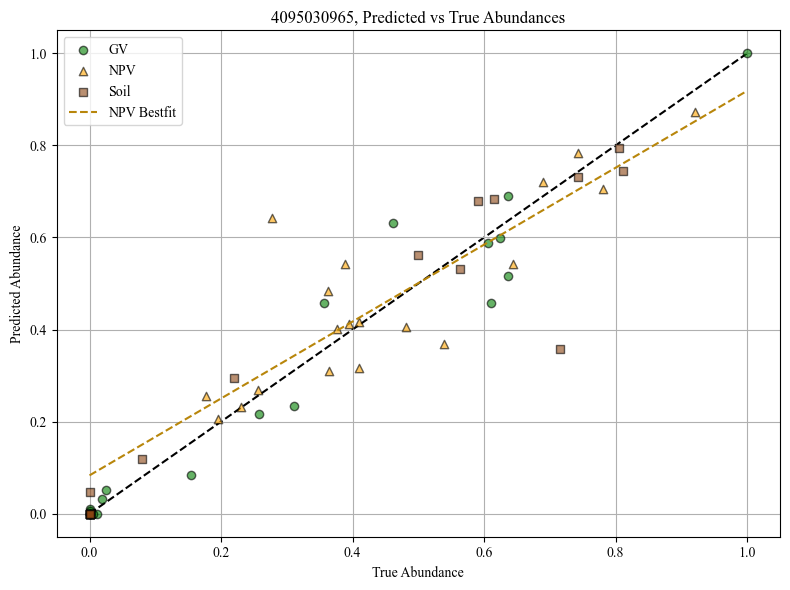

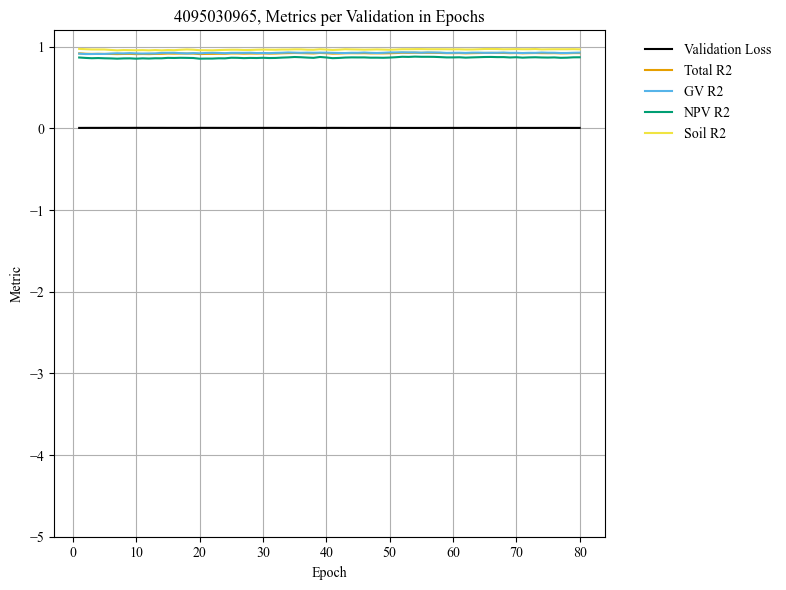

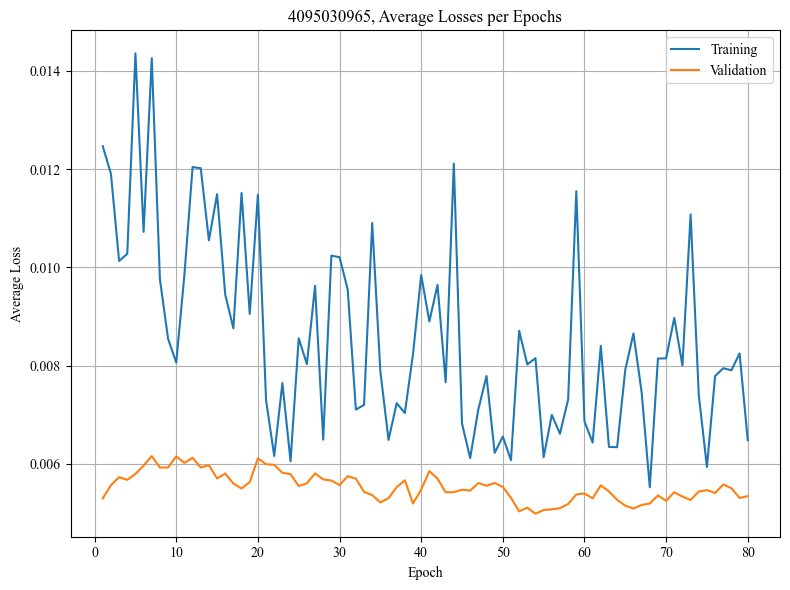

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.015808
Epoch 1/80, Step 2/5, Train Loss: 0.012154
Epoch 1/80, Step 3/5, Train Loss: 0.017593
Epoch 1/80, Step 4/5, Train Loss: 0.015612
Epoch 1/80, Step 5/5, Train Loss: 0.008456
Epoch 1/80 complete. Train Loss: 0.013924, Val Loss: 0.012882
Epoch 2/80, Step 1/5, Train Loss: 0.007326
Epoch 2/80, Step 2/5, Train Loss: 0.010829
Epoch 2/80, Step 3/5, Train Loss: 0.006430
Epoch 2/80, Step 4/5, Train Loss: 0.007957
Epoch 2/80, Step 5/5, Train Loss: 0.025319
Epoch 2/80 complete. Train Loss: 0.011572, Val Loss: 0.012264
Epoch 3/80, Step 1/5, Train Loss: 0.007363
Epoch 3/80, Step 2/5, Train Loss: 0.013347
Epoch 3/80, Step 3/5, Train Loss: 0.011839
Epoch 3/80, Step 4/5, Train Loss: 0.012491
Epoch 3/80, Step 5/5, Train Loss: 0.006762
Epoch 3/80 complete. Train Loss: 0.010361, Val Loss: 0.011198
Epoch 4/80, Step 1/5, Train Loss: 0.009529
Epoch 4/80, Step 2/5, Train Loss: 0.011865
Epoch 4/80, Step 3/5, Train Loss: 0.018950
Epoch 4/80, Step 4/5, Train Loss: 0.0108

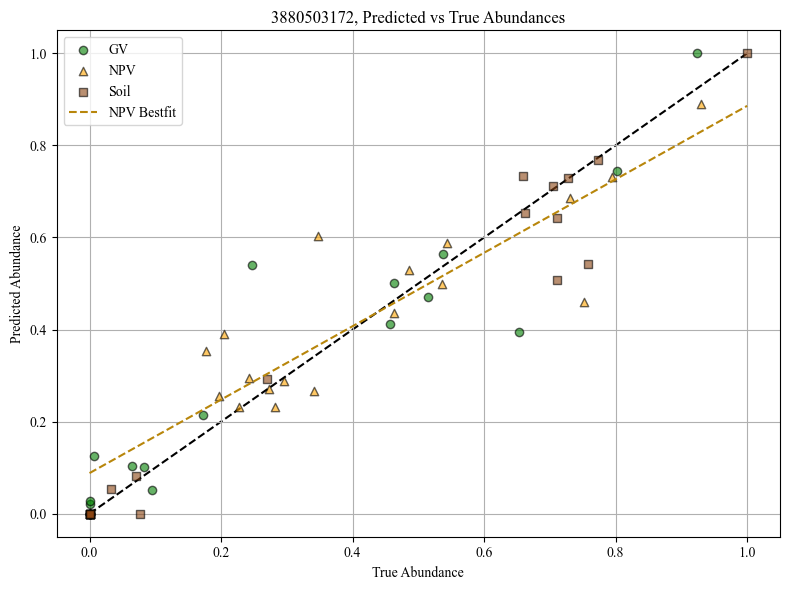

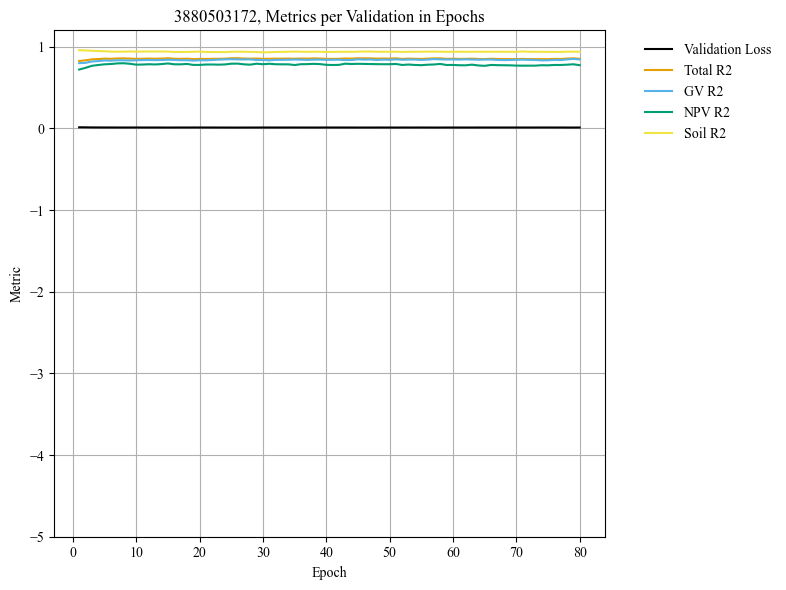

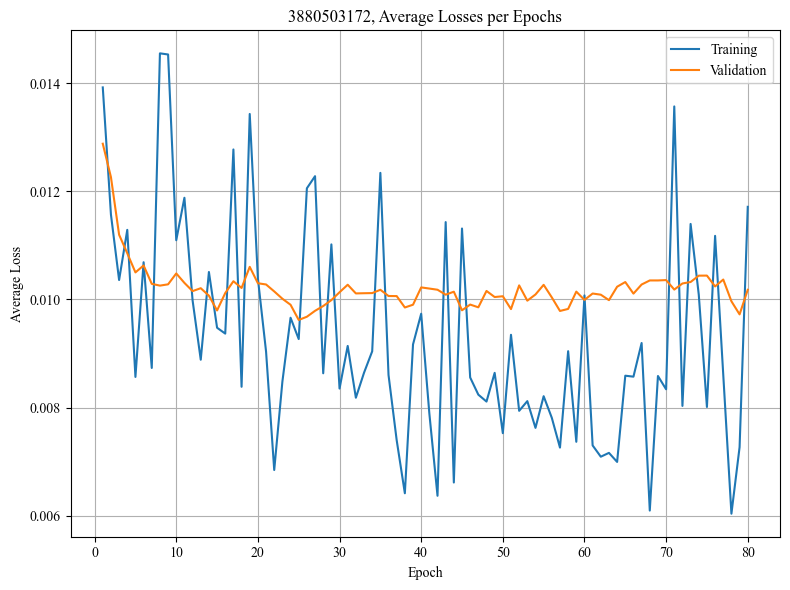

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008510
Epoch 1/80, Step 2/5, Train Loss: 0.011664
Epoch 1/80, Step 3/5, Train Loss: 0.005386
Epoch 1/80, Step 4/5, Train Loss: 0.008904
Epoch 1/80, Step 5/5, Train Loss: 0.014736
Epoch 1/80 complete. Train Loss: 0.009840, Val Loss: 0.004229
Epoch 2/80, Step 1/5, Train Loss: 0.008377
Epoch 2/80, Step 2/5, Train Loss: 0.014286
Epoch 2/80, Step 3/5, Train Loss: 0.004925
Epoch 2/80, Step 4/5, Train Loss: 0.009170
Epoch 2/80, Step 5/5, Train Loss: 0.011613
Epoch 2/80 complete. Train Loss: 0.009674, Val Loss: 0.004048
Epoch 3/80, Step 1/5, Train Loss: 0.004990
Epoch 3/80, Step 2/5, Train Loss: 0.018881
Epoch 3/80, Step 3/5, Train Loss: 0.005011
Epoch 3/80, Step 4/5, Train Loss: 0.009596
Epoch 3/80, Step 5/5, Train Loss: 0.008156
Epoch 3/80 complete. Train Loss: 0.009327, Val Loss: 0.004044
Epoch 4/80, Step 1/5, Train Loss: 0.021129
Epoch 4/80, Step 2/5, Train Loss: 0.011957
Epoch 4/80, Step 3/5, Train Loss: 0.023013
Epoch 4/80, Step 4/5, Train Loss: 0.0044

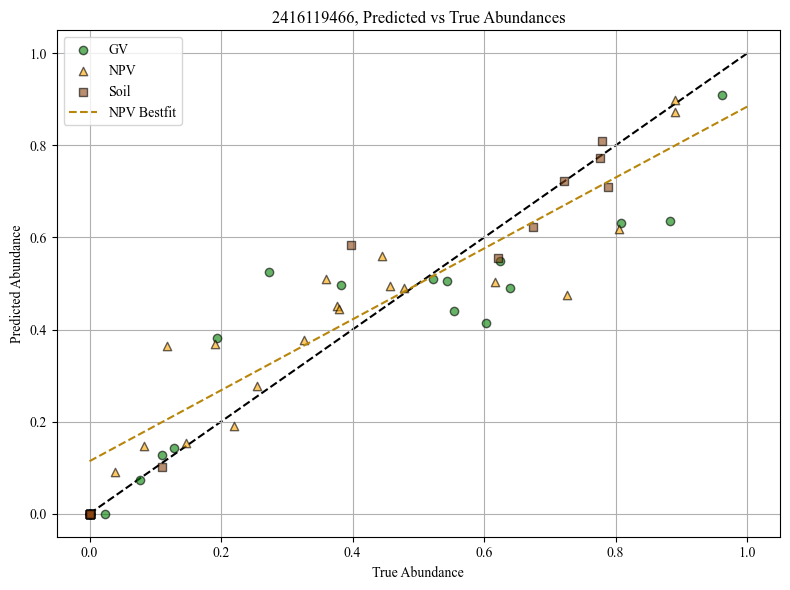

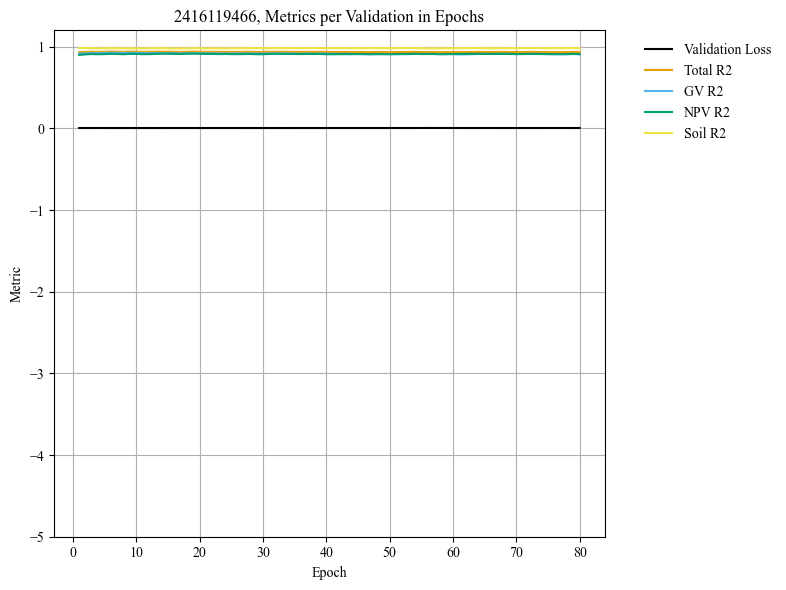

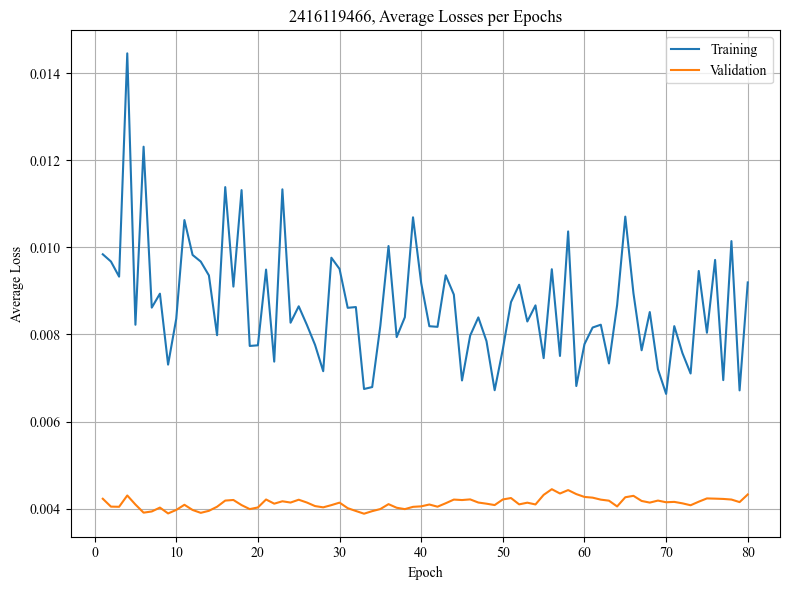

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.021893
Epoch 1/80, Step 2/5, Train Loss: 0.012423
Epoch 1/80, Step 3/5, Train Loss: 0.012274
Epoch 1/80, Step 4/5, Train Loss: 0.021483
Epoch 1/80, Step 5/5, Train Loss: 0.007443
Epoch 1/80 complete. Train Loss: 0.015103, Val Loss: 0.017692
Epoch 2/80, Step 1/5, Train Loss: 0.012342
Epoch 2/80, Step 2/5, Train Loss: 0.022717
Epoch 2/80, Step 3/5, Train Loss: 0.012975
Epoch 2/80, Step 4/5, Train Loss: 0.019427
Epoch 2/80, Step 5/5, Train Loss: 0.011400
Epoch 2/80 complete. Train Loss: 0.015772, Val Loss: 0.016270
Epoch 3/80, Step 1/5, Train Loss: 0.010066
Epoch 3/80, Step 2/5, Train Loss: 0.017691
Epoch 3/80, Step 3/5, Train Loss: 0.013297
Epoch 3/80, Step 4/5, Train Loss: 0.011150
Epoch 3/80, Step 5/5, Train Loss: 0.018137
Epoch 3/80 complete. Train Loss: 0.014068, Val Loss: 0.016020
Epoch 4/80, Step 1/5, Train Loss: 0.013155
Epoch 4/80, Step 2/5, Train Loss: 0.012953
Epoch 4/80, Step 3/5, Train Loss: 0.006336
Epoch 4/80, Step 4/5, Train Loss: 0.0091

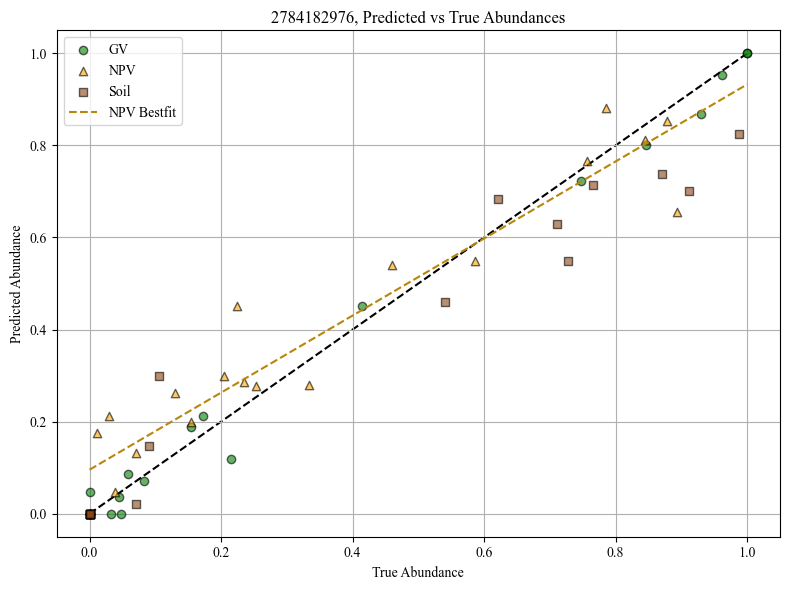

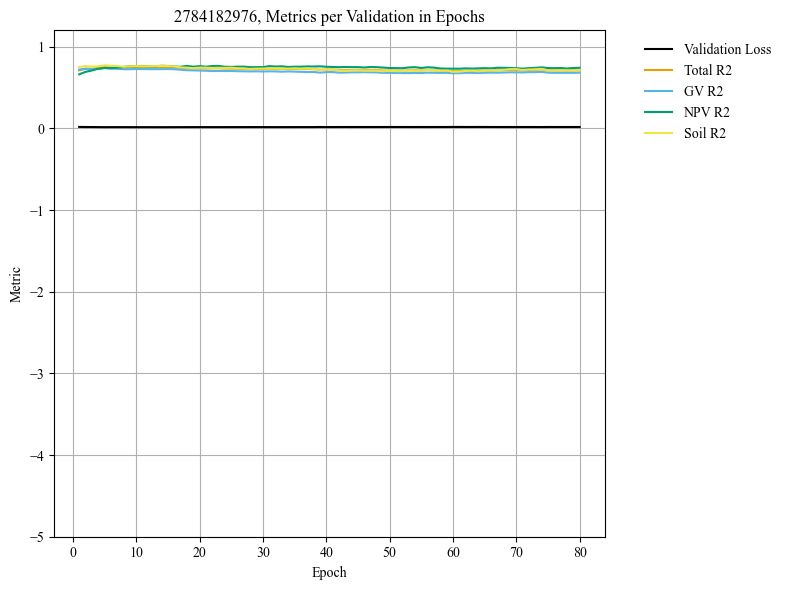

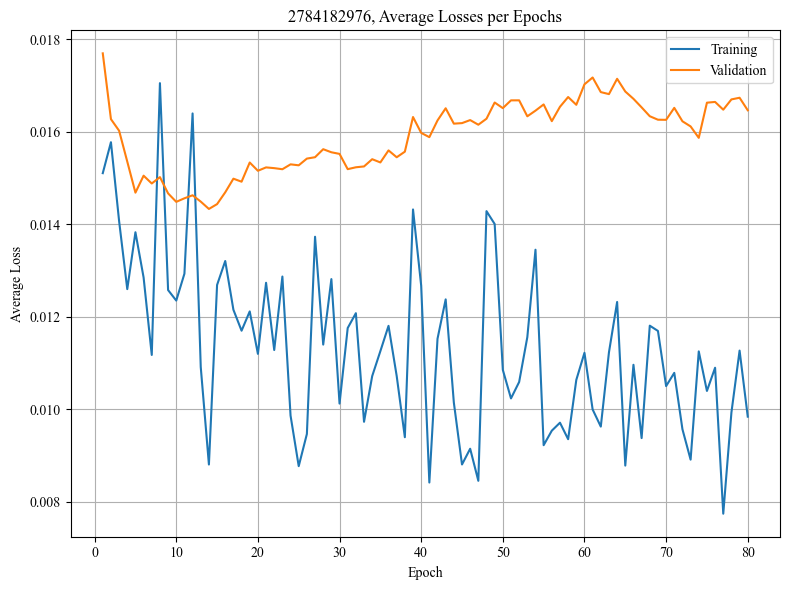

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.005072
Epoch 1/80, Step 2/5, Train Loss: 0.012261
Epoch 1/80, Step 3/5, Train Loss: 0.020681
Epoch 1/80, Step 4/5, Train Loss: 0.009048
Epoch 1/80, Step 5/5, Train Loss: 0.006553
Epoch 1/80 complete. Train Loss: 0.010723, Val Loss: 0.011060
Epoch 2/80, Step 1/5, Train Loss: 0.019526
Epoch 2/80, Step 2/5, Train Loss: 0.005594
Epoch 2/80, Step 3/5, Train Loss: 0.009061
Epoch 2/80, Step 4/5, Train Loss: 0.012149
Epoch 2/80, Step 5/5, Train Loss: 0.008353
Epoch 2/80 complete. Train Loss: 0.010937, Val Loss: 0.011402
Epoch 3/80, Step 1/5, Train Loss: 0.008474
Epoch 3/80, Step 2/5, Train Loss: 0.009432
Epoch 3/80, Step 3/5, Train Loss: 0.008536
Epoch 3/80, Step 4/5, Train Loss: 0.012797
Epoch 3/80, Step 5/5, Train Loss: 0.009813
Epoch 3/80 complete. Train Loss: 0.009810, Val Loss: 0.011598
Epoch 4/80, Step 1/5, Train Loss: 0.006137
Epoch 4/80, Step 2/5, Train Loss: 0.007233
Epoch 4/80, Step 3/5, Train Loss: 0.004428
Epoch 4/80, Step 4/5, Train Loss: 0.0117

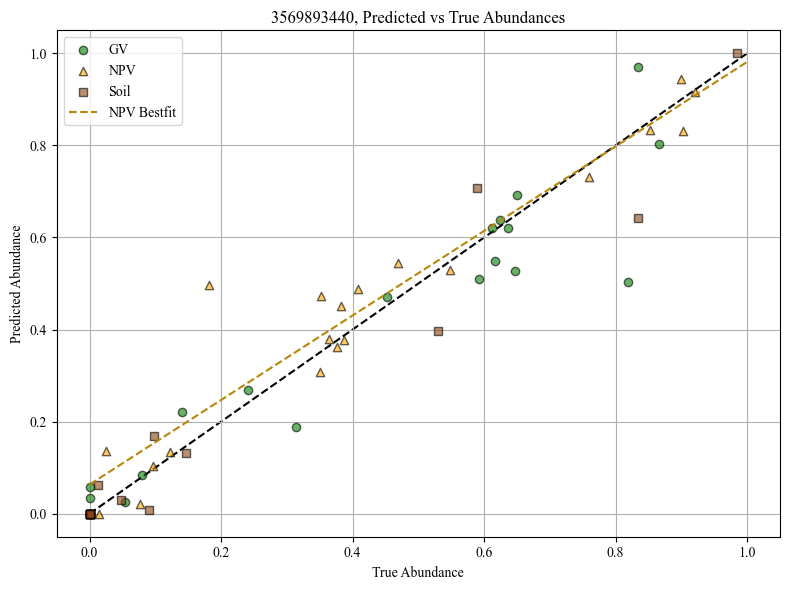

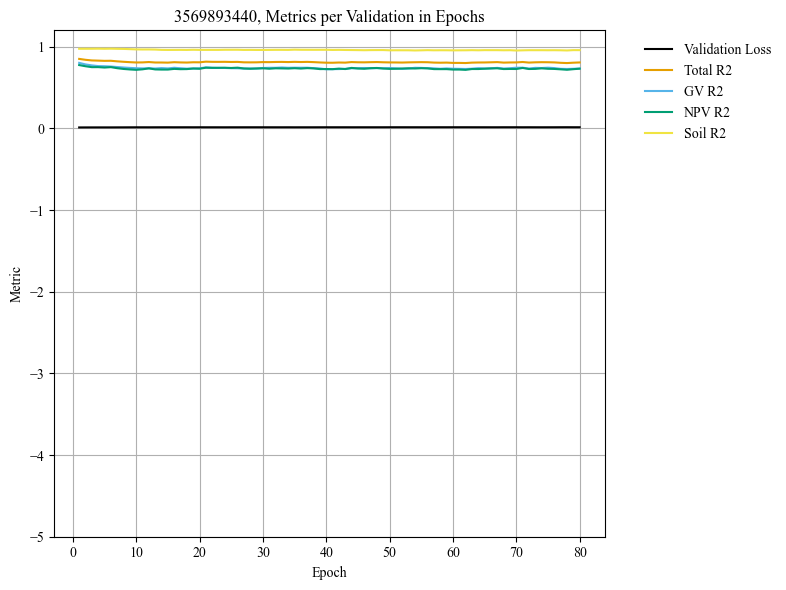

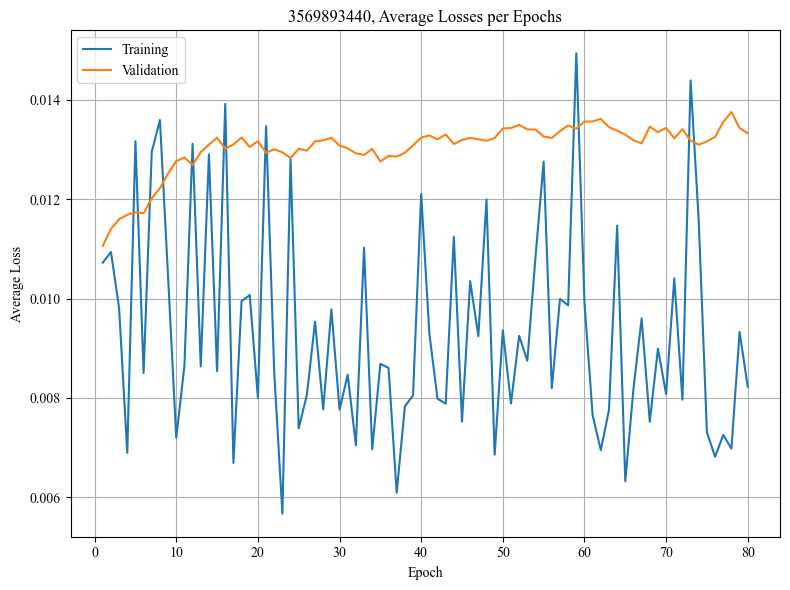

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009765
Epoch 1/80, Step 2/5, Train Loss: 0.004157
Epoch 1/80, Step 3/5, Train Loss: 0.003810
Epoch 1/80, Step 4/5, Train Loss: 0.008251
Epoch 1/80, Step 5/5, Train Loss: 0.009644
Epoch 1/80 complete. Train Loss: 0.007126, Val Loss: 0.007708
Epoch 2/80, Step 1/5, Train Loss: 0.007133
Epoch 2/80, Step 2/5, Train Loss: 0.007799
Epoch 2/80, Step 3/5, Train Loss: 0.008424
Epoch 2/80, Step 4/5, Train Loss: 0.006850
Epoch 2/80, Step 5/5, Train Loss: 0.005913
Epoch 2/80 complete. Train Loss: 0.007224, Val Loss: 0.007137
Epoch 3/80, Step 1/5, Train Loss: 0.013179
Epoch 3/80, Step 2/5, Train Loss: 0.008413
Epoch 3/80, Step 3/5, Train Loss: 0.004478
Epoch 3/80, Step 4/5, Train Loss: 0.005332
Epoch 3/80, Step 5/5, Train Loss: 0.008975
Epoch 3/80 complete. Train Loss: 0.008075, Val Loss: 0.007105
Epoch 4/80, Step 1/5, Train Loss: 0.007772
Epoch 4/80, Step 2/5, Train Loss: 0.005816
Epoch 4/80, Step 3/5, Train Loss: 0.009521
Epoch 4/80, Step 4/5, Train Loss: 0.0105

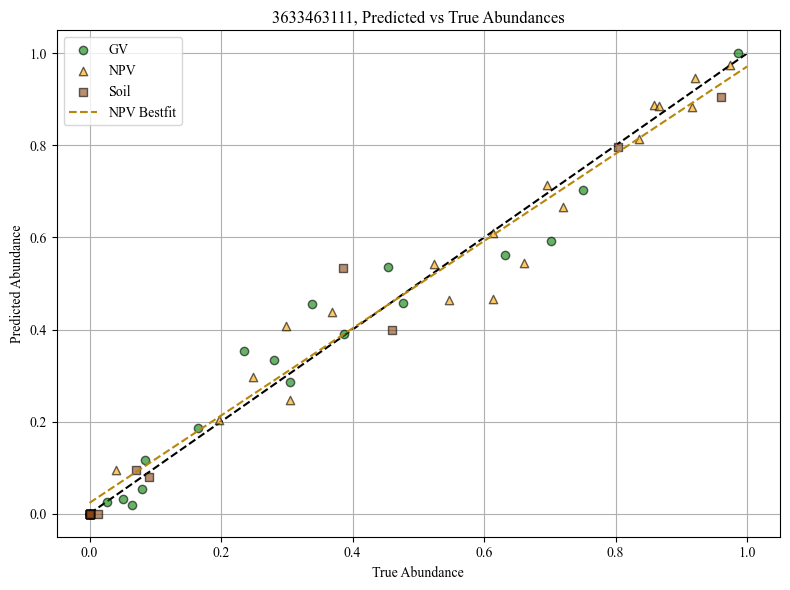

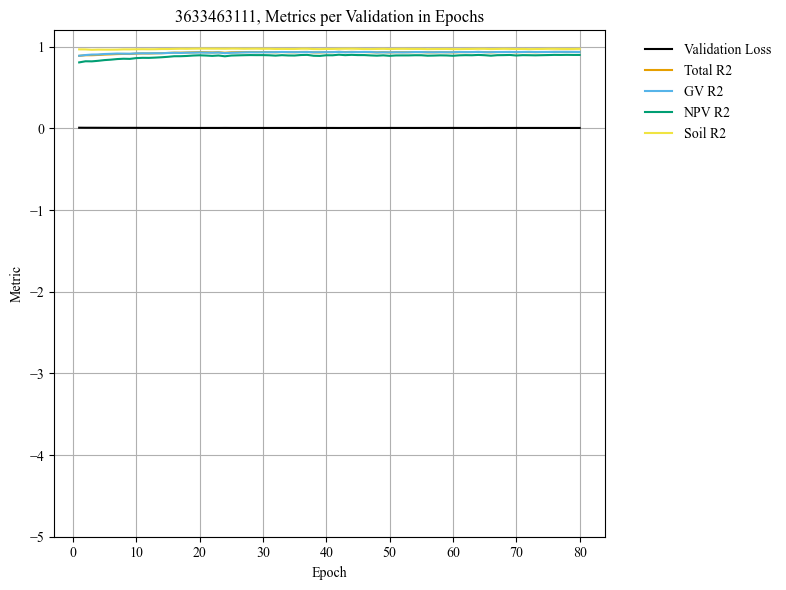

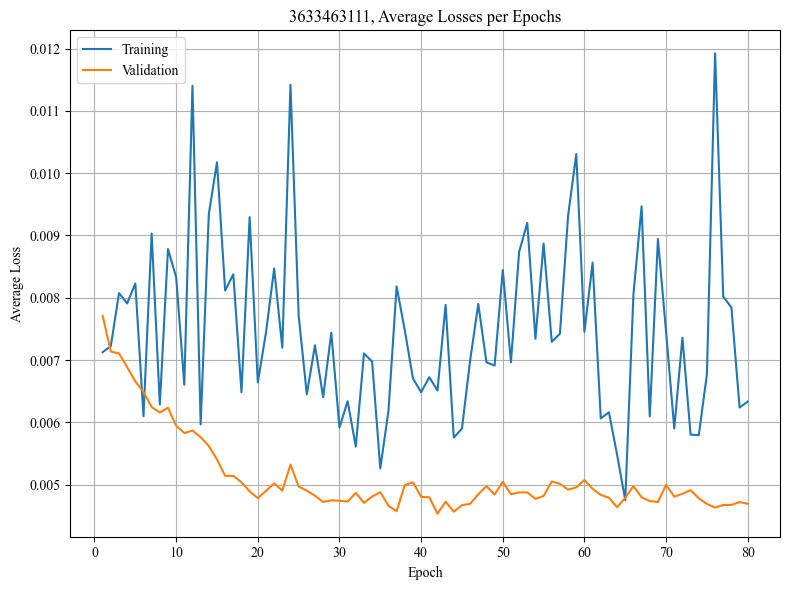

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.006695
Epoch 1/80, Step 2/5, Train Loss: 0.019422
Epoch 1/80, Step 3/5, Train Loss: 0.011265
Epoch 1/80, Step 4/5, Train Loss: 0.029863
Epoch 1/80, Step 5/5, Train Loss: 0.016375
Epoch 1/80 complete. Train Loss: 0.016724, Val Loss: 0.013184
Epoch 2/80, Step 1/5, Train Loss: 0.015769
Epoch 2/80, Step 2/5, Train Loss: 0.011089
Epoch 2/80, Step 3/5, Train Loss: 0.014489
Epoch 2/80, Step 4/5, Train Loss: 0.003710
Epoch 2/80, Step 5/5, Train Loss: 0.014580
Epoch 2/80 complete. Train Loss: 0.011927, Val Loss: 0.012204
Epoch 3/80, Step 1/5, Train Loss: 0.005605
Epoch 3/80, Step 2/5, Train Loss: 0.014109
Epoch 3/80, Step 3/5, Train Loss: 0.008903
Epoch 3/80, Step 4/5, Train Loss: 0.014574
Epoch 3/80, Step 5/5, Train Loss: 0.015054
Epoch 3/80 complete. Train Loss: 0.011649, Val Loss: 0.011974
Epoch 4/80, Step 1/5, Train Loss: 0.018806
Epoch 4/80, Step 2/5, Train Loss: 0.011196
Epoch 4/80, Step 3/5, Train Loss: 0.013763
Epoch 4/80, Step 4/5, Train Loss: 0.0113

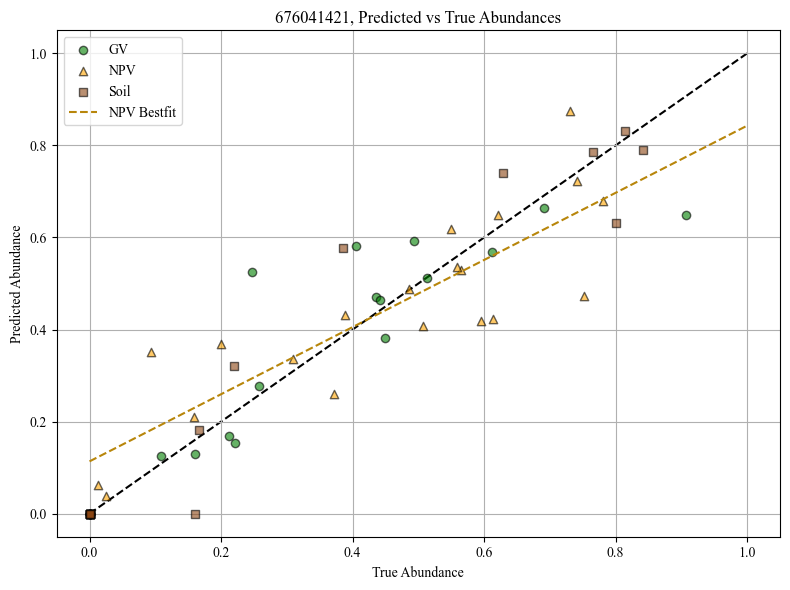

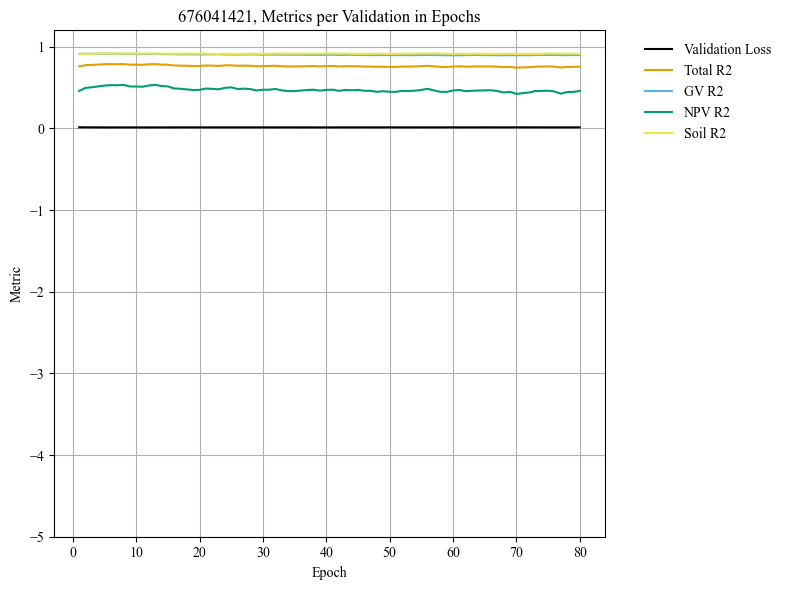

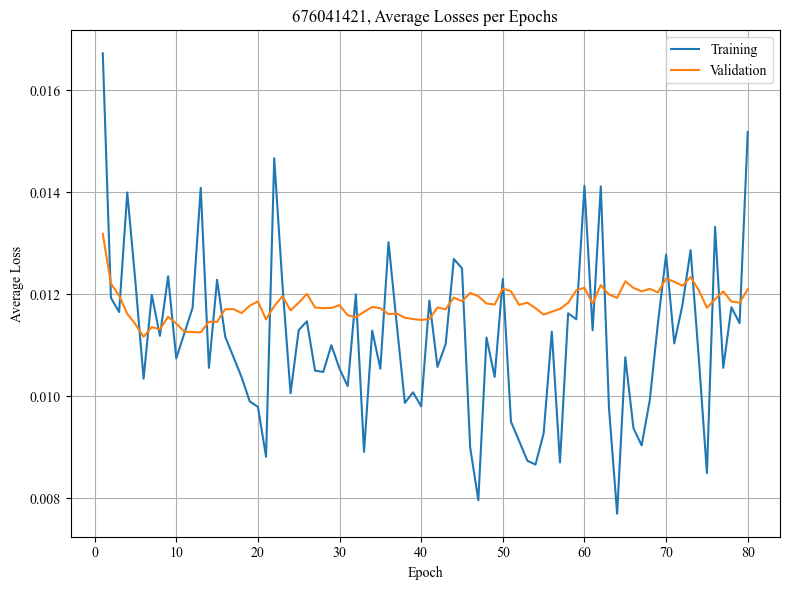

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008271
Epoch 1/80, Step 2/5, Train Loss: 0.014555
Epoch 1/80, Step 3/5, Train Loss: 0.021835
Epoch 1/80, Step 4/5, Train Loss: 0.013576
Epoch 1/80, Step 5/5, Train Loss: 0.008439
Epoch 1/80 complete. Train Loss: 0.013335, Val Loss: 0.012076
Epoch 2/80, Step 1/5, Train Loss: 0.008734
Epoch 2/80, Step 2/5, Train Loss: 0.010818
Epoch 2/80, Step 3/5, Train Loss: 0.016465
Epoch 2/80, Step 4/5, Train Loss: 0.011791
Epoch 2/80, Step 5/5, Train Loss: 0.004360
Epoch 2/80 complete. Train Loss: 0.010433, Val Loss: 0.011891
Epoch 3/80, Step 1/5, Train Loss: 0.020419
Epoch 3/80, Step 2/5, Train Loss: 0.008013
Epoch 3/80, Step 3/5, Train Loss: 0.010384
Epoch 3/80, Step 4/5, Train Loss: 0.009445
Epoch 3/80, Step 5/5, Train Loss: 0.007111
Epoch 3/80 complete. Train Loss: 0.011074, Val Loss: 0.011443
Epoch 4/80, Step 1/5, Train Loss: 0.006186
Epoch 4/80, Step 2/5, Train Loss: 0.008840
Epoch 4/80, Step 3/5, Train Loss: 0.010381
Epoch 4/80, Step 4/5, Train Loss: 0.0110

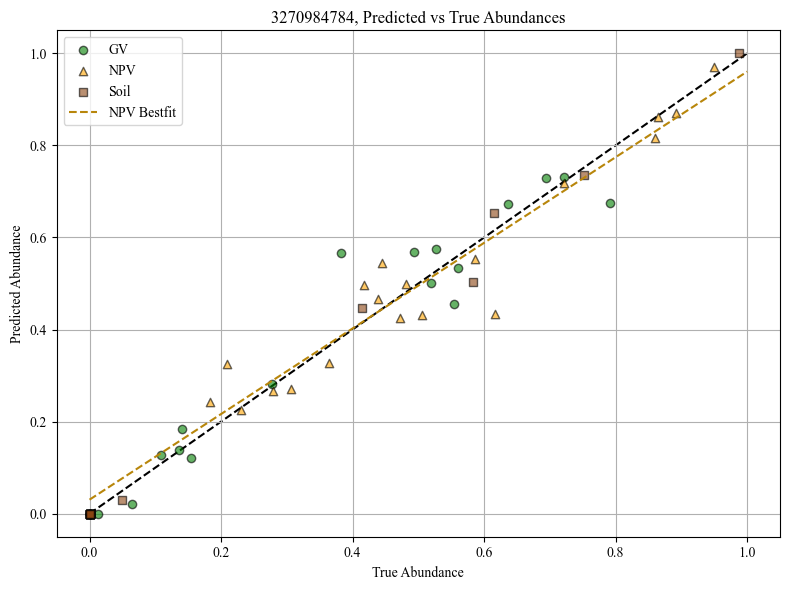

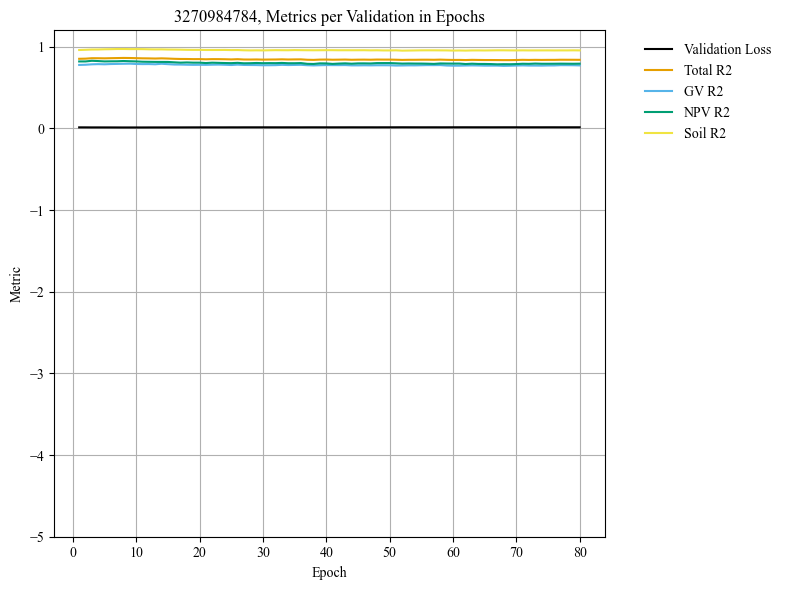

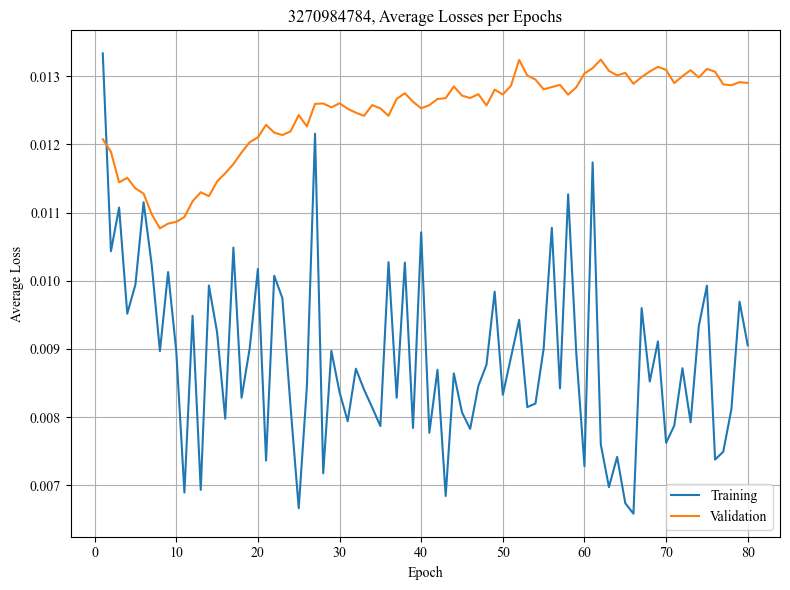

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.020543
Epoch 1/80, Step 2/5, Train Loss: 0.030371
Epoch 1/80, Step 3/5, Train Loss: 0.010966
Epoch 1/80, Step 4/5, Train Loss: 0.010702
Epoch 1/80, Step 5/5, Train Loss: 0.009202
Epoch 1/80 complete. Train Loss: 0.016357, Val Loss: 0.009558
Epoch 2/80, Step 1/5, Train Loss: 0.013993
Epoch 2/80, Step 2/5, Train Loss: 0.014988
Epoch 2/80, Step 3/5, Train Loss: 0.012411
Epoch 2/80, Step 4/5, Train Loss: 0.010861
Epoch 2/80, Step 5/5, Train Loss: 0.016917
Epoch 2/80 complete. Train Loss: 0.013834, Val Loss: 0.009371
Epoch 3/80, Step 1/5, Train Loss: 0.011103
Epoch 3/80, Step 2/5, Train Loss: 0.014037
Epoch 3/80, Step 3/5, Train Loss: 0.015964
Epoch 3/80, Step 4/5, Train Loss: 0.014951
Epoch 3/80, Step 5/5, Train Loss: 0.013725
Epoch 3/80 complete. Train Loss: 0.013956, Val Loss: 0.009133
Epoch 4/80, Step 1/5, Train Loss: 0.012667
Epoch 4/80, Step 2/5, Train Loss: 0.015664
Epoch 4/80, Step 3/5, Train Loss: 0.023291
Epoch 4/80, Step 4/5, Train Loss: 0.0215

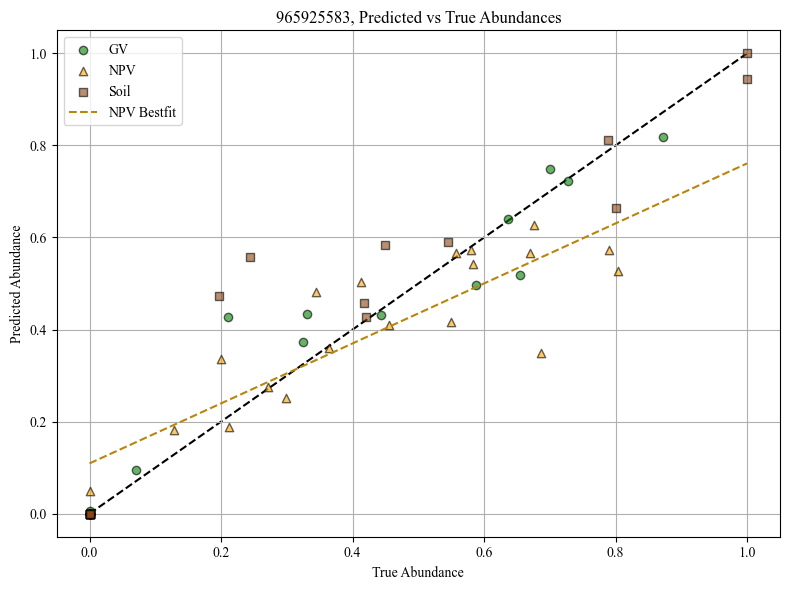

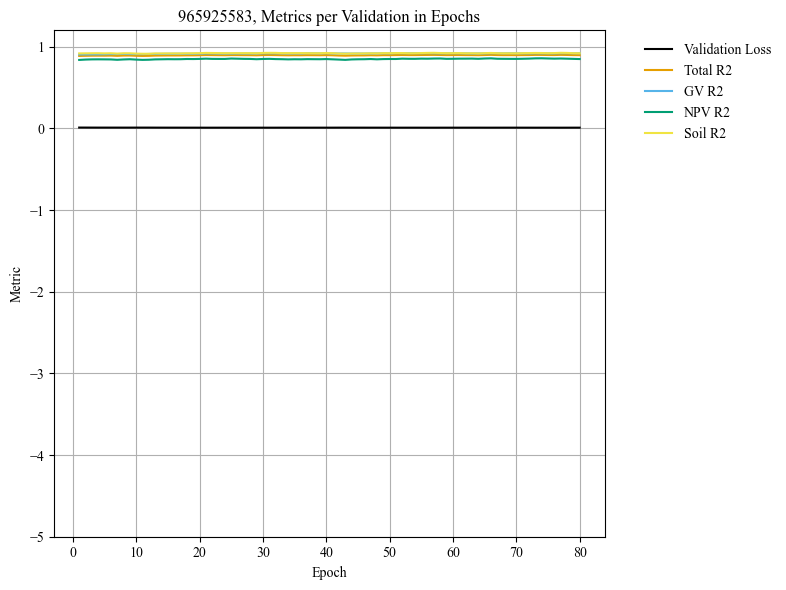

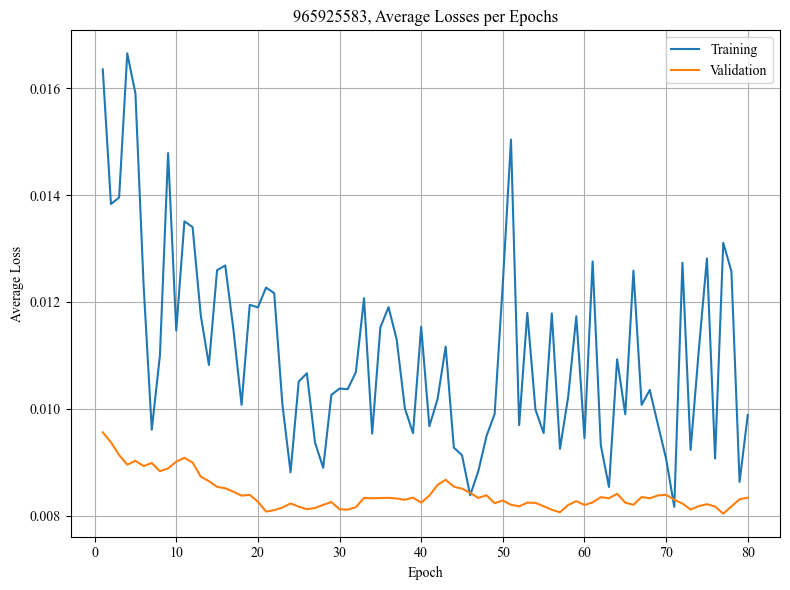

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018186
Epoch 1/80, Step 2/5, Train Loss: 0.005429
Epoch 1/80, Step 3/5, Train Loss: 0.012557
Epoch 1/80, Step 4/5, Train Loss: 0.006918
Epoch 1/80, Step 5/5, Train Loss: 0.009776
Epoch 1/80 complete. Train Loss: 0.010573, Val Loss: 0.008653
Epoch 2/80, Step 1/5, Train Loss: 0.006670
Epoch 2/80, Step 2/5, Train Loss: 0.010865
Epoch 2/80, Step 3/5, Train Loss: 0.012107
Epoch 2/80, Step 4/5, Train Loss: 0.004916
Epoch 2/80, Step 5/5, Train Loss: 0.007088
Epoch 2/80 complete. Train Loss: 0.008329, Val Loss: 0.008863
Epoch 3/80, Step 1/5, Train Loss: 0.007852
Epoch 3/80, Step 2/5, Train Loss: 0.004527
Epoch 3/80, Step 3/5, Train Loss: 0.010074
Epoch 3/80, Step 4/5, Train Loss: 0.004167
Epoch 3/80, Step 5/5, Train Loss: 0.010325
Epoch 3/80 complete. Train Loss: 0.007389, Val Loss: 0.009052
Epoch 4/80, Step 1/5, Train Loss: 0.004043
Epoch 4/80, Step 2/5, Train Loss: 0.004701
Epoch 4/80, Step 3/5, Train Loss: 0.009480
Epoch 4/80, Step 4/5, Train Loss: 0.0102

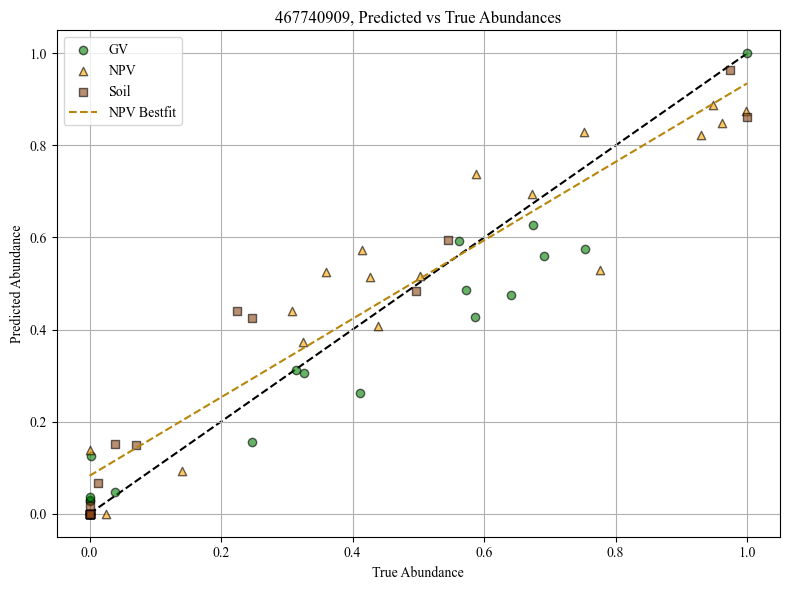

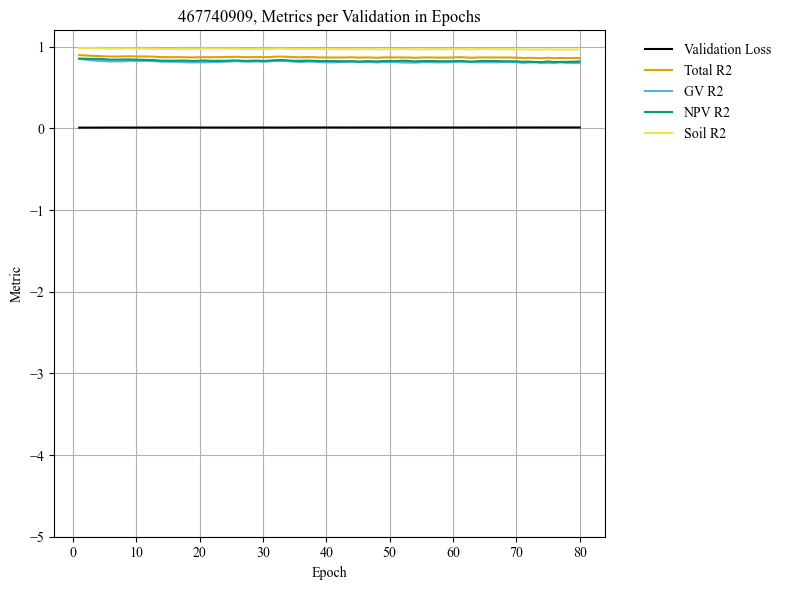

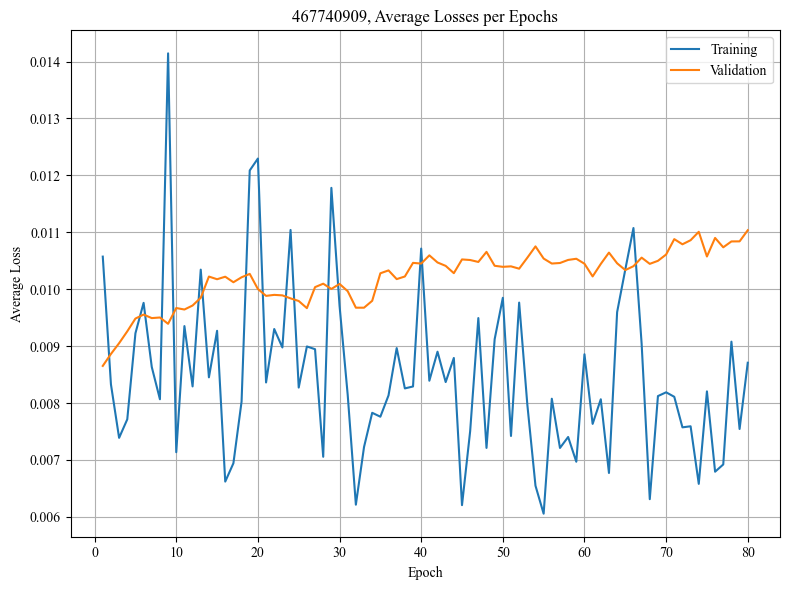

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018425
Epoch 1/80, Step 2/5, Train Loss: 0.014421
Epoch 1/80, Step 3/5, Train Loss: 0.015406
Epoch 1/80, Step 4/5, Train Loss: 0.018080
Epoch 1/80, Step 5/5, Train Loss: 0.011142
Epoch 1/80 complete. Train Loss: 0.015495, Val Loss: 0.009587
Epoch 2/80, Step 1/5, Train Loss: 0.007343
Epoch 2/80, Step 2/5, Train Loss: 0.020851
Epoch 2/80, Step 3/5, Train Loss: 0.007745
Epoch 2/80, Step 4/5, Train Loss: 0.007807
Epoch 2/80, Step 5/5, Train Loss: 0.010809
Epoch 2/80 complete. Train Loss: 0.010911, Val Loss: 0.009127
Epoch 3/80, Step 1/5, Train Loss: 0.016962
Epoch 3/80, Step 2/5, Train Loss: 0.013323
Epoch 3/80, Step 3/5, Train Loss: 0.013257
Epoch 3/80, Step 4/5, Train Loss: 0.008981
Epoch 3/80, Step 5/5, Train Loss: 0.008298
Epoch 3/80 complete. Train Loss: 0.012164, Val Loss: 0.008456
Epoch 4/80, Step 1/5, Train Loss: 0.011521
Epoch 4/80, Step 2/5, Train Loss: 0.007647
Epoch 4/80, Step 3/5, Train Loss: 0.014317
Epoch 4/80, Step 4/5, Train Loss: 0.0136

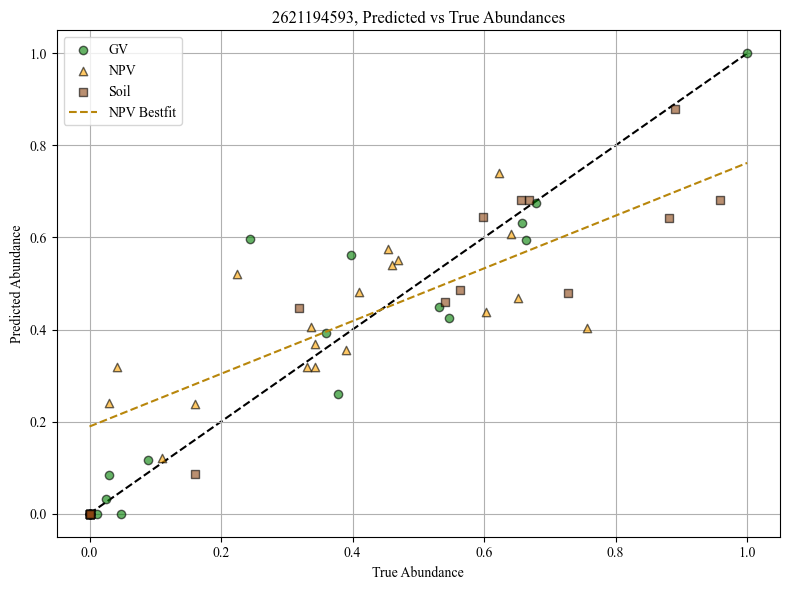

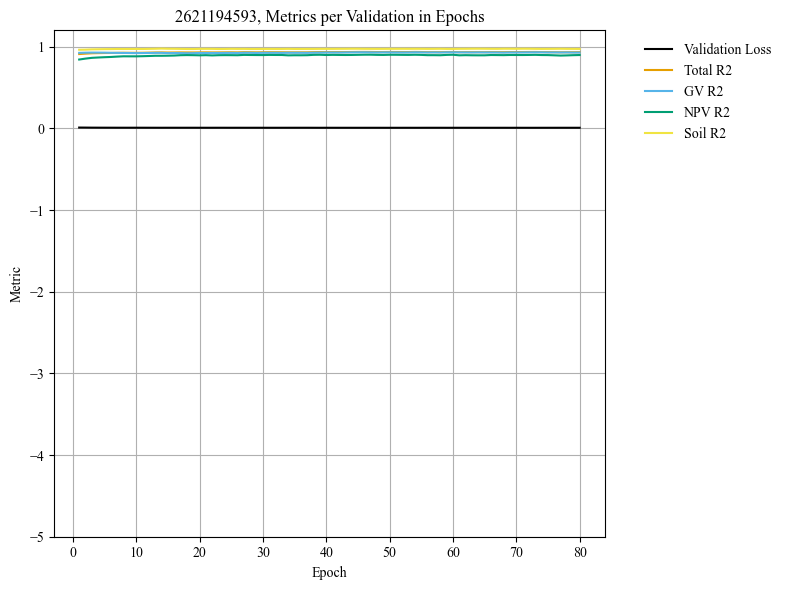

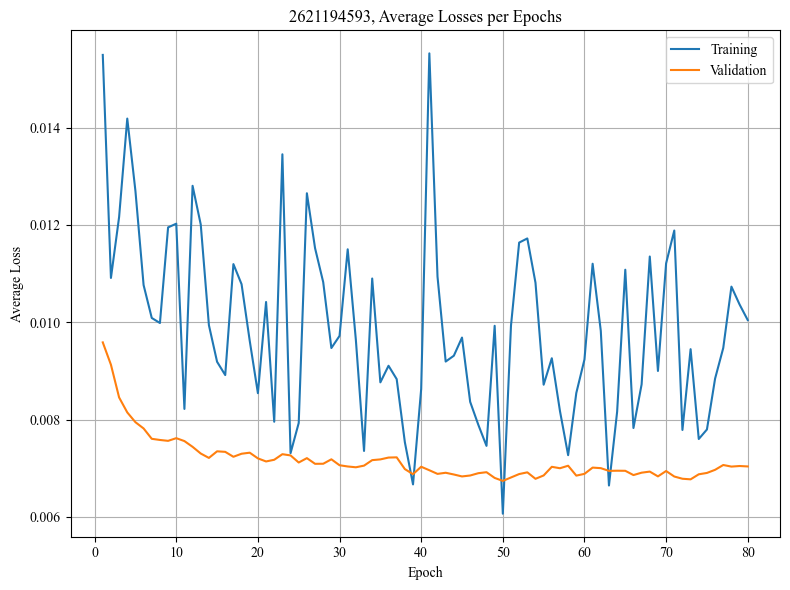

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007666
Epoch 1/80, Step 2/5, Train Loss: 0.008745
Epoch 1/80, Step 3/5, Train Loss: 0.012423
Epoch 1/80, Step 4/5, Train Loss: 0.014134
Epoch 1/80, Step 5/5, Train Loss: 0.015763
Epoch 1/80 complete. Train Loss: 0.011746, Val Loss: 0.009889
Epoch 2/80, Step 1/5, Train Loss: 0.005403
Epoch 2/80, Step 2/5, Train Loss: 0.017974
Epoch 2/80, Step 3/5, Train Loss: 0.017310
Epoch 2/80, Step 4/5, Train Loss: 0.013711
Epoch 2/80, Step 5/5, Train Loss: 0.018875
Epoch 2/80 complete. Train Loss: 0.014654, Val Loss: 0.009497
Epoch 3/80, Step 1/5, Train Loss: 0.006640
Epoch 3/80, Step 2/5, Train Loss: 0.013663
Epoch 3/80, Step 3/5, Train Loss: 0.016230
Epoch 3/80, Step 4/5, Train Loss: 0.018152
Epoch 3/80, Step 5/5, Train Loss: 0.007612
Epoch 3/80 complete. Train Loss: 0.012460, Val Loss: 0.009536
Epoch 4/80, Step 1/5, Train Loss: 0.023012
Epoch 4/80, Step 2/5, Train Loss: 0.012466
Epoch 4/80, Step 3/5, Train Loss: 0.014392
Epoch 4/80, Step 4/5, Train Loss: 0.0092

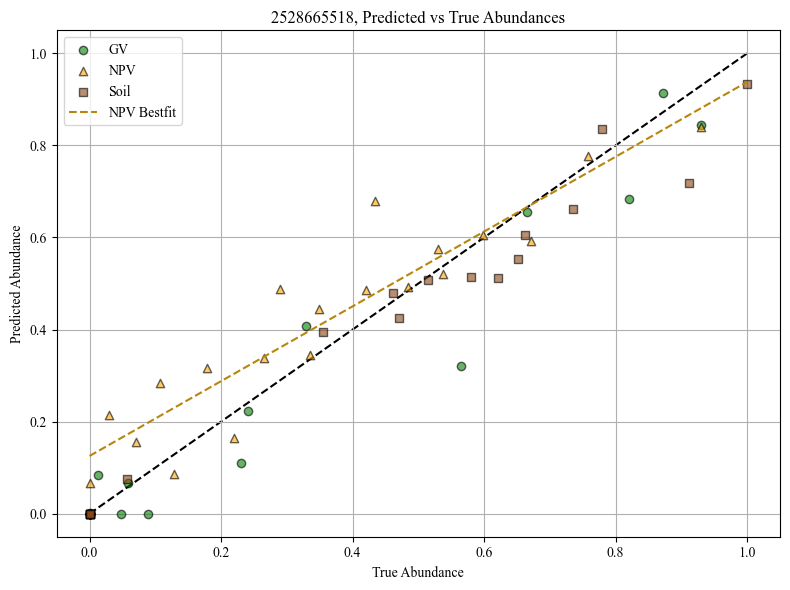

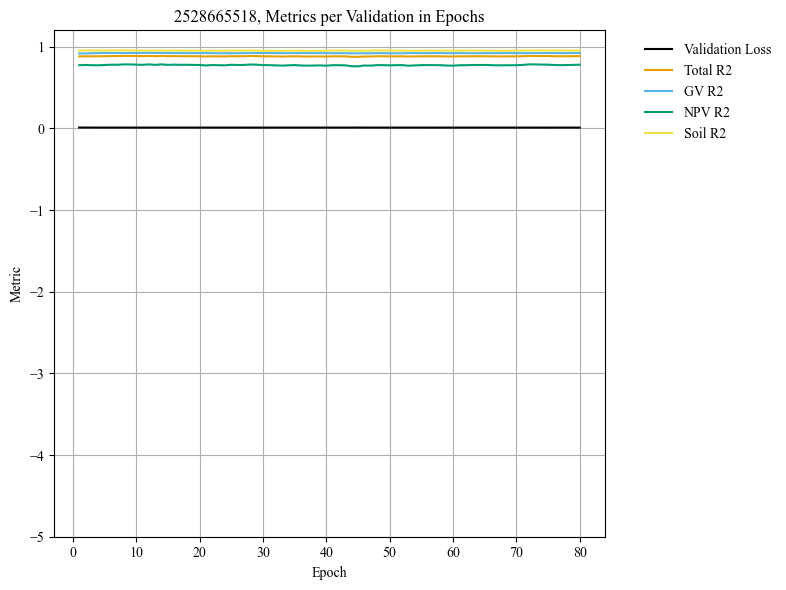

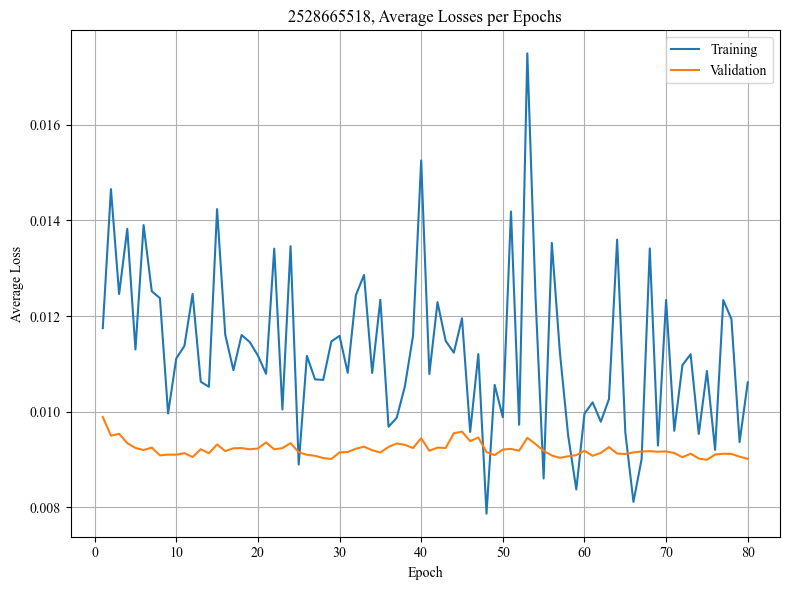

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.008431
Epoch 1/80, Step 2/5, Train Loss: 0.006664
Epoch 1/80, Step 3/5, Train Loss: 0.005676
Epoch 1/80, Step 4/5, Train Loss: 0.004848
Epoch 1/80, Step 5/5, Train Loss: 0.015291
Epoch 1/80 complete. Train Loss: 0.008182, Val Loss: 0.008389
Epoch 2/80, Step 1/5, Train Loss: 0.007688
Epoch 2/80, Step 2/5, Train Loss: 0.010247
Epoch 2/80, Step 3/5, Train Loss: 0.008353
Epoch 2/80, Step 4/5, Train Loss: 0.005443
Epoch 2/80, Step 5/5, Train Loss: 0.010683
Epoch 2/80 complete. Train Loss: 0.008483, Val Loss: 0.008576
Epoch 3/80, Step 1/5, Train Loss: 0.010970
Epoch 3/80, Step 2/5, Train Loss: 0.009917
Epoch 3/80, Step 3/5, Train Loss: 0.003201
Epoch 3/80, Step 4/5, Train Loss: 0.007223
Epoch 3/80, Step 5/5, Train Loss: 0.008614
Epoch 3/80 complete. Train Loss: 0.007985, Val Loss: 0.008625
Epoch 4/80, Step 1/5, Train Loss: 0.006180
Epoch 4/80, Step 2/5, Train Loss: 0.009852
Epoch 4/80, Step 3/5, Train Loss: 0.004881
Epoch 4/80, Step 4/5, Train Loss: 0.0080

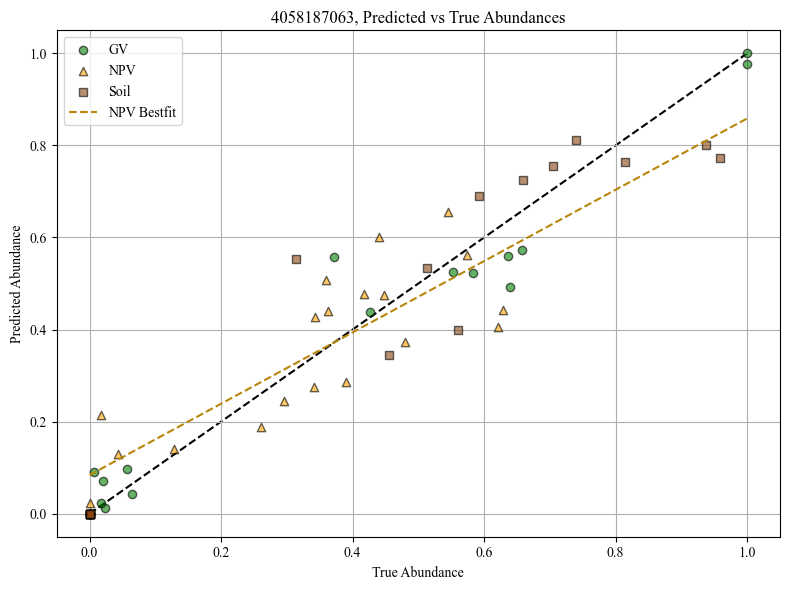

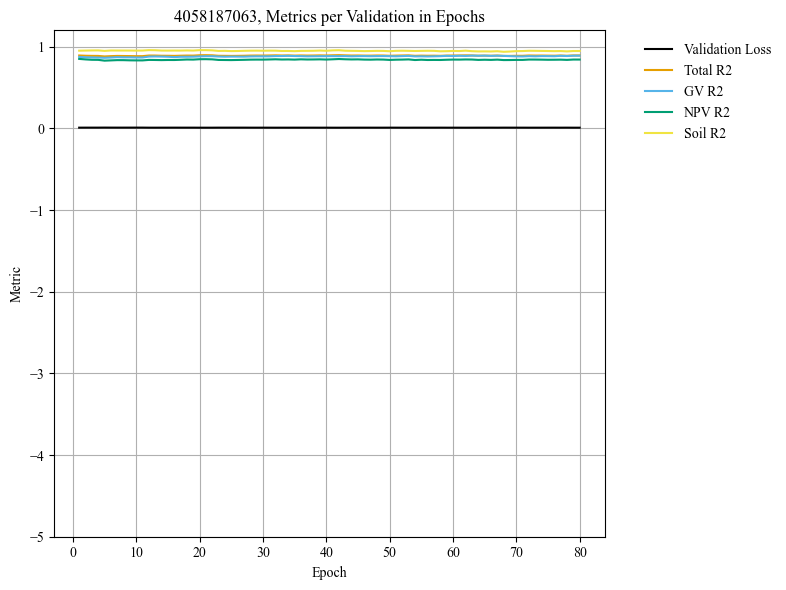

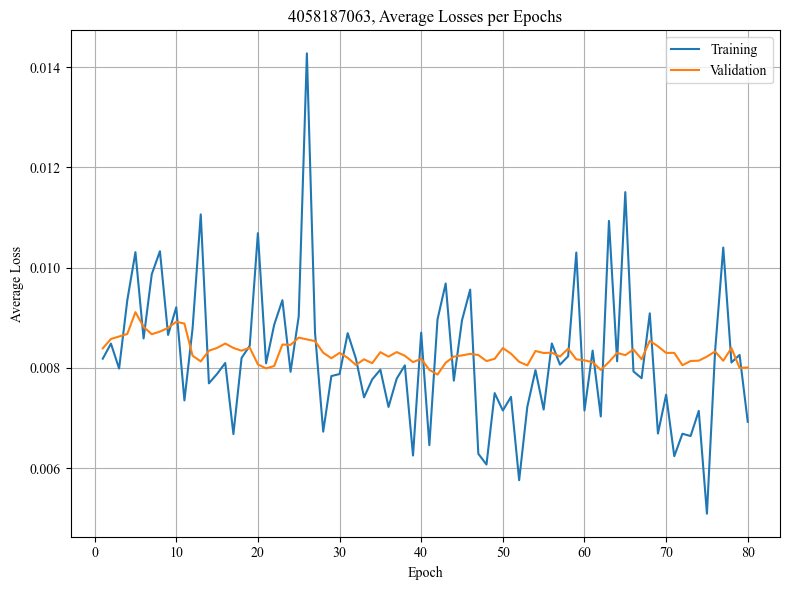

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.011522
Epoch 1/80, Step 2/5, Train Loss: 0.016924
Epoch 1/80, Step 3/5, Train Loss: 0.007990
Epoch 1/80, Step 4/5, Train Loss: 0.010431
Epoch 1/80, Step 5/5, Train Loss: 0.015552
Epoch 1/80 complete. Train Loss: 0.012484, Val Loss: 0.010238
Epoch 2/80, Step 1/5, Train Loss: 0.030486
Epoch 2/80, Step 2/5, Train Loss: 0.014906
Epoch 2/80, Step 3/5, Train Loss: 0.033611
Epoch 2/80, Step 4/5, Train Loss: 0.011696
Epoch 2/80, Step 5/5, Train Loss: 0.008248
Epoch 2/80 complete. Train Loss: 0.019789, Val Loss: 0.010322
Epoch 3/80, Step 1/5, Train Loss: 0.022044
Epoch 3/80, Step 2/5, Train Loss: 0.008634
Epoch 3/80, Step 3/5, Train Loss: 0.013135
Epoch 3/80, Step 4/5, Train Loss: 0.012055
Epoch 3/80, Step 5/5, Train Loss: 0.018427
Epoch 3/80 complete. Train Loss: 0.014859, Val Loss: 0.010606
Epoch 4/80, Step 1/5, Train Loss: 0.019806
Epoch 4/80, Step 2/5, Train Loss: 0.010254
Epoch 4/80, Step 3/5, Train Loss: 0.015015
Epoch 4/80, Step 4/5, Train Loss: 0.0306

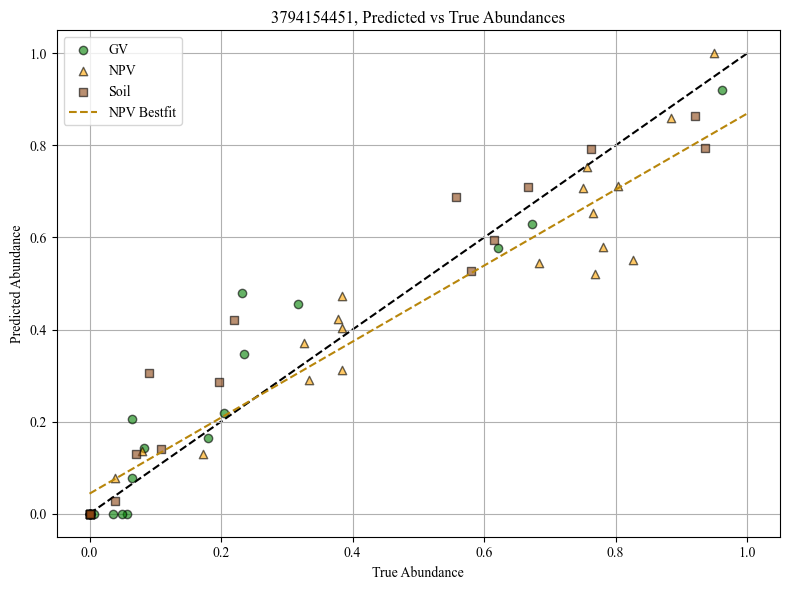

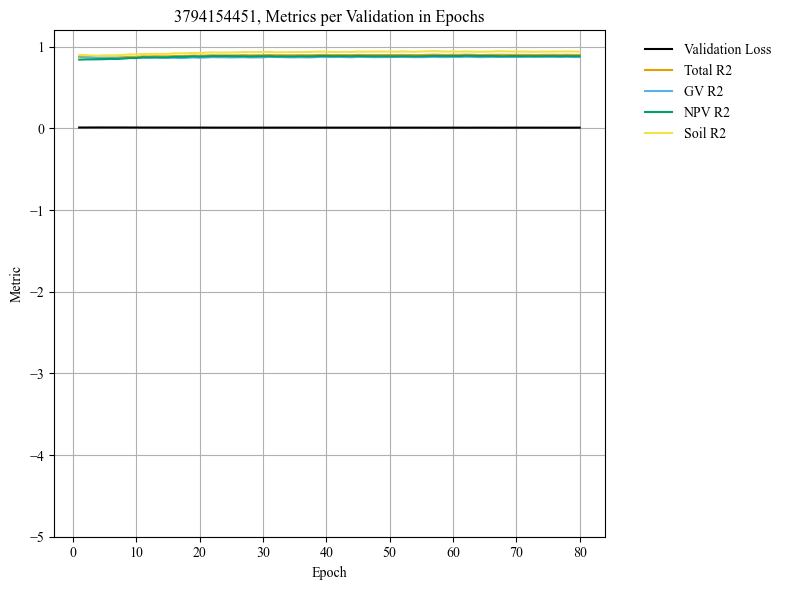

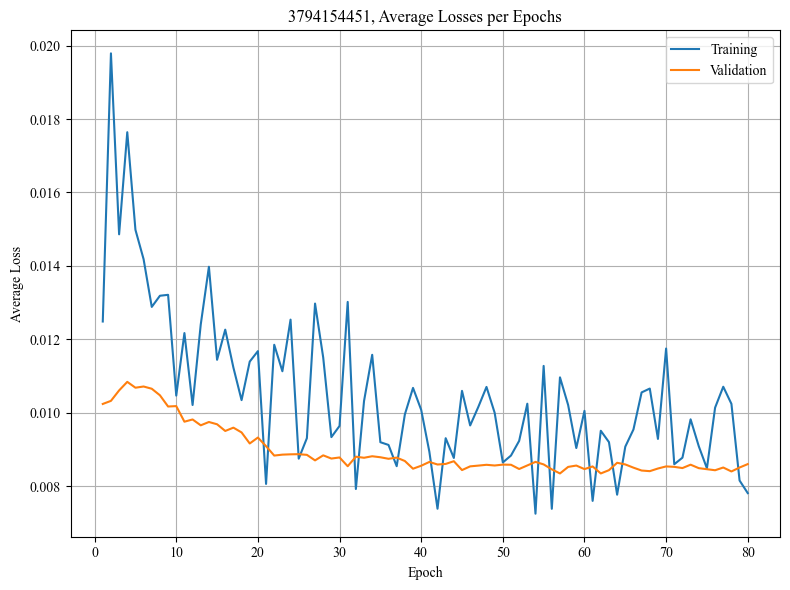

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009129
Epoch 1/80, Step 2/5, Train Loss: 0.011109
Epoch 1/80, Step 3/5, Train Loss: 0.011149
Epoch 1/80, Step 4/5, Train Loss: 0.021500
Epoch 1/80, Step 5/5, Train Loss: 0.017063
Epoch 1/80 complete. Train Loss: 0.013990, Val Loss: 0.007319
Epoch 2/80, Step 1/5, Train Loss: 0.024339
Epoch 2/80, Step 2/5, Train Loss: 0.026482
Epoch 2/80, Step 3/5, Train Loss: 0.008525
Epoch 2/80, Step 4/5, Train Loss: 0.005181
Epoch 2/80, Step 5/5, Train Loss: 0.013236
Epoch 2/80 complete. Train Loss: 0.015553, Val Loss: 0.006830
Epoch 3/80, Step 1/5, Train Loss: 0.014840
Epoch 3/80, Step 2/5, Train Loss: 0.016744
Epoch 3/80, Step 3/5, Train Loss: 0.019955
Epoch 3/80, Step 4/5, Train Loss: 0.016363
Epoch 3/80, Step 5/5, Train Loss: 0.005575
Epoch 3/80 complete. Train Loss: 0.014696, Val Loss: 0.006790
Epoch 4/80, Step 1/5, Train Loss: 0.017690
Epoch 4/80, Step 2/5, Train Loss: 0.009784
Epoch 4/80, Step 3/5, Train Loss: 0.009155
Epoch 4/80, Step 4/5, Train Loss: 0.0172

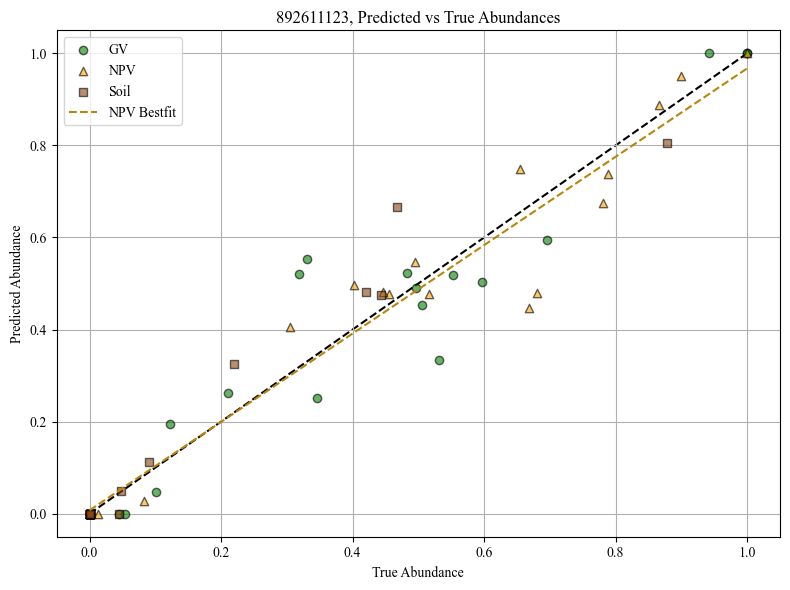

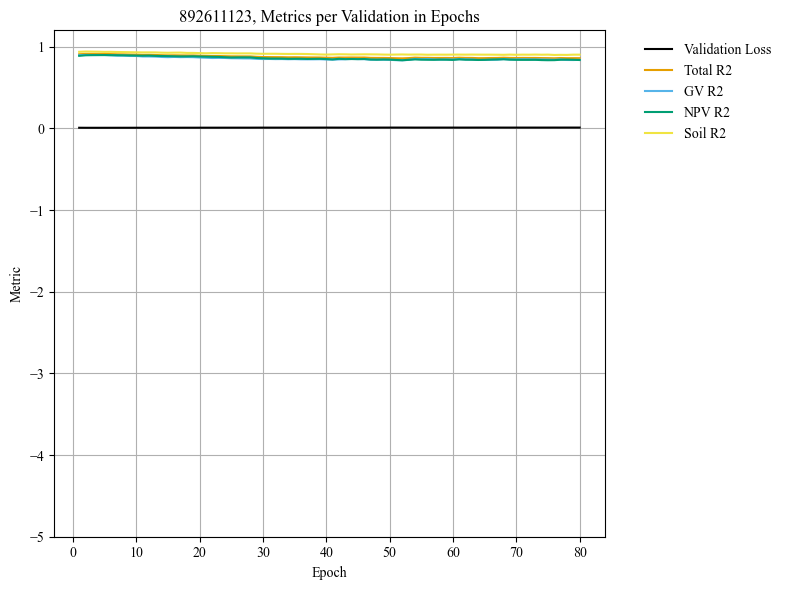

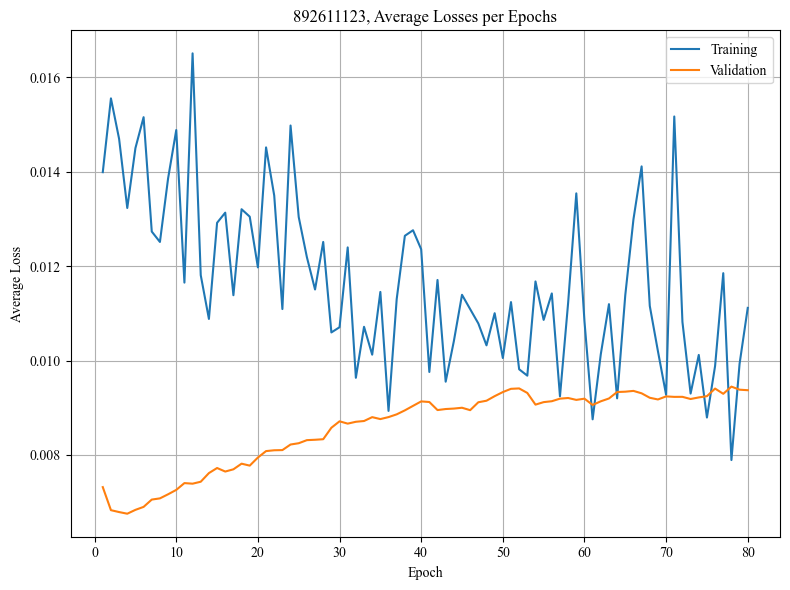

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007690
Epoch 1/80, Step 2/5, Train Loss: 0.016545
Epoch 1/80, Step 3/5, Train Loss: 0.014821
Epoch 1/80, Step 4/5, Train Loss: 0.020636
Epoch 1/80, Step 5/5, Train Loss: 0.008825
Epoch 1/80 complete. Train Loss: 0.013703, Val Loss: 0.009607
Epoch 2/80, Step 1/5, Train Loss: 0.009167
Epoch 2/80, Step 2/5, Train Loss: 0.011913
Epoch 2/80, Step 3/5, Train Loss: 0.009041
Epoch 2/80, Step 4/5, Train Loss: 0.007259
Epoch 2/80, Step 5/5, Train Loss: 0.004477
Epoch 2/80 complete. Train Loss: 0.008371, Val Loss: 0.009443
Epoch 3/80, Step 1/5, Train Loss: 0.012937
Epoch 3/80, Step 2/5, Train Loss: 0.011648
Epoch 3/80, Step 3/5, Train Loss: 0.010327
Epoch 3/80, Step 4/5, Train Loss: 0.011253
Epoch 3/80, Step 5/5, Train Loss: 0.006754
Epoch 3/80 complete. Train Loss: 0.010584, Val Loss: 0.009068
Epoch 4/80, Step 1/5, Train Loss: 0.015946
Epoch 4/80, Step 2/5, Train Loss: 0.008555
Epoch 4/80, Step 3/5, Train Loss: 0.011508
Epoch 4/80, Step 4/5, Train Loss: 0.0106

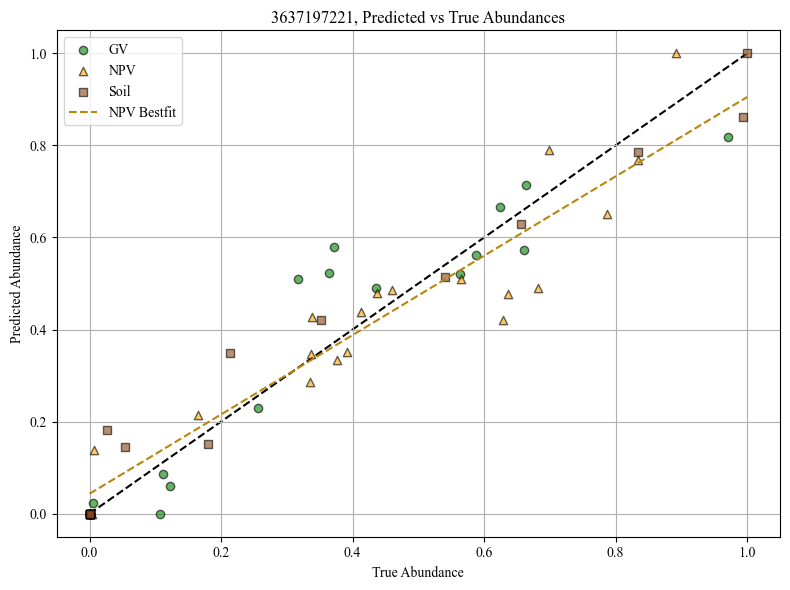

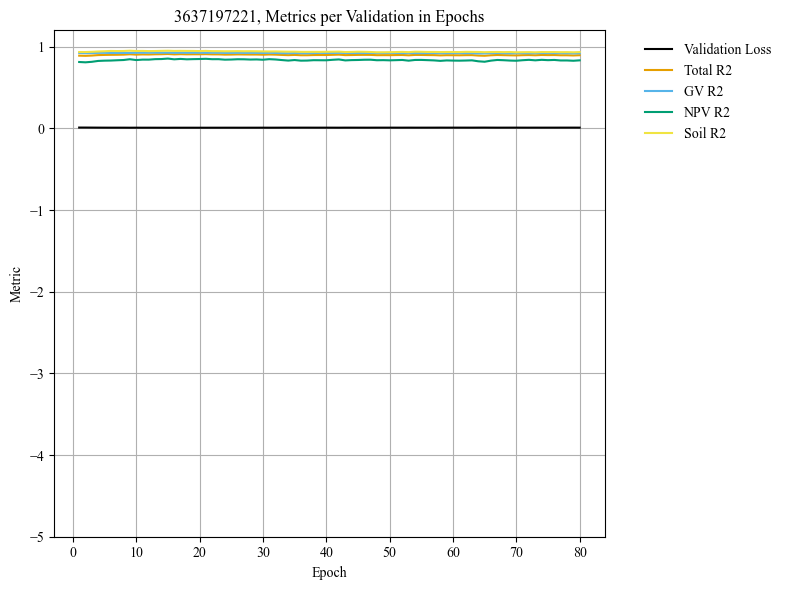

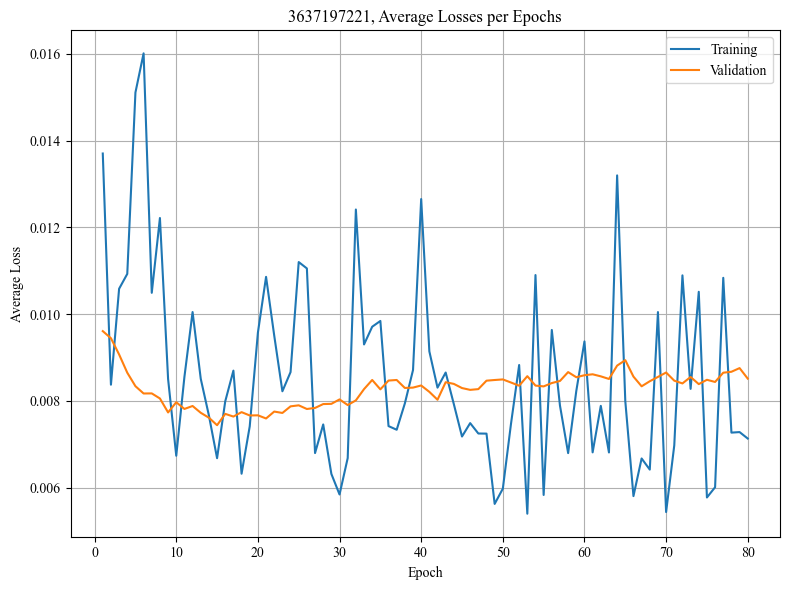

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.015477
Epoch 1/80, Step 2/5, Train Loss: 0.026729
Epoch 1/80, Step 3/5, Train Loss: 0.023565
Epoch 1/80, Step 4/5, Train Loss: 0.010228
Epoch 1/80, Step 5/5, Train Loss: 0.009234
Epoch 1/80 complete. Train Loss: 0.017046, Val Loss: 0.005751
Epoch 2/80, Step 1/5, Train Loss: 0.016204
Epoch 2/80, Step 2/5, Train Loss: 0.010441
Epoch 2/80, Step 3/5, Train Loss: 0.012014
Epoch 2/80, Step 4/5, Train Loss: 0.018749
Epoch 2/80, Step 5/5, Train Loss: 0.009785
Epoch 2/80 complete. Train Loss: 0.013439, Val Loss: 0.005533
Epoch 3/80, Step 1/5, Train Loss: 0.017131
Epoch 3/80, Step 2/5, Train Loss: 0.027268
Epoch 3/80, Step 3/5, Train Loss: 0.008039
Epoch 3/80, Step 4/5, Train Loss: 0.011480
Epoch 3/80, Step 5/5, Train Loss: 0.013437
Epoch 3/80 complete. Train Loss: 0.015471, Val Loss: 0.005237
Epoch 4/80, Step 1/5, Train Loss: 0.012856
Epoch 4/80, Step 2/5, Train Loss: 0.013596
Epoch 4/80, Step 3/5, Train Loss: 0.005166
Epoch 4/80, Step 4/5, Train Loss: 0.0306

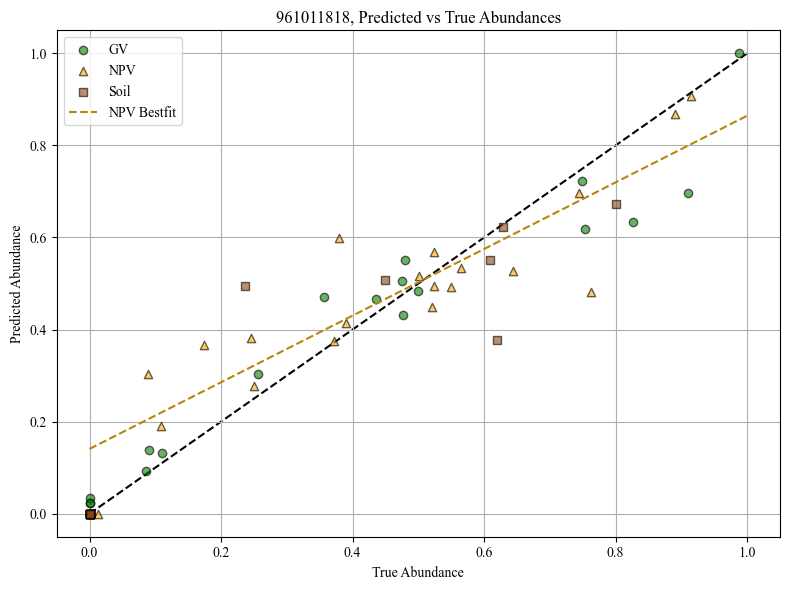

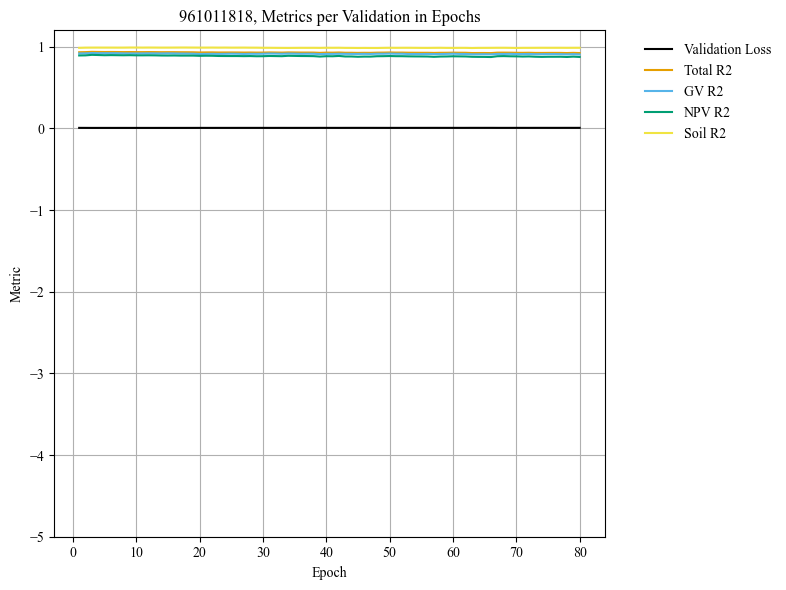

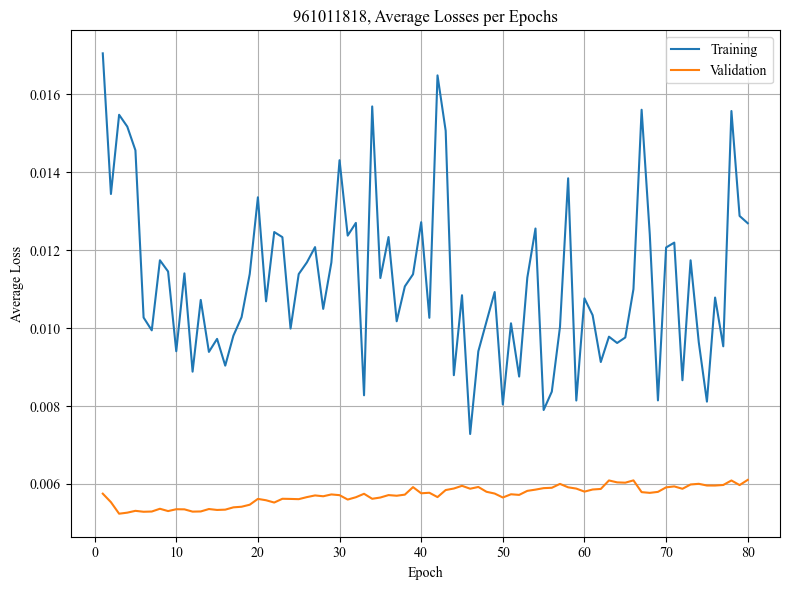

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018288
Epoch 1/80, Step 2/5, Train Loss: 0.015958
Epoch 1/80, Step 3/5, Train Loss: 0.009640
Epoch 1/80, Step 4/5, Train Loss: 0.015108
Epoch 1/80, Step 5/5, Train Loss: 0.013880
Epoch 1/80 complete. Train Loss: 0.014575, Val Loss: 0.007814
Epoch 2/80, Step 1/5, Train Loss: 0.020794
Epoch 2/80, Step 2/5, Train Loss: 0.011021
Epoch 2/80, Step 3/5, Train Loss: 0.007474
Epoch 2/80, Step 4/5, Train Loss: 0.009408
Epoch 2/80, Step 5/5, Train Loss: 0.010396
Epoch 2/80 complete. Train Loss: 0.011819, Val Loss: 0.006809
Epoch 3/80, Step 1/5, Train Loss: 0.014230
Epoch 3/80, Step 2/5, Train Loss: 0.024535
Epoch 3/80, Step 3/5, Train Loss: 0.005160
Epoch 3/80, Step 4/5, Train Loss: 0.011596
Epoch 3/80, Step 5/5, Train Loss: 0.008611
Epoch 3/80 complete. Train Loss: 0.012826, Val Loss: 0.006306
Epoch 4/80, Step 1/5, Train Loss: 0.009326
Epoch 4/80, Step 2/5, Train Loss: 0.008468
Epoch 4/80, Step 3/5, Train Loss: 0.007183
Epoch 4/80, Step 4/5, Train Loss: 0.0205

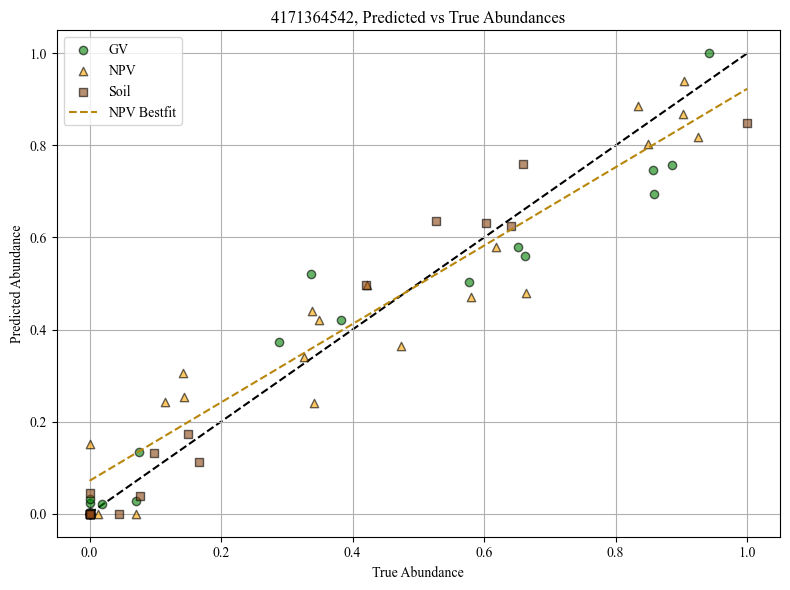

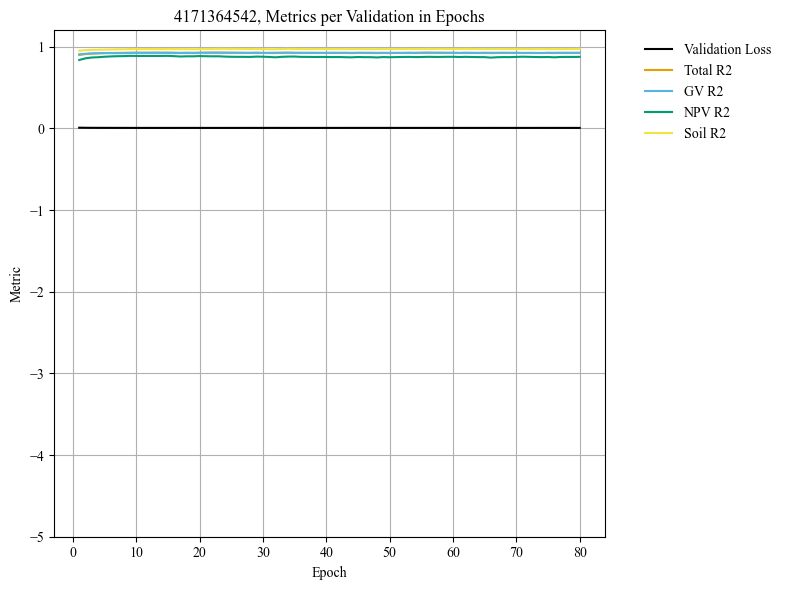

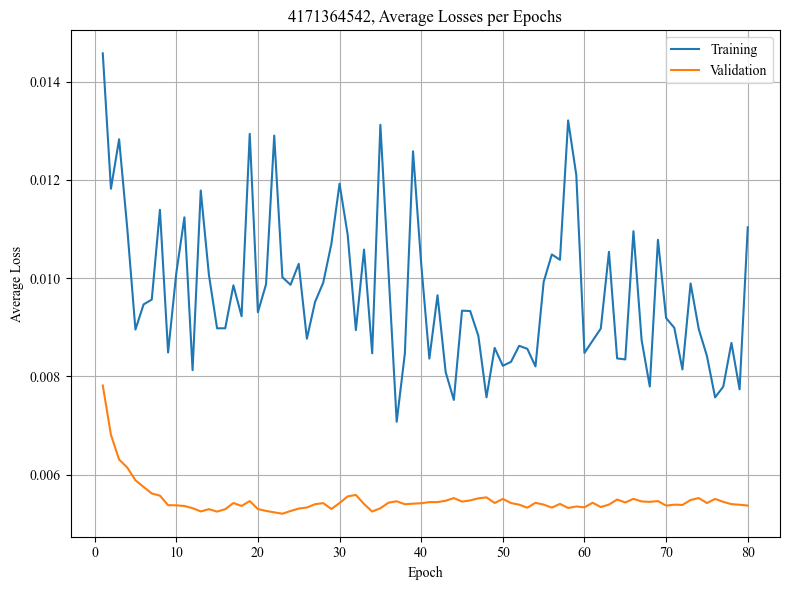

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007634
Epoch 1/80, Step 2/5, Train Loss: 0.011665
Epoch 1/80, Step 3/5, Train Loss: 0.028814
Epoch 1/80, Step 4/5, Train Loss: 0.010792
Epoch 1/80, Step 5/5, Train Loss: 0.011174
Epoch 1/80 complete. Train Loss: 0.014015, Val Loss: 0.011017
Epoch 2/80, Step 1/5, Train Loss: 0.015917
Epoch 2/80, Step 2/5, Train Loss: 0.010164
Epoch 2/80, Step 3/5, Train Loss: 0.013098
Epoch 2/80, Step 4/5, Train Loss: 0.008933
Epoch 2/80, Step 5/5, Train Loss: 0.013957
Epoch 2/80 complete. Train Loss: 0.012414, Val Loss: 0.010244
Epoch 3/80, Step 1/5, Train Loss: 0.012473
Epoch 3/80, Step 2/5, Train Loss: 0.015470
Epoch 3/80, Step 3/5, Train Loss: 0.013040
Epoch 3/80, Step 4/5, Train Loss: 0.009837
Epoch 3/80, Step 5/5, Train Loss: 0.021067
Epoch 3/80 complete. Train Loss: 0.014377, Val Loss: 0.009900
Epoch 4/80, Step 1/5, Train Loss: 0.012639
Epoch 4/80, Step 2/5, Train Loss: 0.017570
Epoch 4/80, Step 3/5, Train Loss: 0.010543
Epoch 4/80, Step 4/5, Train Loss: 0.0165

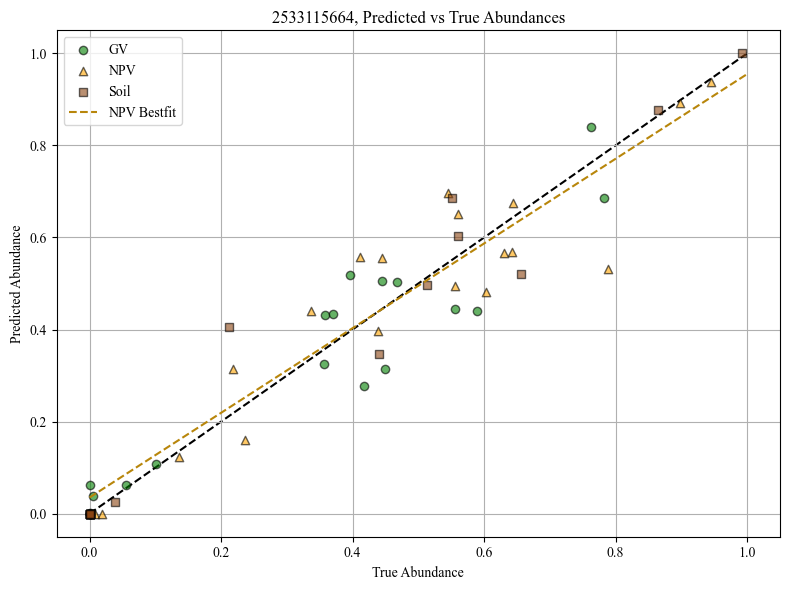

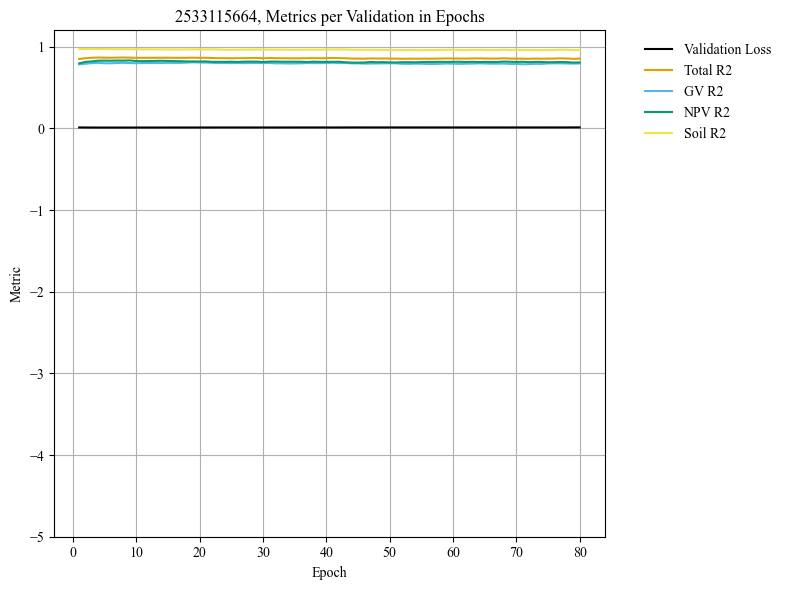

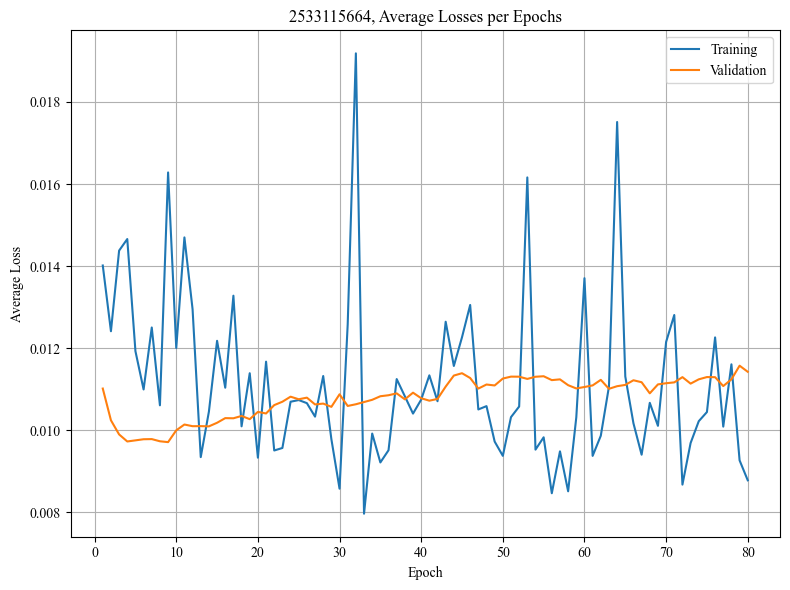

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.009847
Epoch 1/80, Step 2/5, Train Loss: 0.018214
Epoch 1/80, Step 3/5, Train Loss: 0.009024
Epoch 1/80, Step 4/5, Train Loss: 0.013360
Epoch 1/80, Step 5/5, Train Loss: 0.037459
Epoch 1/80 complete. Train Loss: 0.017581, Val Loss: 0.013358
Epoch 2/80, Step 1/5, Train Loss: 0.009068
Epoch 2/80, Step 2/5, Train Loss: 0.015482
Epoch 2/80, Step 3/5, Train Loss: 0.006641
Epoch 2/80, Step 4/5, Train Loss: 0.014928
Epoch 2/80, Step 5/5, Train Loss: 0.010382
Epoch 2/80 complete. Train Loss: 0.011300, Val Loss: 0.012729
Epoch 3/80, Step 1/5, Train Loss: 0.010567
Epoch 3/80, Step 2/5, Train Loss: 0.016073
Epoch 3/80, Step 3/5, Train Loss: 0.007989
Epoch 3/80, Step 4/5, Train Loss: 0.008460
Epoch 3/80, Step 5/5, Train Loss: 0.024786
Epoch 3/80 complete. Train Loss: 0.013575, Val Loss: 0.012590
Epoch 4/80, Step 1/5, Train Loss: 0.006568
Epoch 4/80, Step 2/5, Train Loss: 0.009590
Epoch 4/80, Step 3/5, Train Loss: 0.005332
Epoch 4/80, Step 4/5, Train Loss: 0.0061

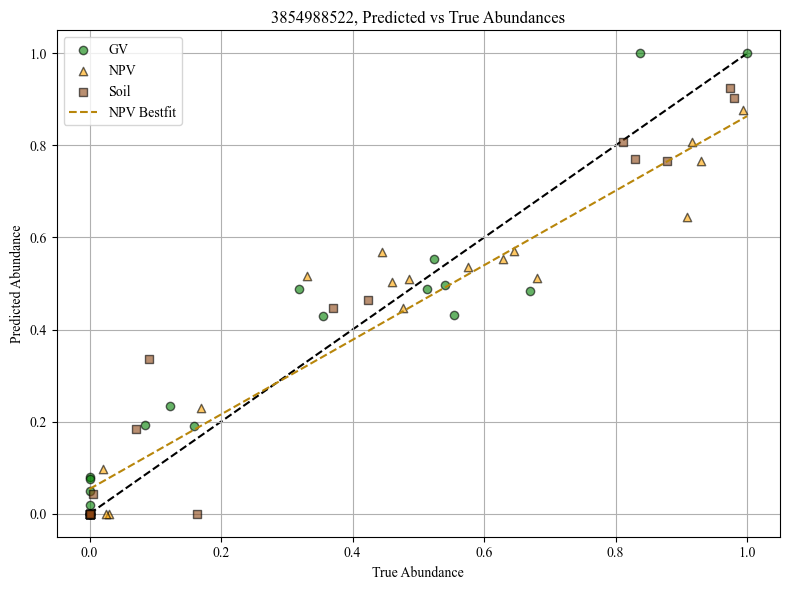

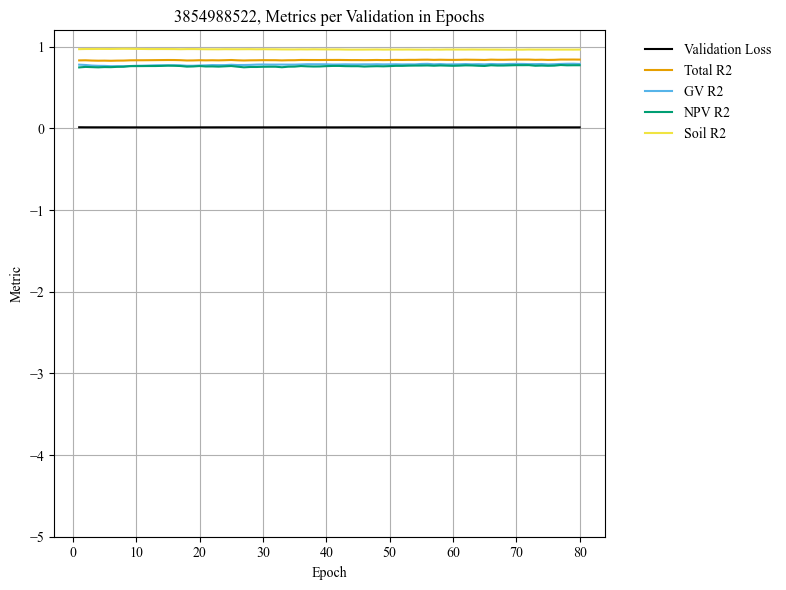

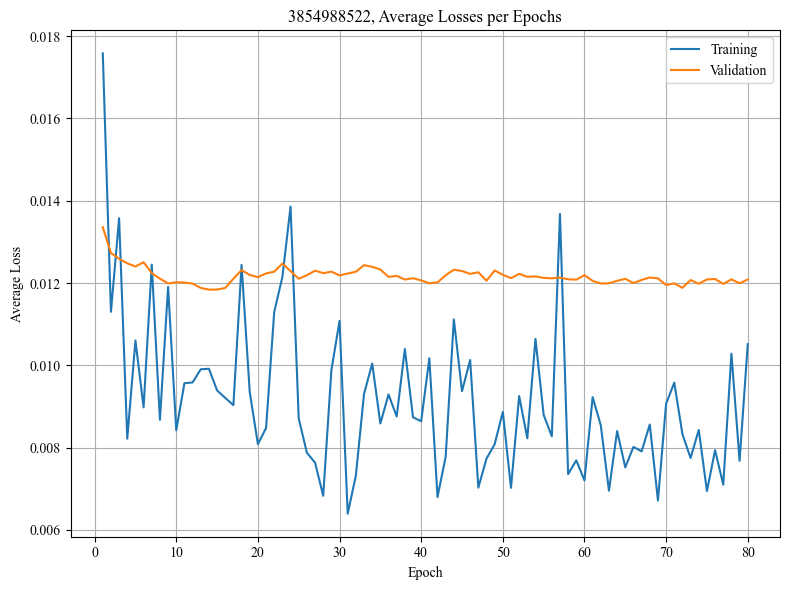

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.013675
Epoch 1/80, Step 2/5, Train Loss: 0.010382
Epoch 1/80, Step 3/5, Train Loss: 0.009993
Epoch 1/80, Step 4/5, Train Loss: 0.015549
Epoch 1/80, Step 5/5, Train Loss: 0.020511
Epoch 1/80 complete. Train Loss: 0.014022, Val Loss: 0.008904
Epoch 2/80, Step 1/5, Train Loss: 0.025563
Epoch 2/80, Step 2/5, Train Loss: 0.006031
Epoch 2/80, Step 3/5, Train Loss: 0.006829
Epoch 2/80, Step 4/5, Train Loss: 0.008215
Epoch 2/80, Step 5/5, Train Loss: 0.007780
Epoch 2/80 complete. Train Loss: 0.010884, Val Loss: 0.008980
Epoch 3/80, Step 1/5, Train Loss: 0.019315
Epoch 3/80, Step 2/5, Train Loss: 0.006998
Epoch 3/80, Step 3/5, Train Loss: 0.009830
Epoch 3/80, Step 4/5, Train Loss: 0.007961
Epoch 3/80, Step 5/5, Train Loss: 0.009905
Epoch 3/80 complete. Train Loss: 0.010802, Val Loss: 0.009039
Epoch 4/80, Step 1/5, Train Loss: 0.020815
Epoch 4/80, Step 2/5, Train Loss: 0.013760
Epoch 4/80, Step 3/5, Train Loss: 0.019230
Epoch 4/80, Step 4/5, Train Loss: 0.0085

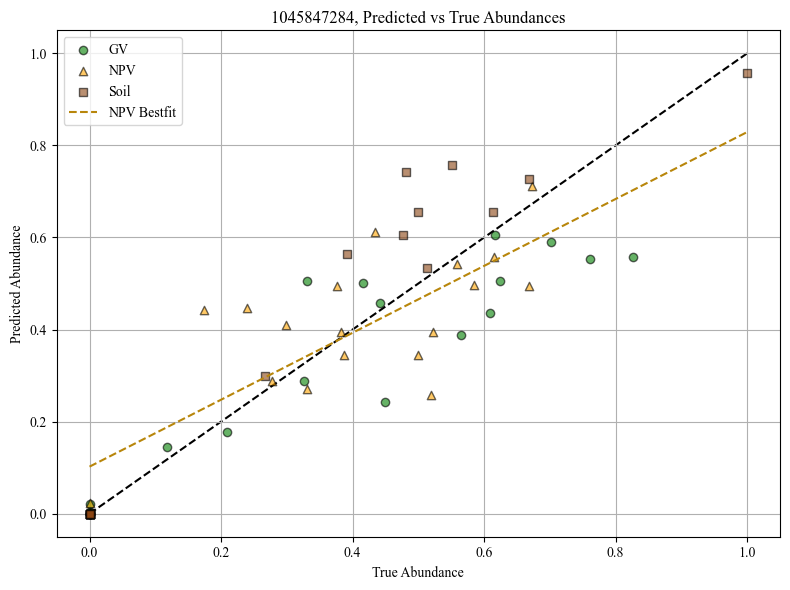

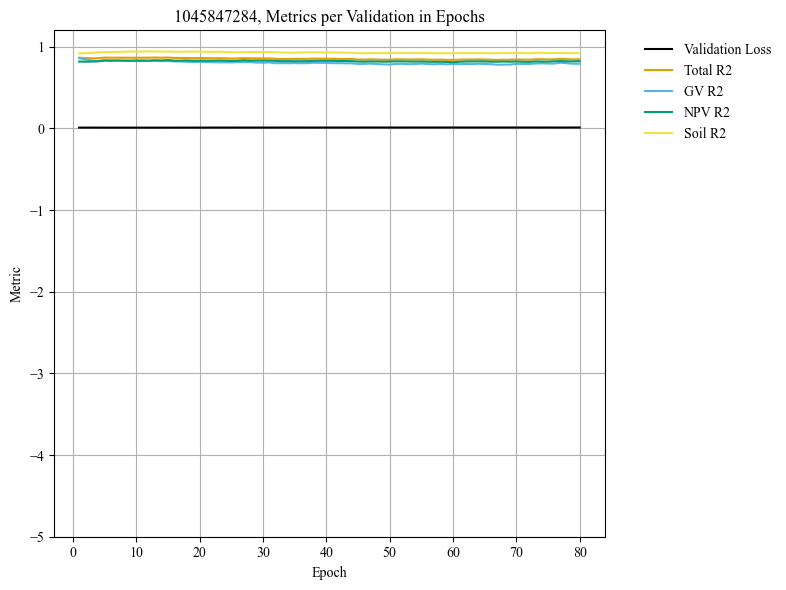

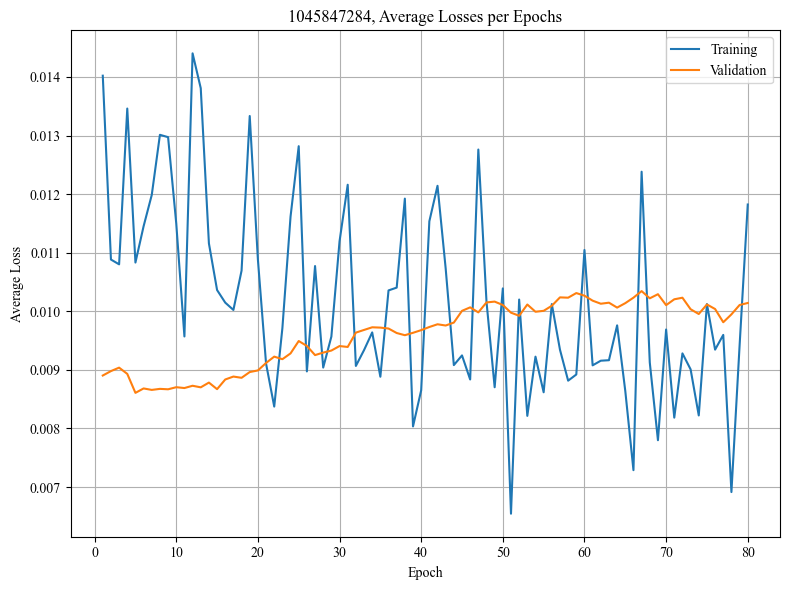

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.015160
Epoch 1/80, Step 2/5, Train Loss: 0.013215
Epoch 1/80, Step 3/5, Train Loss: 0.015679
Epoch 1/80, Step 4/5, Train Loss: 0.008089
Epoch 1/80, Step 5/5, Train Loss: 0.006466
Epoch 1/80 complete. Train Loss: 0.011722, Val Loss: 0.008242
Epoch 2/80, Step 1/5, Train Loss: 0.009693
Epoch 2/80, Step 2/5, Train Loss: 0.010647
Epoch 2/80, Step 3/5, Train Loss: 0.010582
Epoch 2/80, Step 4/5, Train Loss: 0.016538
Epoch 2/80, Step 5/5, Train Loss: 0.012337
Epoch 2/80 complete. Train Loss: 0.011959, Val Loss: 0.007490
Epoch 3/80, Step 1/5, Train Loss: 0.011888
Epoch 3/80, Step 2/5, Train Loss: 0.008146
Epoch 3/80, Step 3/5, Train Loss: 0.014378
Epoch 3/80, Step 4/5, Train Loss: 0.011744
Epoch 3/80, Step 5/5, Train Loss: 0.007220
Epoch 3/80 complete. Train Loss: 0.010675, Val Loss: 0.007334
Epoch 4/80, Step 1/5, Train Loss: 0.012130
Epoch 4/80, Step 2/5, Train Loss: 0.009141
Epoch 4/80, Step 3/5, Train Loss: 0.010190
Epoch 4/80, Step 4/5, Train Loss: 0.0088

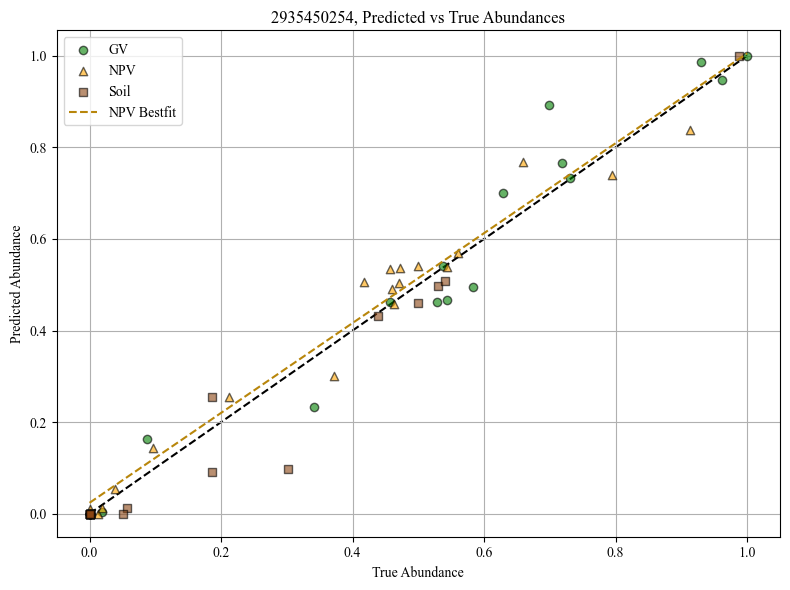

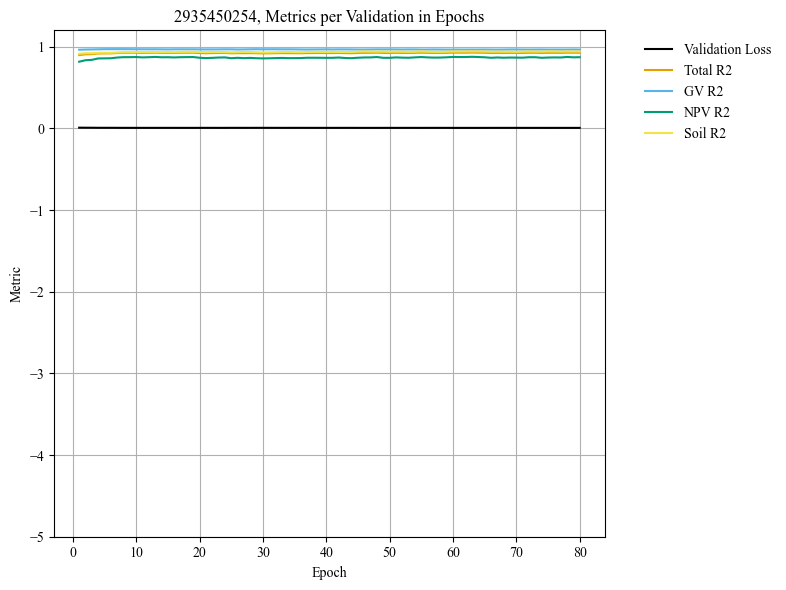

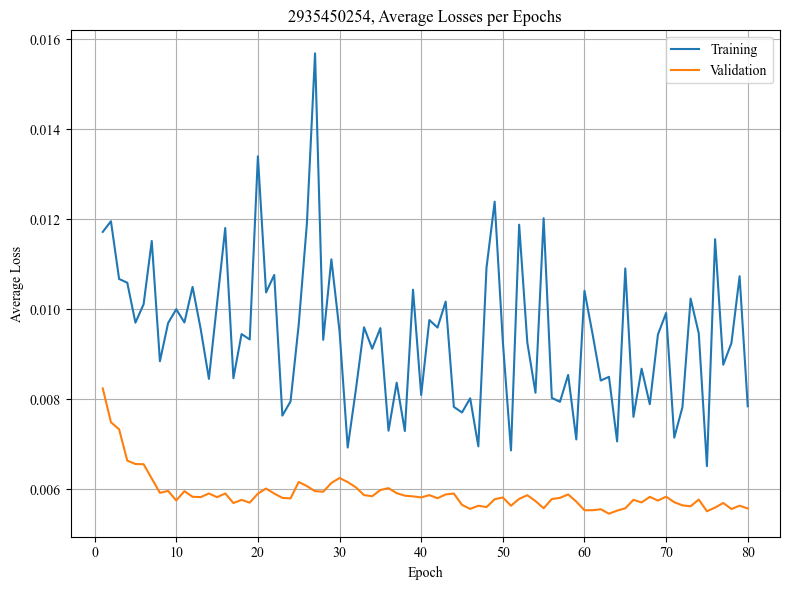

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010745
Epoch 1/80, Step 2/5, Train Loss: 0.013550
Epoch 1/80, Step 3/5, Train Loss: 0.020244
Epoch 1/80, Step 4/5, Train Loss: 0.015729
Epoch 1/80, Step 5/5, Train Loss: 0.018316
Epoch 1/80 complete. Train Loss: 0.015717, Val Loss: 0.008193
Epoch 2/80, Step 1/5, Train Loss: 0.013146
Epoch 2/80, Step 2/5, Train Loss: 0.014294
Epoch 2/80, Step 3/5, Train Loss: 0.011077
Epoch 2/80, Step 4/5, Train Loss: 0.011812
Epoch 2/80, Step 5/5, Train Loss: 0.013087
Epoch 2/80 complete. Train Loss: 0.012683, Val Loss: 0.007631
Epoch 3/80, Step 1/5, Train Loss: 0.016213
Epoch 3/80, Step 2/5, Train Loss: 0.008525
Epoch 3/80, Step 3/5, Train Loss: 0.012195
Epoch 3/80, Step 4/5, Train Loss: 0.006163
Epoch 3/80, Step 5/5, Train Loss: 0.006332
Epoch 3/80 complete. Train Loss: 0.009886, Val Loss: 0.007688
Epoch 4/80, Step 1/5, Train Loss: 0.008614
Epoch 4/80, Step 2/5, Train Loss: 0.010380
Epoch 4/80, Step 3/5, Train Loss: 0.011703
Epoch 4/80, Step 4/5, Train Loss: 0.0147

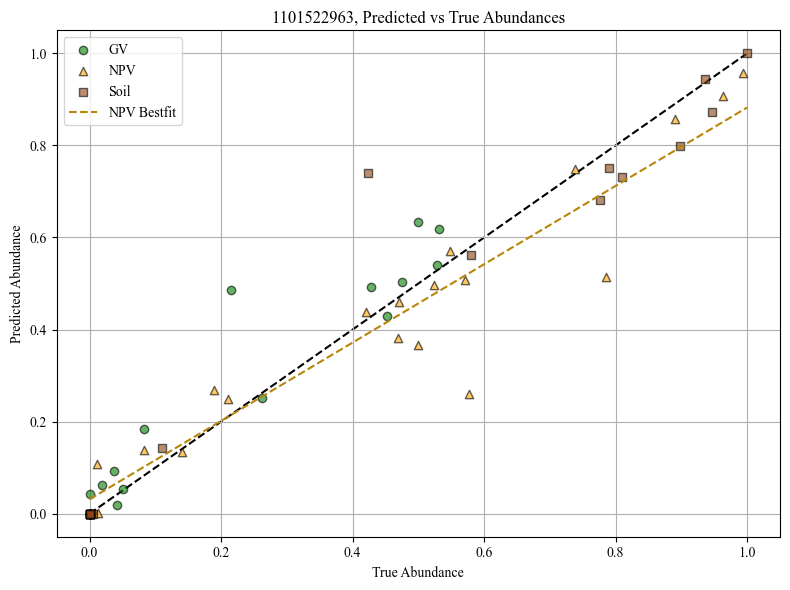

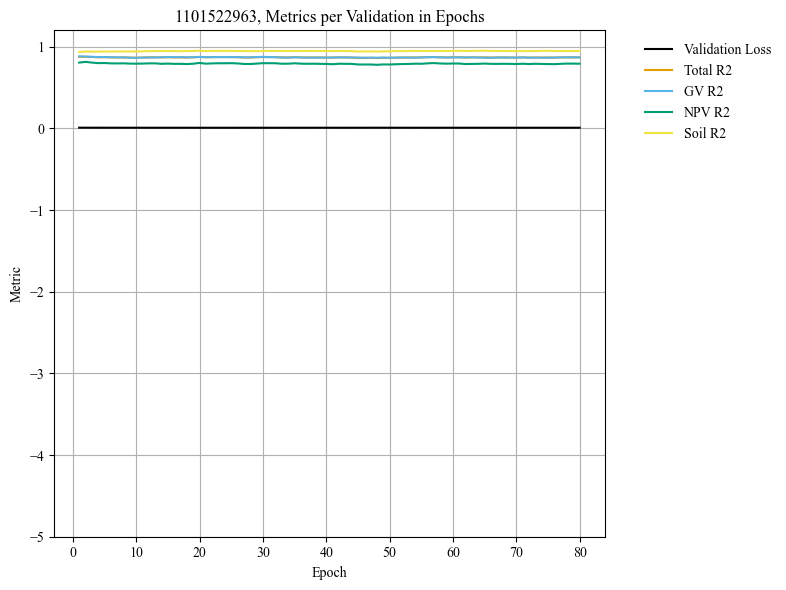

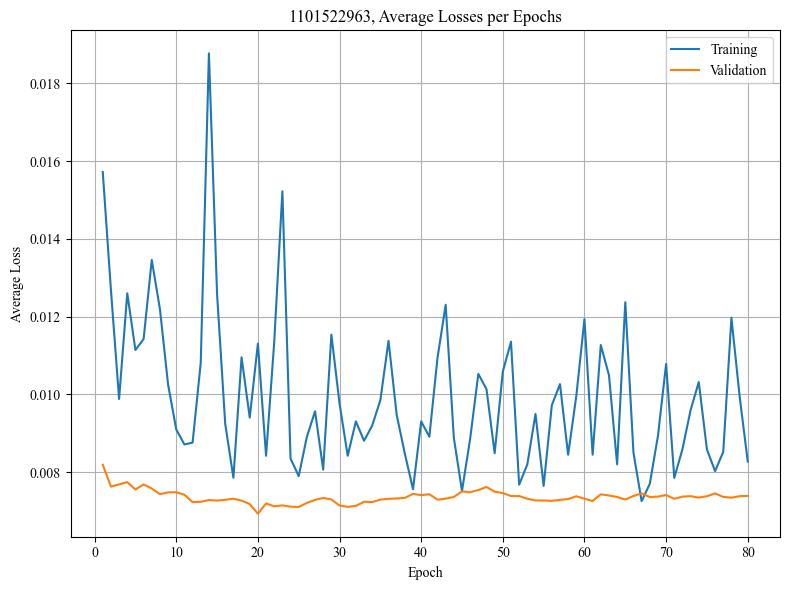

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.018358
Epoch 1/80, Step 2/5, Train Loss: 0.010935
Epoch 1/80, Step 3/5, Train Loss: 0.011066
Epoch 1/80, Step 4/5, Train Loss: 0.017219
Epoch 1/80, Step 5/5, Train Loss: 0.004475
Epoch 1/80 complete. Train Loss: 0.012411, Val Loss: 0.006771
Epoch 2/80, Step 1/5, Train Loss: 0.012471
Epoch 2/80, Step 2/5, Train Loss: 0.009796
Epoch 2/80, Step 3/5, Train Loss: 0.009244
Epoch 2/80, Step 4/5, Train Loss: 0.010466
Epoch 2/80, Step 5/5, Train Loss: 0.013032
Epoch 2/80 complete. Train Loss: 0.011002, Val Loss: 0.006712
Epoch 3/80, Step 1/5, Train Loss: 0.007910
Epoch 3/80, Step 2/5, Train Loss: 0.005932
Epoch 3/80, Step 3/5, Train Loss: 0.009874
Epoch 3/80, Step 4/5, Train Loss: 0.010890
Epoch 3/80, Step 5/5, Train Loss: 0.011310
Epoch 3/80 complete. Train Loss: 0.009183, Val Loss: 0.006857
Epoch 4/80, Step 1/5, Train Loss: 0.008294
Epoch 4/80, Step 2/5, Train Loss: 0.012516
Epoch 4/80, Step 3/5, Train Loss: 0.009467
Epoch 4/80, Step 4/5, Train Loss: 0.0101

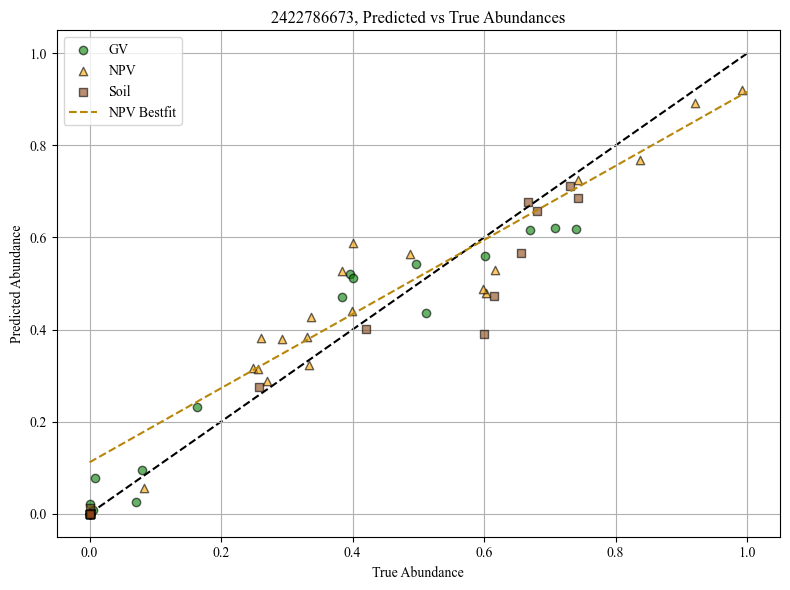

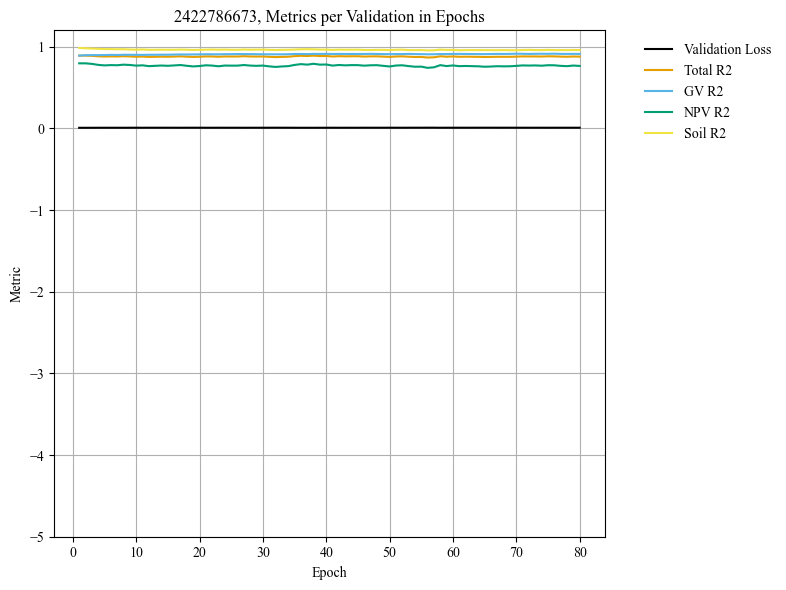

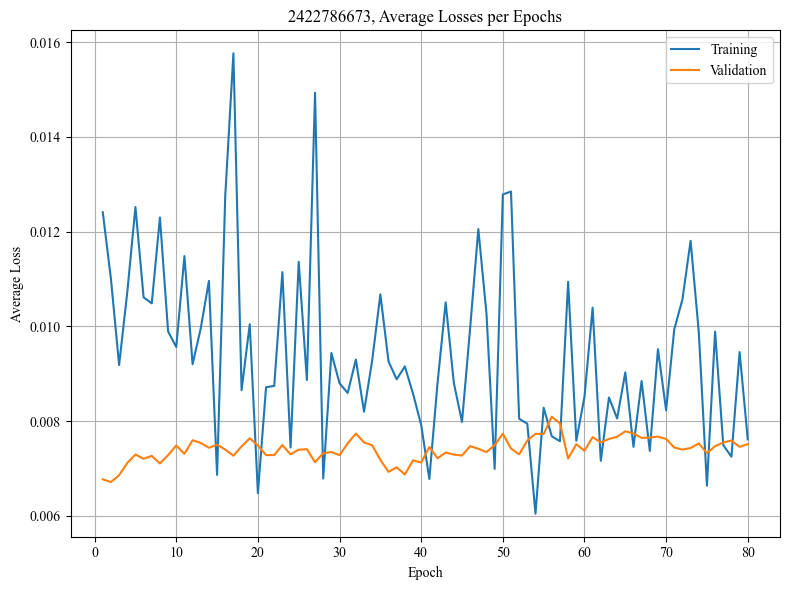

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.012143
Epoch 1/80, Step 2/5, Train Loss: 0.008359
Epoch 1/80, Step 3/5, Train Loss: 0.017845
Epoch 1/80, Step 4/5, Train Loss: 0.011352
Epoch 1/80, Step 5/5, Train Loss: 0.004773
Epoch 1/80 complete. Train Loss: 0.010895, Val Loss: 0.007961
Epoch 2/80, Step 1/5, Train Loss: 0.011236
Epoch 2/80, Step 2/5, Train Loss: 0.008860
Epoch 2/80, Step 3/5, Train Loss: 0.013641
Epoch 2/80, Step 4/5, Train Loss: 0.010895
Epoch 2/80, Step 5/5, Train Loss: 0.015816
Epoch 2/80 complete. Train Loss: 0.012089, Val Loss: 0.007581
Epoch 3/80, Step 1/5, Train Loss: 0.013606
Epoch 3/80, Step 2/5, Train Loss: 0.006219
Epoch 3/80, Step 3/5, Train Loss: 0.011298
Epoch 3/80, Step 4/5, Train Loss: 0.004607
Epoch 3/80, Step 5/5, Train Loss: 0.007370
Epoch 3/80 complete. Train Loss: 0.008620, Val Loss: 0.007535
Epoch 4/80, Step 1/5, Train Loss: 0.008367
Epoch 4/80, Step 2/5, Train Loss: 0.005794
Epoch 4/80, Step 3/5, Train Loss: 0.015072
Epoch 4/80, Step 4/5, Train Loss: 0.0078

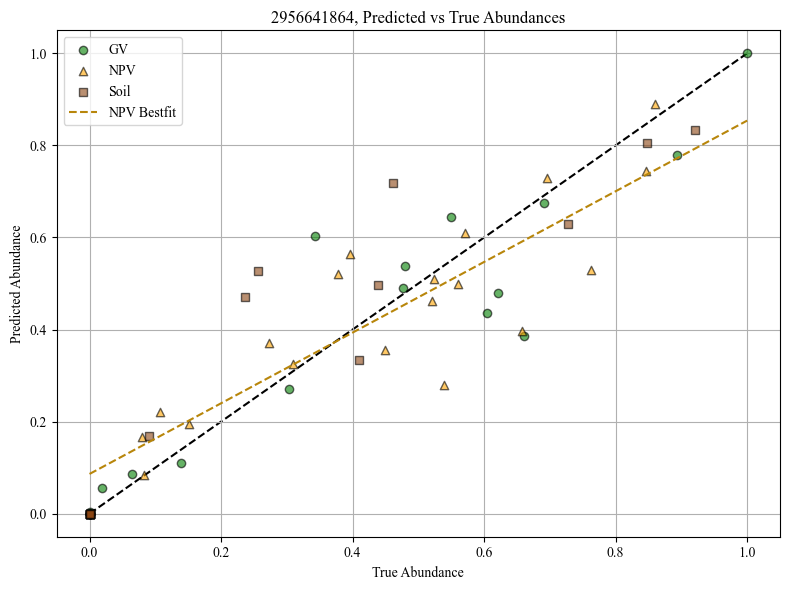

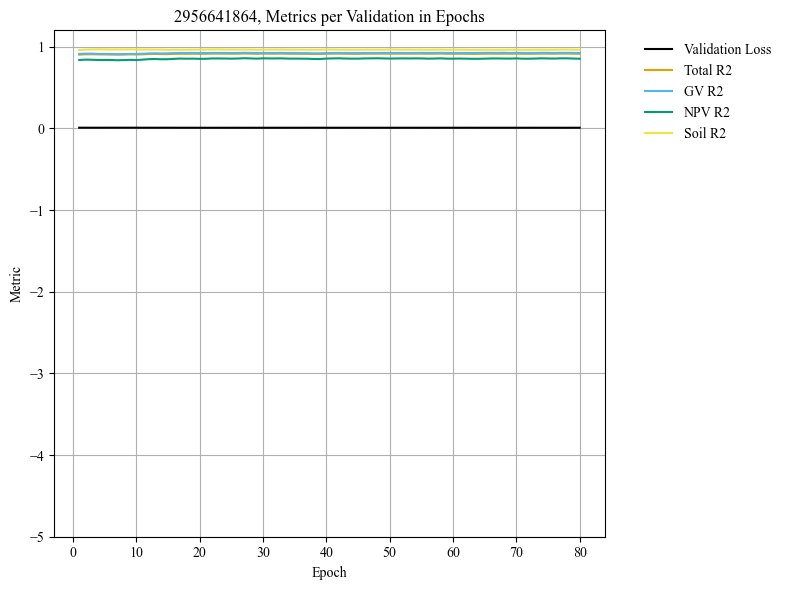

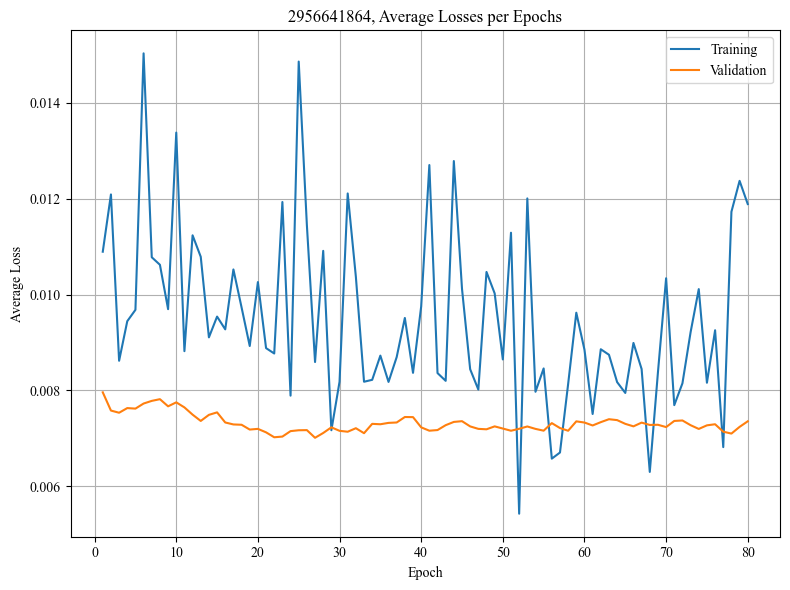

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.004831
Epoch 1/80, Step 2/5, Train Loss: 0.007375
Epoch 1/80, Step 3/5, Train Loss: 0.012474
Epoch 1/80, Step 4/5, Train Loss: 0.008152
Epoch 1/80, Step 5/5, Train Loss: 0.011330
Epoch 1/80 complete. Train Loss: 0.008832, Val Loss: 0.008275
Epoch 2/80, Step 1/5, Train Loss: 0.008184
Epoch 2/80, Step 2/5, Train Loss: 0.010164
Epoch 2/80, Step 3/5, Train Loss: 0.017554
Epoch 2/80, Step 4/5, Train Loss: 0.012288
Epoch 2/80, Step 5/5, Train Loss: 0.006737
Epoch 2/80 complete. Train Loss: 0.010986, Val Loss: 0.007555
Epoch 3/80, Step 1/5, Train Loss: 0.009192
Epoch 3/80, Step 2/5, Train Loss: 0.008370
Epoch 3/80, Step 3/5, Train Loss: 0.010971
Epoch 3/80, Step 4/5, Train Loss: 0.009872
Epoch 3/80, Step 5/5, Train Loss: 0.006300
Epoch 3/80 complete. Train Loss: 0.008941, Val Loss: 0.007183
Epoch 4/80, Step 1/5, Train Loss: 0.010192
Epoch 4/80, Step 2/5, Train Loss: 0.014593
Epoch 4/80, Step 3/5, Train Loss: 0.006443
Epoch 4/80, Step 4/5, Train Loss: 0.0084

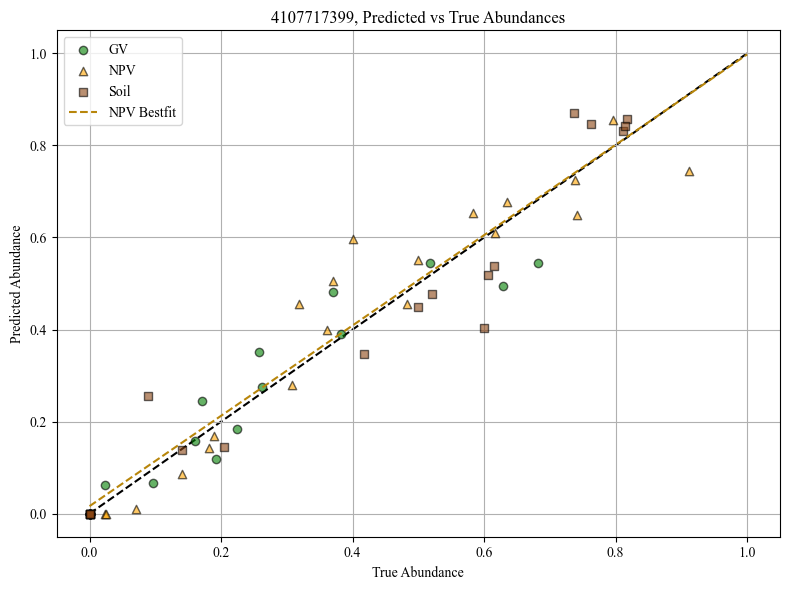

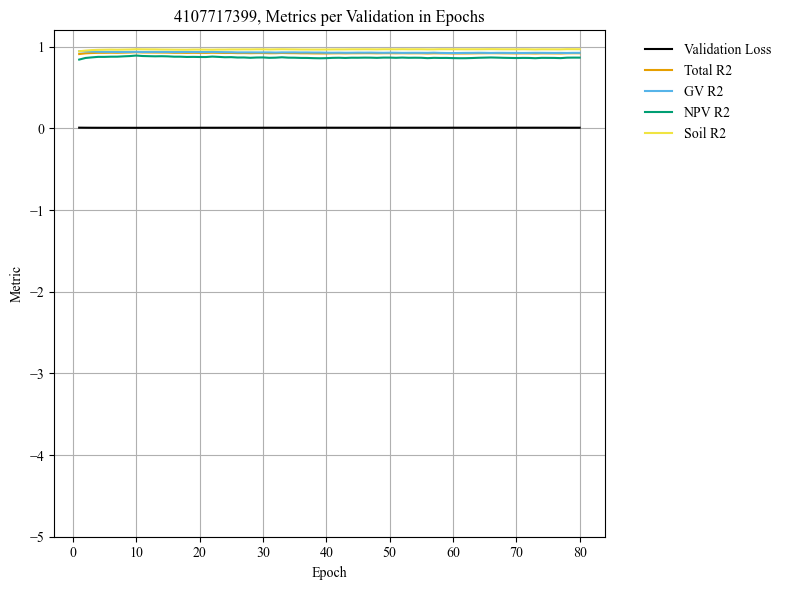

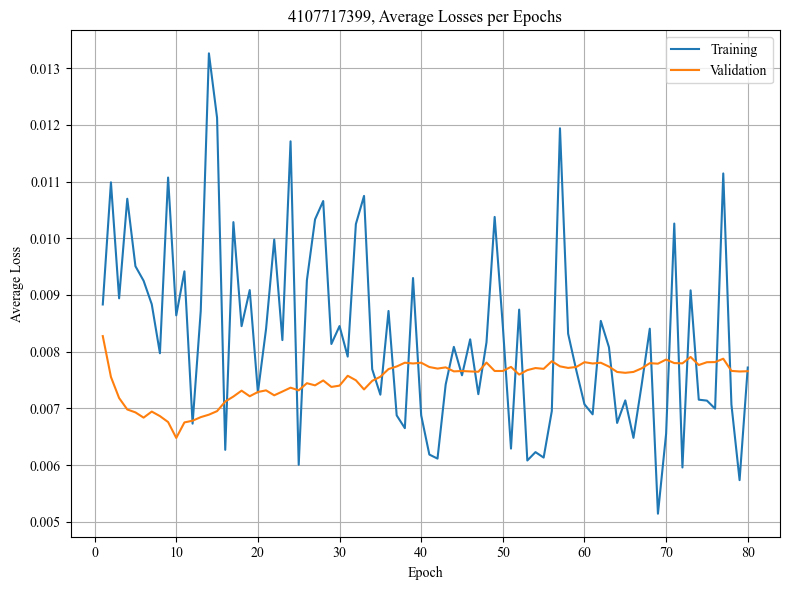

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.007071
Epoch 1/80, Step 2/5, Train Loss: 0.004959
Epoch 1/80, Step 3/5, Train Loss: 0.006124
Epoch 1/80, Step 4/5, Train Loss: 0.019883
Epoch 1/80, Step 5/5, Train Loss: 0.015385
Epoch 1/80 complete. Train Loss: 0.010684, Val Loss: 0.004892
Epoch 2/80, Step 1/5, Train Loss: 0.014512
Epoch 2/80, Step 2/5, Train Loss: 0.010844
Epoch 2/80, Step 3/5, Train Loss: 0.008922
Epoch 2/80, Step 4/5, Train Loss: 0.006316
Epoch 2/80, Step 5/5, Train Loss: 0.009850
Epoch 2/80 complete. Train Loss: 0.010089, Val Loss: 0.004770
Epoch 3/80, Step 1/5, Train Loss: 0.011809
Epoch 3/80, Step 2/5, Train Loss: 0.007190
Epoch 3/80, Step 3/5, Train Loss: 0.006557
Epoch 3/80, Step 4/5, Train Loss: 0.018475
Epoch 3/80, Step 5/5, Train Loss: 0.007963
Epoch 3/80 complete. Train Loss: 0.010399, Val Loss: 0.004652
Epoch 4/80, Step 1/5, Train Loss: 0.013913
Epoch 4/80, Step 2/5, Train Loss: 0.008089
Epoch 4/80, Step 3/5, Train Loss: 0.010238
Epoch 4/80, Step 4/5, Train Loss: 0.0059

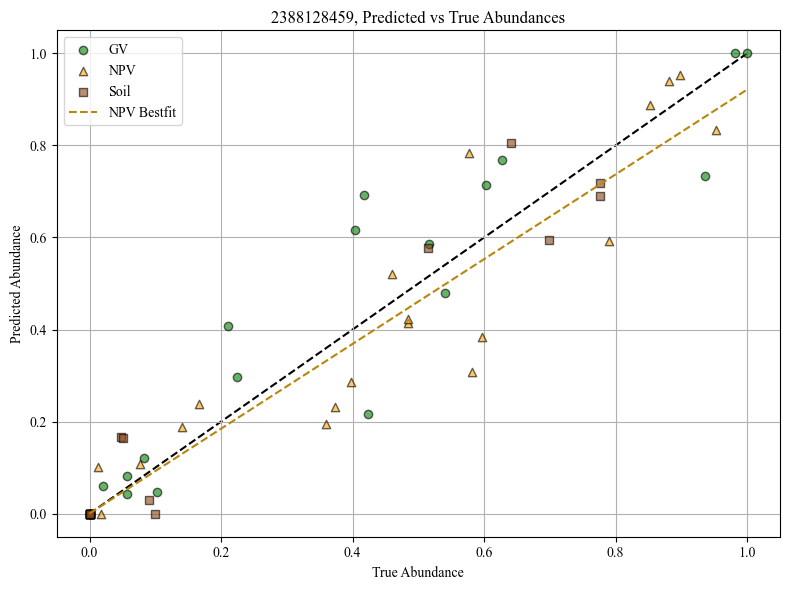

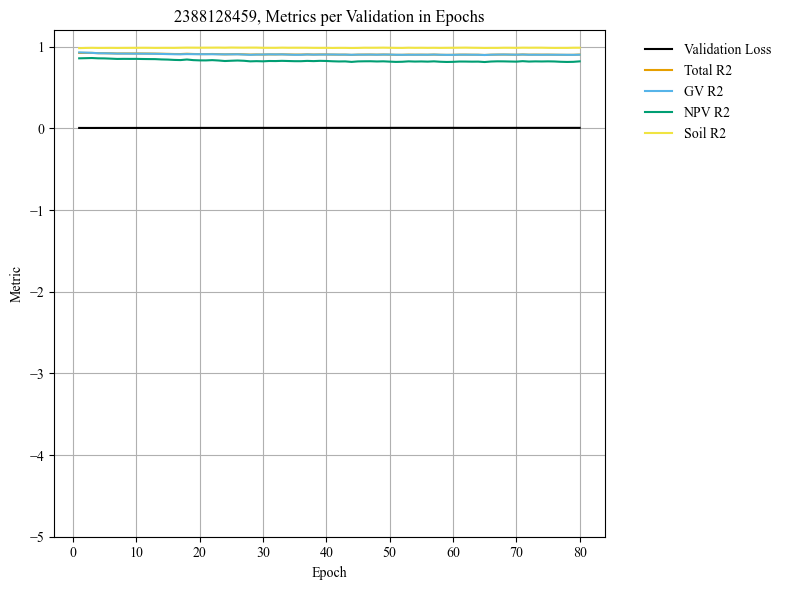

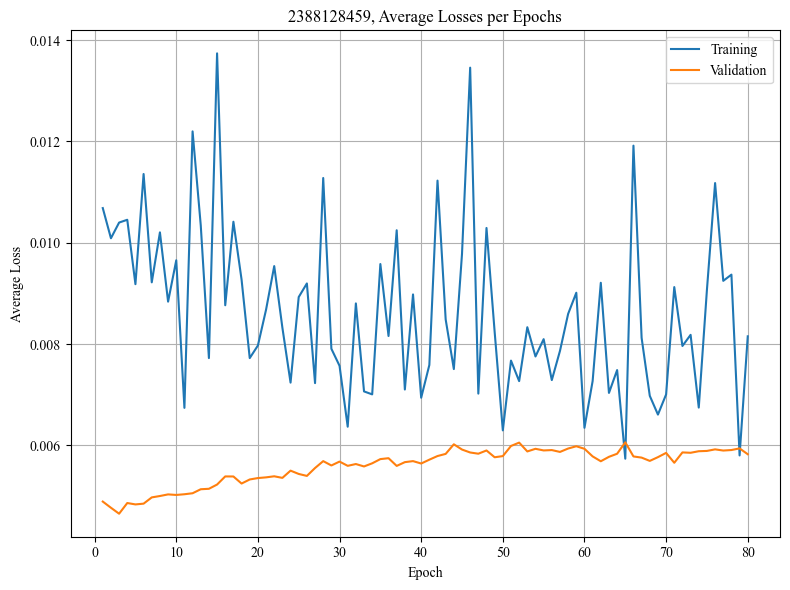

Testing complete


C:\SenkDosya\Projects\FINCH-Science_Unmixing\src\dl\loaders.py:31: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(statedict_path, map_locatio

Epoch 1/80, Step 1/5, Train Loss: 0.010139
Epoch 1/80, Step 2/5, Train Loss: 0.010709
Epoch 1/80, Step 3/5, Train Loss: 0.011299
Epoch 1/80, Step 4/5, Train Loss: 0.018048
Epoch 1/80, Step 5/5, Train Loss: 0.008531
Epoch 1/80 complete. Train Loss: 0.011745, Val Loss: 0.013065
Epoch 2/80, Step 1/5, Train Loss: 0.010646
Epoch 2/80, Step 2/5, Train Loss: 0.011874
Epoch 2/80, Step 3/5, Train Loss: 0.014148
Epoch 2/80, Step 4/5, Train Loss: 0.014243
Epoch 2/80, Step 5/5, Train Loss: 0.012120
Epoch 2/80 complete. Train Loss: 0.012606, Val Loss: 0.011809
Epoch 3/80, Step 1/5, Train Loss: 0.018447
Epoch 3/80, Step 2/5, Train Loss: 0.014723
Epoch 3/80, Step 3/5, Train Loss: 0.011194
Epoch 3/80, Step 4/5, Train Loss: 0.013337
Epoch 3/80, Step 5/5, Train Loss: 0.015821
Epoch 3/80 complete. Train Loss: 0.014704, Val Loss: 0.011264
Epoch 4/80, Step 1/5, Train Loss: 0.012865
Epoch 4/80, Step 2/5, Train Loss: 0.011607
Epoch 4/80, Step 3/5, Train Loss: 0.009743
Epoch 4/80, Step 4/5, Train Loss: 0.0079

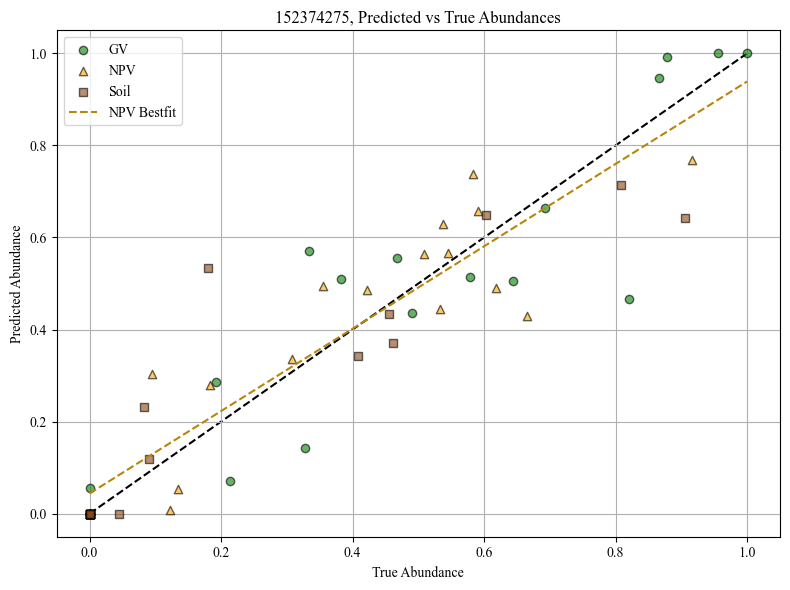

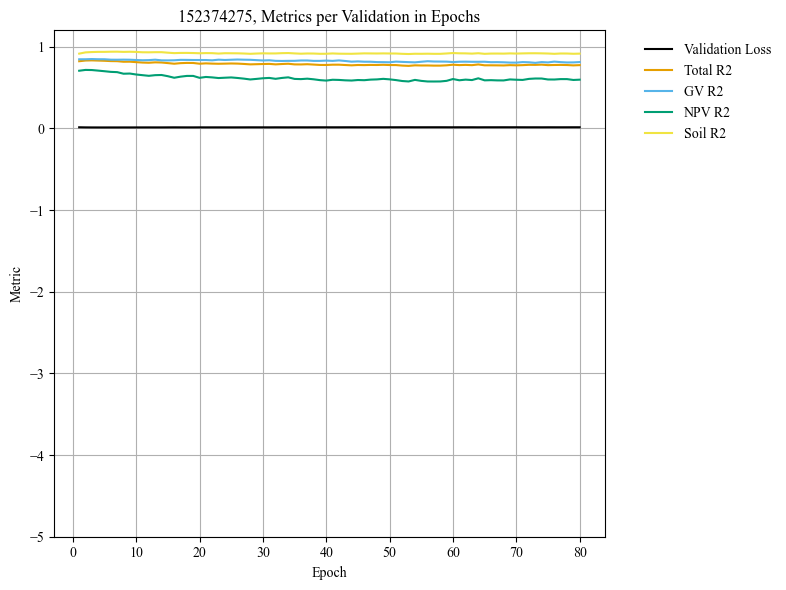

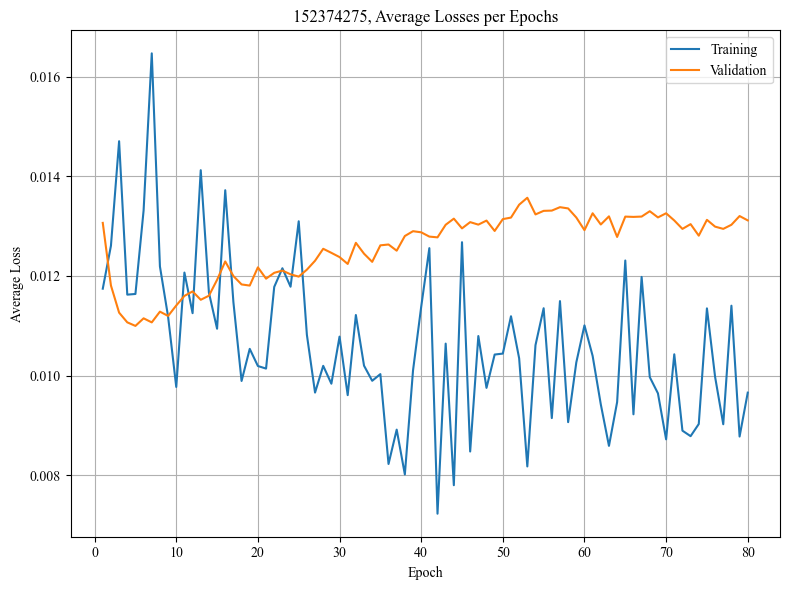

Testing complete


In [16]:
# Run the monte carlo cross validation loop

mlp_128_4layer_dict = {}

for seed in mccv_seeds:
    torch.manual_seed(seed) # Set this as the global seed for all random ops in torch and numpy, just to be safe
    np.random.default_rng(seed)

    dataloaders = get_data(save_path=save_path, seed=seed, spec_range=[900, 1690], batch_size=batch_size, n_train=n_train, n_val=n_val, n_test=n_test)
    model = load_frozen(model_cfg, statedict_path, 'MLP').to(device)
    active_params = filter(lambda p: p.requires_grad, model.parameters()) # Filter the active params only
    optimizer = torch.optim.AdamW(active_params, lr=lr, weight_decay=weight_decay) # Only pass in the active params to the optim
    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epoch*n_tb_epoch, eta_min=1e-6)
    loss = nn.MSELoss()

    model_dict = train_model(
        model=model,
        loss_fn=loss,
        optimizer=optimizer,
        lr_scheduler=lr_scheduler,
        configured_data=dataloaders,
        n_epoch=epoch,
        n_tb_epoch=n_tb_epoch,
        device=device,
        dtype=torch.float32,
        save_dir=str(seed),
        model_name=str(seed),
        save_artifacts=True # Will only save metrics, artifacts are unnecessary
    )
    
    mlp_128_4layer_dict[seed] = model_dict

In [17]:
import pickle
with open('mlp_128_4layer_dict.pkl', 'wb') as fp:
    pickle.dump(mlp_128_4layer_dict, fp)

--- NPV R^2 MCCV Results (M=50) ---
Mean (μ):  0.7959
Std (σ):   ±0.1393
Min ... Max: 0.2039 ... 0.9633
Final Reported Metric: 0.7959 ± 0.1393


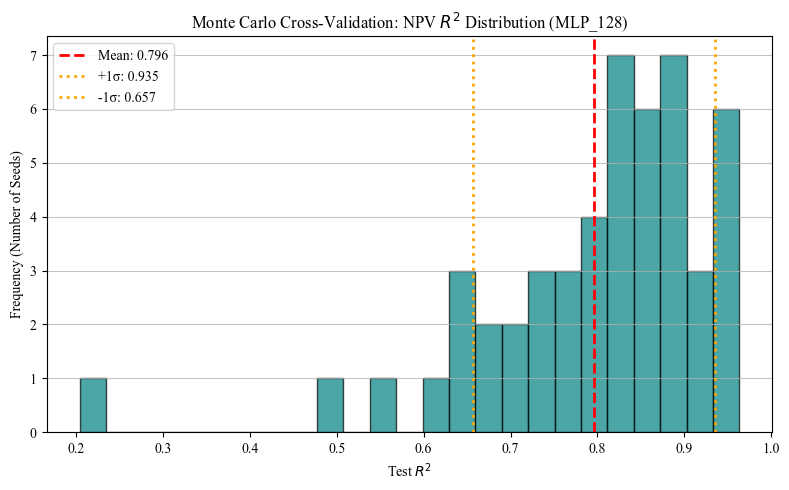

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Extract the NPV R2 metrics
npv_r2_list = [
    model_dict['metrics_total'][0][5] 
    for seed, model_dict in mlp_128_4layer_dict.items()
]
npv_r2_array = np.array(npv_r2_list)

# Calculate the core statistical bounds
# Used ddof=1 for the unbiased sample standard deviation
mu_npv = np.mean(npv_r2_array)
sigma_npv = np.std(npv_r2_array, ddof=1)
min_npv = np.min(npv_r2_array)
max_npv = np.max(npv_r2_array)

# Plot stuff
print(f"NPV R^2 MCCV Results (M={len(npv_r2_array)}) ---")
print(f"Mean (μ): {mu_npv:.4f}")
print(f"Std (σ): ±{sigma_npv:.4f}")
print(f"Min-Max: {min_npv:.4f}-{max_npv:.4f}")
print(f"Final Reported Metric: {mu_npv:.4f} ± {sigma_npv:.4f}")
plt.figure(figsize=(8, 5))
plt.hist(npv_r2_array, bins=25, color='teal', edgecolor='black', alpha=0.7)
plt.axvline(mu_npv, color='red', linestyle='dashed', linewidth=2, label=f'Mean: {mu_npv:.3f}')
plt.axvline(mu_npv + sigma_npv, color='orange', linestyle='dotted', linewidth=2, label=f'+1σ: {(mu_npv + sigma_npv):.3f}')
plt.axvline(mu_npv - sigma_npv, color='orange', linestyle='dotted', linewidth=2, label=f'-1σ: {(mu_npv - sigma_npv):.3f}')
plt.title('Monte Carlo Cross-Validation: NPV $R^2$ Distribution (MLP_128_4Layer)')
plt.xlabel('Test $R^2$')
plt.ylabel('Frequency (Number of Seeds)')
plt.legend()
plt.grid(axis='y', alpha=0.75)
plt.tight_layout()
plt.savefig('mccv_npv_r2_distribution.svg')
plt.show()